# 1 Environment Settings and Data Importing

In [1]:
import os
import gc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from numpy.polynomial import Polynomial
from collections import Counter
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import arma_order_select_ic
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima.arima import auto_arima

from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
# from pmdarima import auto_arima


In [2]:
# Data import
data = pd.read_csv('./Chinese Stock Market/CL.csv')
tradedays = pd.read_csv('./Chinese Stock Market/tradedays.csv')
data.index=tradedays['0']
data=data.iloc[:,1:]

In [3]:
data

,0,1,2,3,4,5,6,7,8,9,...,5311,5312,5313,5314,5315,5316,5317,5318,5319,5320
0,,,,,,,,,,,,,,,,,,,,,
2018-01-02,1456.43,4470.49,NaN,90.79,40.04,327.21,138.00,193.40,53.69,59.04,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-03,1417.10,4438.91,NaN,96.72,39.57,327.21,138.00,192.96,54.43,59.58,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-04,1408.59,4547.38,NaN,94.44,39.76,327.21,138.00,191.41,56.04,59.04,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-05,1413.91,4772.55,NaN,94.20,40.22,327.21,138.00,188.55,55.38,60.77,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-08,1377.76,4941.43,NaN,92.82,40.50,327.21,138.00,186.78,55.16,66.80,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,1454.97,3174.78,NaN,38.44,17.05,235.19,65.19,51.99,112.42,41.37,...,13.50,12.45,NaN,NaN,6.06,3.33,10.49,36.42,8.48,NaN
2022-12-27,1493.70,3198.97,NaN,39.42,17.52,258.56,64.94,52.44,109.22,41.59,...,7.81,12.43,NaN,NaN,6.06,3.35,10.78,36.35,8.47,NaN
2022-12-28,1497.12,3211.07,NaN,38.81,17.24,265.18,64.94,51.76,107.35,40.51,...,7.24,12.42,NaN,NaN,6.09,3.27,10.62,36.06,8.48,NaN


In [4]:
# Comparison
df = data.copy()
df = df['603']
df


0
2018-01-02    1075.73
2018-01-03    1078.31
2018-01-04    1083.47
2018-01-05    1067.13
2018-01-08    1062.83
               ...   
2022-12-26     196.35
2022-12-27     202.52
2022-12-28     194.59
2022-12-29     198.12
2022-12-30     199.00
Name: 603, Length: 1215, dtype: float64

# 2 Single Feature Models

In [5]:
# Split the data into train and validation and test
def split_data(data:pd.Series, train_ratio:float, validation_ratio:float, test_ratio:float):
    train_size = int(len(data) * train_ratio)
    validation_size = int(len(data) * validation_ratio)
    test_size = int(len(data) * test_ratio)
    train = data.iloc[:train_size]
    validation = data.iloc[train_size:train_size + validation_size]
    test = data.iloc[train_size + validation_size:]
    return train, validation, test

# Data preprocessing
# Test the stationarity of the data
def test_stationarity(data: pd.Series):
    # See the plot
    plt.figure(figsize = (12,6))
    plt.plot(data)
    plt.title('Original Data')
    plt.show()

    # See the ADF test
    print('Result of ADF test:')
    adfresult = adfuller(data, autolag = 'AIC')
    result =  pd.Series(adfresult[0:4], index = ['ADF Test Statistic', 'P-value', 'Used Lag', 'Number of observation used'])
    for i in adfresult[4].keys():
        result[f'Critcal value ({i})'] = adfresult[4][i]
    if result['P-value'] <= 0.05:
        print('The data is stationary')
    else:
        print('The data is not stationary')
    return result

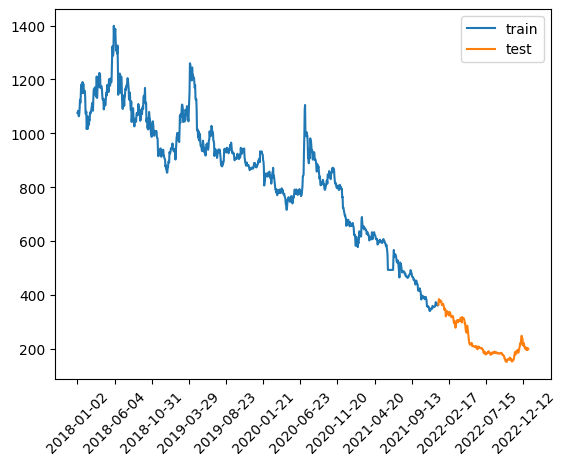

In [6]:
# AR-model with KF
train_data, valid_data, test_data = split_data(df, 0.8, 0, 0.2)
plt.plot(train_data,label='train')
plt.plot(test_data,label='test')
plt.xticks(df.index[::100],rotation=45)
plt.legend()
plt.show()

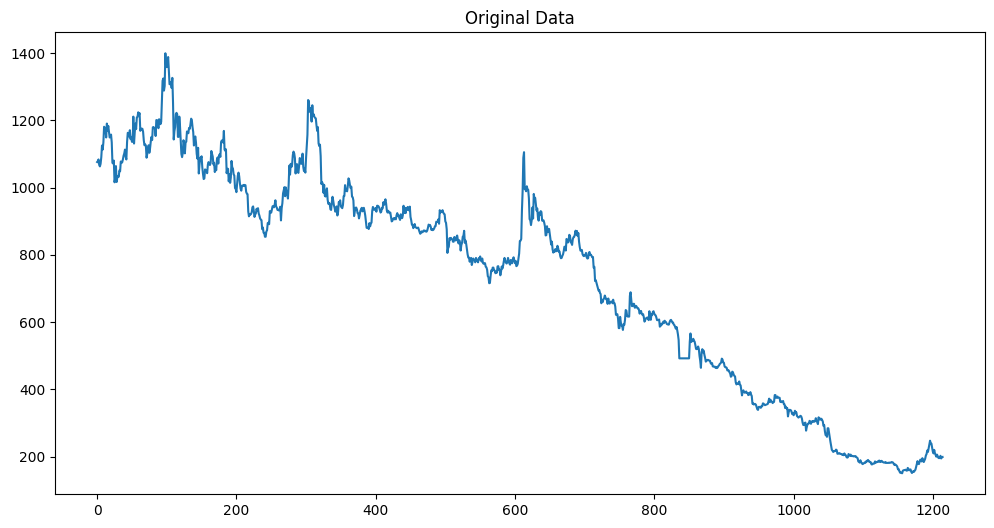

Result of ADF test:
The data is not stationary


ADF Test Statistic              -0.546658
P-value                          0.882585
Used Lag                         5.000000
Number of observation used    1209.000000
Critcal value (1%)              -3.435770
Critcal value (5%)              -2.863934
Critcal value (10%)             -2.568044
dtype: float64

In [7]:
test_stationarity(df.values)

## 2.1 ARMA with differencing

### 2.1.1 Set Models

the p-value of adf test is:  1.321034471070365e-24


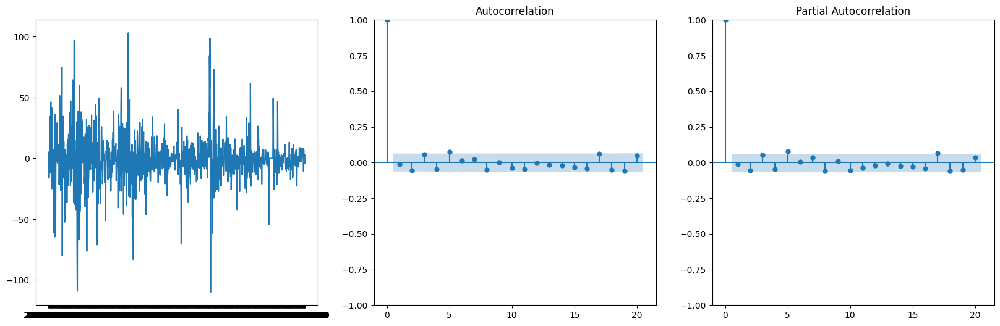

In [8]:
#ARMA with differencing
train_diff=train_data.diff().dropna()
acf_test=adfuller(train_diff)[1]
print('the p-value of adf test is: ',acf_test)
fig=plt.figure(figsize=(20,6))
ax1=fig.add_subplot(131)
plt.plot(train_diff)
ax1=fig.add_subplot(132)
fig=plot_acf(train_diff,lags=20,ax=ax1)
ax2=fig.add_subplot(133)
fig=plot_pacf(train_diff,lags=20,ax=ax2)
plt.show()

In [9]:
#ARIMA
model = auto_arima(train_diff, start_p=1, start_q=1,
                           max_p=3, max_q=3, m=12,
                           Seasonal=False,
                           d=0, D=1, trace=True,
                           error_action='ignore',
                           suppress_warnings=True,
                           stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=12.94 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=9070.213, Time=0.24 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=8838.779, Time=3.78 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=6.34 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=9068.224, Time=0.15 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=9071.950, Time=0.45 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=8715.396, Time=7.11 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=15.62 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=5.47 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=8714.532, Time=6.53 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=8837.073, Time=1.88 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=6.57 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=8.12 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=8715.277, Time=17.71 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=871

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                    603   No. Observations:                  971
Model:                 ARIMA(1, 0, 0)   Log Likelihood               -4249.226
Date:                Fri, 15 Dec 2023   AIC                           8504.452
Time:                        00:21:40   BIC                           8519.087
Sample:                             0   HQIC                          8510.022
                                - 971                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.7352      0.617     -1.192      0.233      -1.944       0.473
ar.L1         -0.0118      0.021     -0.561      0.575      -0.053       0.029
sigma2       370.3288      8.410     44.036      0.0

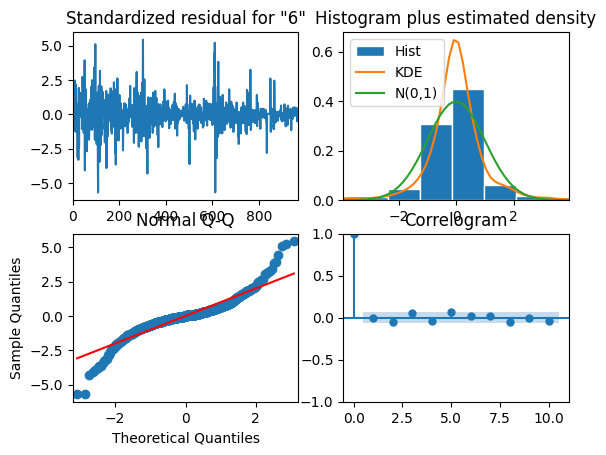

In [10]:
#using arima(1,0,0) to train the model and predict

model = ARIMA(train_diff, order=(1,0,0))
model_fit = model.fit()
model_fit.plot_diagnostics()
print(model_fit.summary())

In [11]:
train_diff

0
2018-01-03     2.58
2018-01-04     5.16
2018-01-05   -16.34
2018-01-08    -4.30
2018-01-09     7.74
              ...  
2021-12-24     7.04
2021-12-27    -4.40
2021-12-28    -0.88
2021-12-29    -4.40
2021-12-30     2.64
Name: 603, Length: 971, dtype: float64

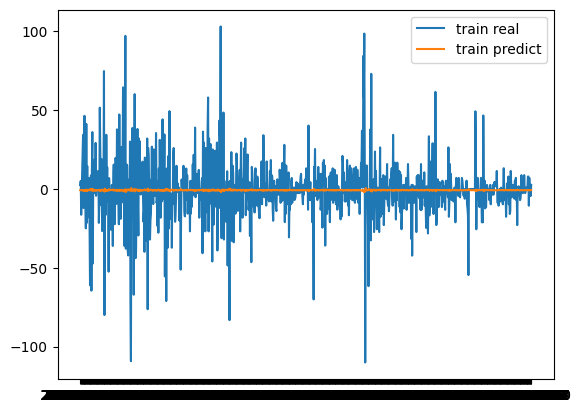

In [12]:
plt.plot(train_diff,label='train real')
plt.plot(model_fit.predict(),label='train predict')
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


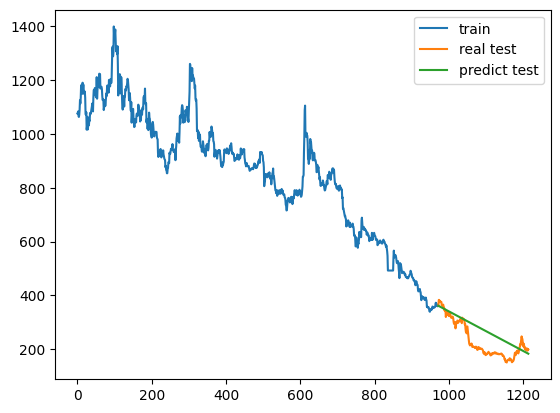

In [13]:
#residual predicting for test data
predict_diff=model_fit.predict(start=len(train_data),end=len(train_data)+len(test_data)-1)
predict_test=train_data.iloc[-1]+predict_diff.cumsum()
train_x_index=np.array([i for i in range(len(train_data))])
test_x_index=np.array([i for i in range(len(train_data),len(train_data)+len(test_data))])
plt.plot(train_x_index,train_data.values,label='train')
plt.plot(test_x_index,test_data.values,label='real test')
plt.plot(test_x_index,predict_test,label='predict test')
#plt.xticks(df.index[::100],rotation=45)
plt.legend()
plt.show()

In [14]:
mse = mean_squared_error(predict_test, test_data)
mae = mean_absolute_error(predict_test, test_data)
print(f'The MSE is {mse}')
print(f'The MAE is {mae}')

The MSE is 2843.5076825771157
The MAE is 44.858496826474685


### 2.1.2 Rolling Forecast

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/p

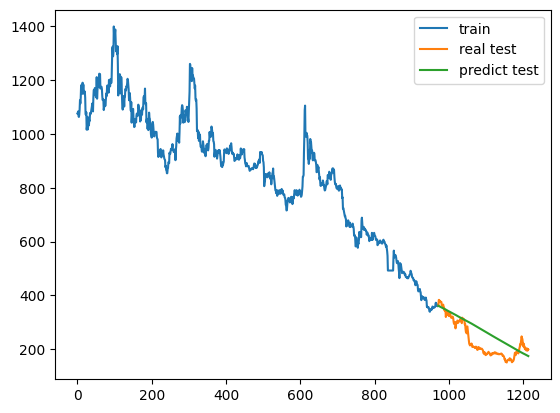

In [15]:
#we set rolling forecast to predict the test data
real_test_diff=test_data.diff().dropna()
real_test_diff=np.append(test_data.iloc[0]-train_data.iloc[-1],real_test_diff)

new_train_diff=train_diff.copy()
test_predict_diff=[]
for i in range(len(test_data)):
    model = ARIMA(new_train_diff, order=(1,0,0))
    model_fit = model.fit()
    next_day=list(model_fit.predict(start=len(new_train_diff),end=len(new_train_diff)+1))[0]
    test_predict_diff.append(next_day)
    new_train_diff=np.append(new_train_diff,real_test_diff[i])
test_predict=train_data.iloc[-1]+np.array(test_predict_diff).cumsum()
plt.plot(train_x_index,train_data.values,label='train')
plt.plot(test_x_index,test_data.values,label='real test')
plt.plot(test_x_index,test_predict,label='predict test')
#plt.xticks(df.index[::100],rotation=45)
plt.legend()
plt.show()

## 2.2 ARMA with Decomposing

### 2.2.1 Set Models

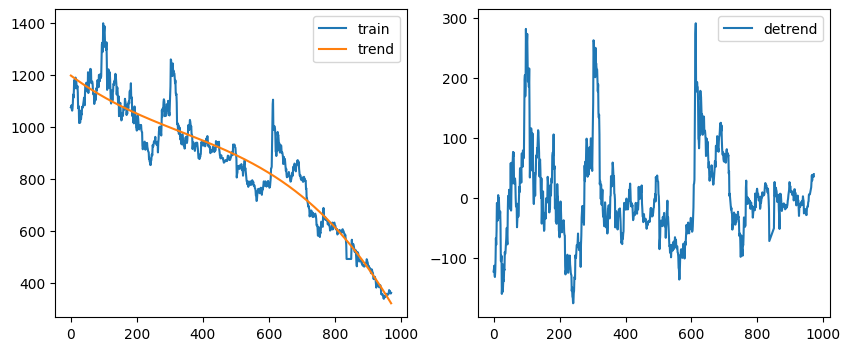

In [16]:
#using polyfit to get the trend of train data
price_arr=train_data.values
time_index=[i for i in range(len(price_arr))]
data_stack=np.stack([time_index,price_arr],axis=1)
x = data_stack[:,0]
y = data_stack[:,1]
z = np.polyfit(x, y, 3)
p = np.poly1d(z)
detrend=y-p(x)
fig=plt.figure(figsize=(10,4))
sub1=fig.add_subplot(1,2,1)
plt.plot(x,y,label='train')
plt.plot(x,p(x),label='trend')
plt.legend()

sub2=fig.add_subplot(1,2,2)
plt.plot(x,detrend,label='detrend')
plt.legend()
plt.show()

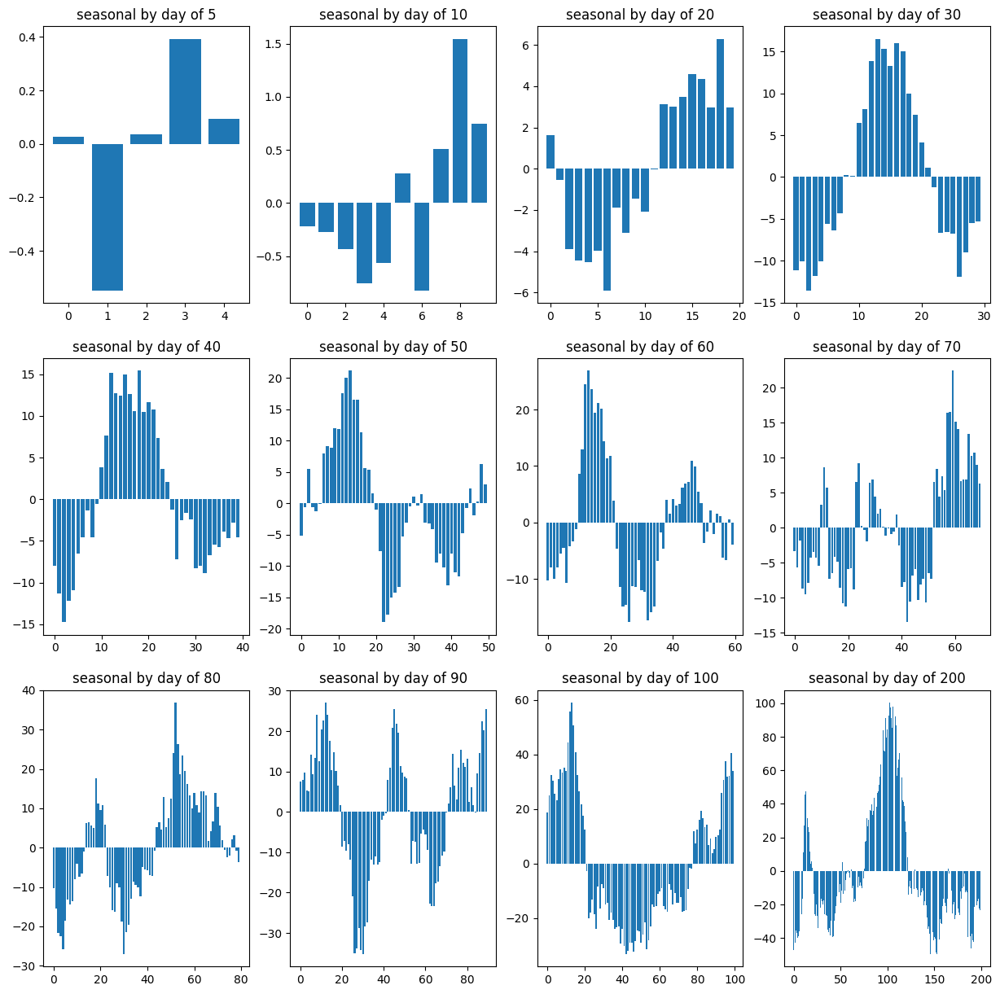

In [17]:
# seasonal by day of n
def plot_seasonal_n(detrend,n):
    cycle_amount=[[] for _ in range(n)]
    for i in range(n):
        cycle_amount[i].append(detrend[i::n])
    cycle_mean=[np.mean(cycle) for cycle in cycle_amount]
    cycle_mean=np.array(cycle_mean)
    plt.bar([i for i in range(n)],cycle_mean)
    plt.title('seasonal by day of {}'.format(n))
    return cycle_mean

cycle_choice=[5,10,20,30,40,50,60,70,80,90,100,200]
fig=plt.figure(figsize=(15,15))

for i,n in enumerate(cycle_choice):
    sub=fig.add_subplot(3,4,i+1)
    plot_seasonal_n(detrend,n)
plt.show()

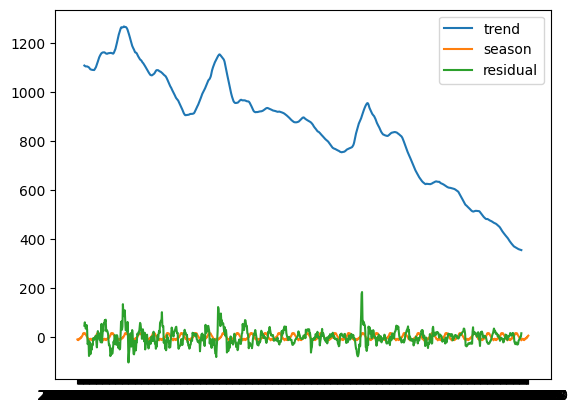

In [18]:
#using decompose to get trend
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
decompose_result=seasonal_decompose(train_data,model='additive',period=30)
trend=decompose_result.trend
season=decompose_result.seasonal
residual=decompose_result.resid
plt.plot(trend,label='trend')
plt.plot(season,label='season')
plt.plot(residual,label='residual')
plt.legend()
plt.show()

the p-value of adf test is:  2.9704058300764245e-15


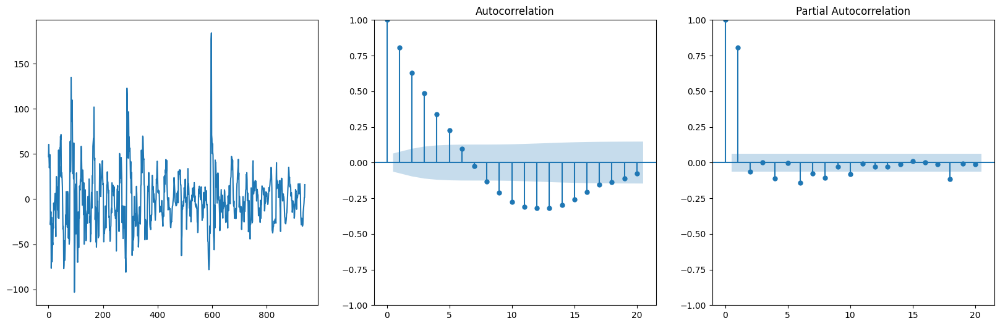

In [19]:
acf_test=adfuller(residual.dropna().values)[1]
print('the p-value of adf test is: ',acf_test)
fig=plt.figure(figsize=(20,6))
ax1=fig.add_subplot(131)
plt.plot(residual.dropna().values)
ax1=fig.add_subplot(132)
fig=plot_acf(residual.dropna().values,lags=20,ax=ax1)
ax2=fig.add_subplot(133)
fig=plot_pacf(residual.dropna().values,lags=20,ax=ax2)
plt.show()

In [20]:
#import auto_arima
model = auto_arima(residual.dropna().values, start_p=1, start_q=1,
                           max_p=3, max_q=3,
                           Seanoal=False,
                           d=0, D=1, trace=True,
                           error_action='ignore',
                           suppress_warnings=True,
                           stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=8110.883, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=9100.457, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=8112.346, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=8464.542, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=9098.470, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=8112.936, Time=0.40 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=8112.739, Time=0.71 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=8309.234, Time=0.65 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=8110.937, Time=0.33 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=3.06 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8108.885, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8462.547, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=8110.349, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8110.939, Time=0.25 sec
 ARIMA(1,0,2)(0,0,0)[0]             : 

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  942
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -4051.445
Date:                Fri, 15 Dec 2023   AIC                           8110.890
Time:                        00:22:49   BIC                           8130.282
Sample:                             0   HQIC                          8118.282
                                - 942                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1086      2.917     -0.037      0.970      -5.826       5.609
ar.L1          0.7804      0.017     44.662      0.000       0.746       0.815
ma.L1          0.0764      0.028      2.709      0.0

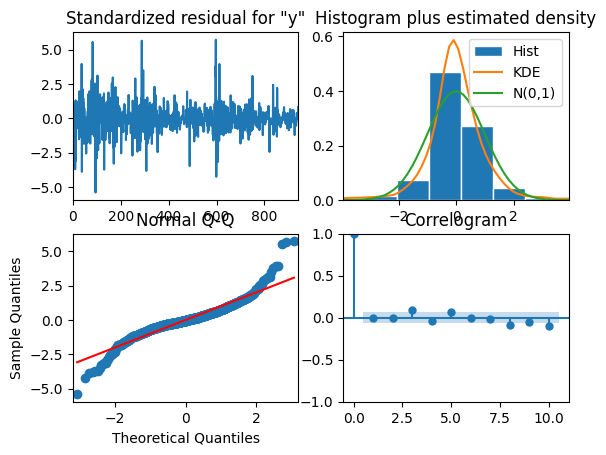

In [21]:
#using arima(1,0,1) to train the model and predict
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(residual.dropna().values, order=(1,0,1))
model_fit = model.fit()
model_fit.plot_diagnostics()
print(model_fit.summary())

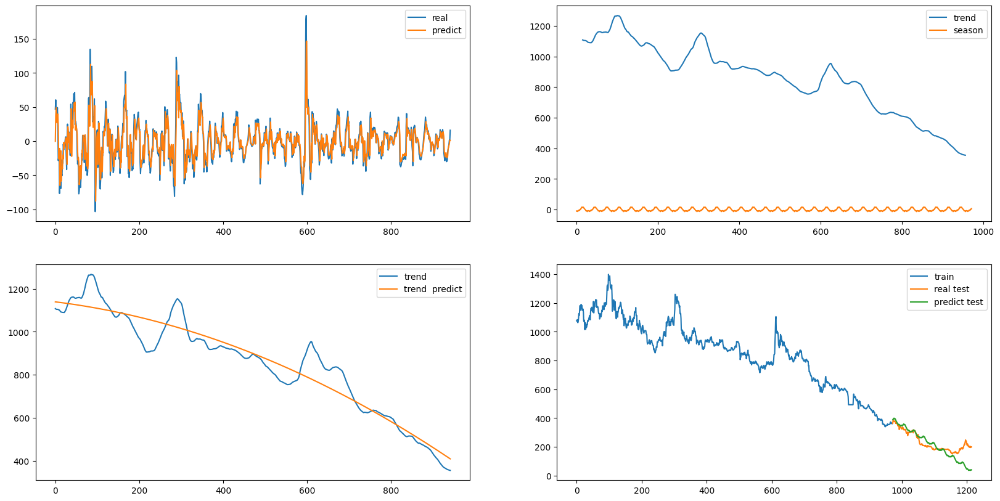

In [22]:
fig=plt.figure(figsize=(20,10))
ax1=fig.add_subplot(221)
plt.plot(residual.dropna().values,label='real')

plt.plot(model_fit.predict(),label='predict')
plt.legend()
trend_values=trend.values
season_values=season.values
ax2=fig.add_subplot(222)
plt.plot(trend_values,label='trend')

plt.plot(season_values,label='season')
plt.legend()

ax3=fig.add_subplot(223)
#using polynomial fitting to get trend
#fill nan with before or after value
na_index=trend.isna()
#index which is not na
x_index=np.array([i for i in range(len(trend_values)) if not na_index[i]])
trend_nonnan_value=np.array(trend_values[x_index])
#fitting
coefs = np.polyfit(x_index, trend_nonnan_value, deg=2)
trend_predict = np.polyval(coefs, x_index)
#fill nan with predict value
plt.plot(trend_nonnan_value,label='trend')
plt.plot(trend_predict,label='trend  predict')
plt.legend()

ax4=fig.add_subplot(224)
#residual predicting for test data
residual_predict_test=model_fit.predict(start=len(train_data),end=len(train_data)+len(test_data)-1)
trend_predict_test=np.polyval(coefs, [i for i in range(len(train_data),len(train_data)+len(test_data))])
season_predict_test=season.values[-len(test_data):]
predict_test=trend_predict_test+season_predict_test+residual_predict_test
train_x_index=np.array([i for i in range(len(train_data))])
test_x_index=np.array([i for i in range(len(train_data),len(train_data)+len(test_data))])
plt.plot(train_x_index,train_data.values,label='train')
plt.plot(test_x_index,test_data.values,label='real test')
plt.plot(test_x_index,predict_test,label='predict test')
plt.legend()
plt.show()

### 2.2.2 rolling forecast

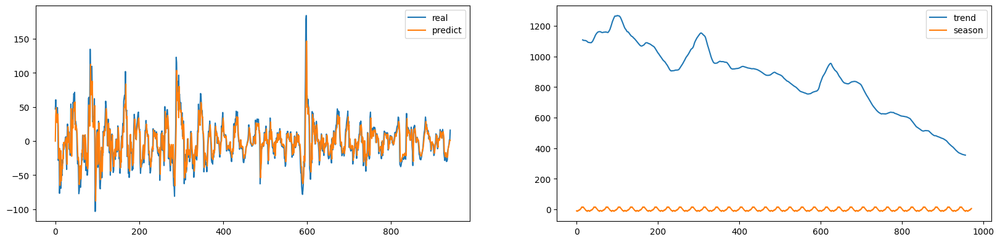

In [23]:
fig=plt.figure(figsize=(20,10))
ax1=fig.add_subplot(221)
plt.plot(residual.dropna().values,label='real')

plt.plot(model_fit.predict(),label='predict')
plt.legend()
trend_values=trend.values
season_values=season.values
ax2=fig.add_subplot(222)
plt.plot(trend_values,label='trend')

plt.plot(season_values,label='season')
plt.legend()
plt.show()

In [24]:
#season fitting
L=30
season_values_ref=season_values[:L]

#trend fitting
trend_values=trend.values
x_index=np.array([i for i in range(len(trend_values)) if not na_index[i]])
trend_nonnan_value=np.array(trend_values[x_index])
#fitting
coefs = np.polyfit(x_index, trend_nonnan_value, deg=2)
trend_predict = np.polyval(coefs, x_index)
trend_predict_test=np.polyval(coefs, [i for i in range(len(train_data),len(train_data)+len(test_data))])

train_new_resi_data=residual.dropna().values
test_start_index=len(train_new_resi_data)
test_predict=[]
for i in range(len(test_data)):
    season_now=season_values_ref[(i+len(train_new_resi_data))%L]
    trend_now=trend_predict_test[i]
    resi_now=test_data.values[i]-season_now-trend_now
    train_new_resi_data=np.append(train_new_resi_data,resi_now)
    model = ARIMA(train_new_resi_data, order=(1,0,0))
    model_fit = model.fit()
    test_predict.append(model_fit.forecast()[0]+season_now+trend_now)

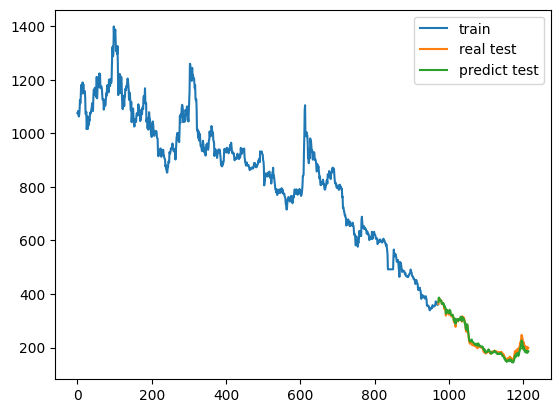

In [25]:
plt.plot(train_x_index,train_data.values,label='train')
plt.plot(test_x_index,test_data.values,label='real test')
plt.plot(test_x_index,test_predict,label='predict test')
plt.legend()
plt.show()

In [26]:
mse = mean_squared_error(test_predict, test_data)
mae = mean_absolute_error(test_predict, test_data)
print(f'The MSE is {mse}')
print(f'The MAE is {mae}')

The MSE is 70.16603720270744
The MAE is 6.60527181770713


## 2.3 KF

### 2.3.1 Set Models

In [ ]:
from darts.models import KalmanForecaster
from darts import TimeSeries

In [ ]:
train_in=pd.DataFrame(train_data)
col_name=train_in.columns[0]
train_in.index=[i for i in range(train_data.shape[0])]
train_seried=TimeSeries.from_dataframe(train_in)
h=test_data.shape[0]

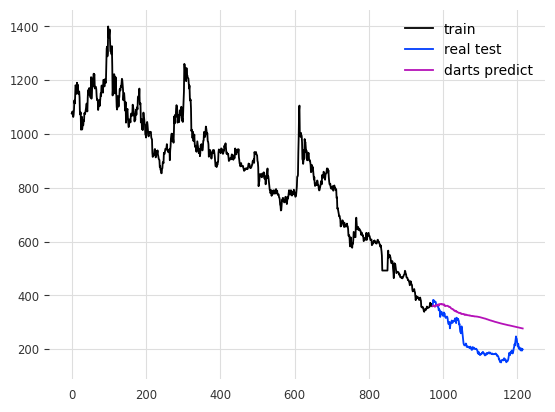

In [ ]:
model = KalmanForecaster(dim_x=5)
model.fit(train_seried)
pred = model.predict(h).pd_dataframe()
plt.plot(train_x_index,train_data.values,label='train')
plt.plot(test_x_index,test_data.values,label='real test')
plt.plot(test_x_index,pred['603'].values,label='darts predict')
plt.legend()
plt.show()

In [ ]:
mse = mean_squared_error(pred, test_data)
mae = mean_absolute_error(predict_test, test_data)
print(f'The MSE is {mse}')
print(f'The MAE is {mae}')

The MSE is 9687.093944676542
The MAE is 43.58821584044537


### 2.3.2 Rolling Forecast

In [ ]:
train_in=pd.DataFrame(train_data)
col_name=train_in.columns[0]
train_in.index=[i for i in range(train_data.shape[0])]
train_seried=TimeSeries.from_dataframe(train_in)
h=test_data.shape[0]

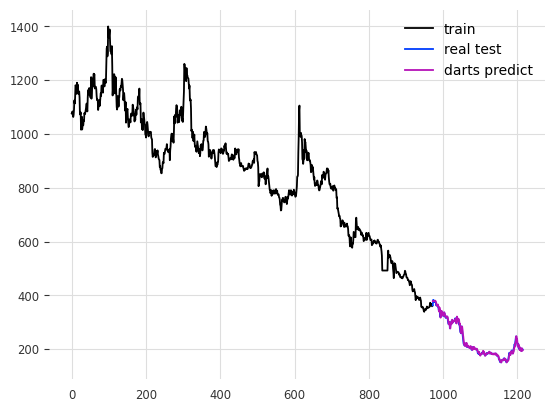

In [ ]:
test_predict = []
for i in range(len(test_data)):
    model = KalmanForecaster(dim_x=5)
    model.fit(train_seried)
    pred = model.predict(1).pd_dataframe()
    test_predict.append(pred[col_name].values[0])
    train_in.at[i+len(train_data),col_name]=test_data.values[i]
    train_seried=TimeSeries.from_dataframe(train_in)
plt.plot(train_x_index,train_data.values,label='train')
plt.plot(test_x_index,test_data.values,label='real test')
plt.plot(test_x_index,test_predict,label='darts predict')
plt.legend()
plt.show()

In [ ]:
mse = mean_squared_error(test_predict, test_data)
mae = mean_absolute_error(test_predict, test_data)
print(f'The MSE is {mse}')
print(f'The MAE is {mae}')

The MSE is 44.112794615916485
The MAE is 4.809465894720335


## 2.4 LSTM

In [7]:
# Deep Learning Model to predict the data
from keras.models import Sequential
from keras.models import Model
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers import SimpleRNN
from keras.layers import GRU


In [8]:
def prepare_test_data(train_data, test_data, time_step, scaler):
    train_data = np.array(train_data)
    full_data = np.concatenate((train_data, test_data))
    full_data = scaler.transform(full_data.reshape(-1,1))
    X_test = []
    for i in range(len(train_data) - time_step, len(full_data)):
        end_ix = i + time_step
        if end_ix >= len(full_data):
            break
        seq_x = full_data[i:end_ix]
        X_test.append(seq_x)
    X_test = np.array(X_test)
    print(X_test.shape)
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
    return X_test

In [9]:
# LSTM Model
class BaseModel(Model):
    def __init__(self, data: pd.Series, time_step: int, units: int, batch_size: int):
        super().__init__()
        self.data = data
        self.time_step = time_step
        self.units = units
        self.batch_size = batch_size
        self.scaler = MinMaxScaler()
        self.model = None

    # Split the data into train and test
    def split_data(self, train_ratio: float, test_ratio: float):
        train_size = int(len(self.data) * train_ratio)
        test_size = int(len(self.data) * test_ratio)
        train = self.data.iloc[:train_size]
        test = self.data.iloc[train_size:]
        return train, test

    # Normalize the data
    # Min-max normalization
    def preprocess_data(self,data: pd.Series):
        index = data.index
        data = data.values.reshape(-1,1)
        normalized_data = self.scaler.fit_transform(data)
        # normalized_data = pd.Series(normalized_data.flatten(), index = index)
        return normalized_data

    # Reshape the data
    def transform_data(self, data, label):
        # df = pd.concat([data, label], axis = 1).dropna()
        # X, y = df.values[:,0], df.values[:,1]
        # print('Shape of X: ', X.shape)
        # print('Shape of y: ', y.shape)
        # X = X.reshape(len(X), 1, 1)
        # print('Shape of X: ', X.shape)
        # print('Shape of y: ', y.shape)
        # return X, y
        # Reshape the data

        X, y = [], []
        for i in range(len(data) - self.time_step):
            # find the end of this pattern
            end_ix = i + self.time_step
            # gather input and output parts of the pattern
            seq_x, seq_y = data[i:end_ix], label[end_ix]
            X.append(seq_x)
            y.append(seq_y)
        X = np.array(X)
        X = X.reshape(X.shape[0], X.shape[1], 1)
        print('Shape of X: ', np.array(X).shape)
        print('Shape of y: ', np.array(y).shape)
        return np.array(X), np.array(y)

    # Plot the result
    def plot_predictions(self, real_data, predicted_data):
        plt.figure(figsize=(12, 6))
        plt.plot(real_data, color='blue', label='Real')
        plt.plot(predicted_data, color='red', label='Predicted Stock Price')
        plt.title(f'Stock Price Prediction with time step {self.time_step} ')
        plt.xlabel('Time')
        plt.ylabel('Stock Price')
        plt.legend()
        plt.show()

    # Plot the whole data
    def plot_full_data(self,train_data, test_data, predicted_data):
        plt.figure(figsize=(12, 6))
        plt.plot(train_data, color='blue', label='History')
        plt.plot(test_data, color='green', label='Real')
        plt.plot(predicted_data, color='red', label='Predicted Stock Price')
        plt.title(f'Stock Price Prediction with time step {self.time_step} ')
        plt.xlabel('Time')
        plt.ylabel('Stock Price')
        plt.legend()
        plt.show()

class LSTMMODEL(BaseModel):
    def __init__(self, data: pd.Series, time_step: int, units: int, batch_size: int):
        super().__init__(data, time_step, units, batch_size)

    # Biuld the LSTM model
    def build_model(self, X, y):
        self.model = Sequential()
        # Layer 1
        self.model.add(LSTM(units = self.units, return_sequences = True, input_shape = (self.time_step, 1))) # input_shape = (time_step, feature)
        self.model.add(Dropout(0.2))
        # Layer 2
        self.model.add(LSTM(units = self.units, return_sequences = True))
        self.model.add(Dropout(0.2))
        # Dense
        self.model.add(Flatten())
        self.model.add(Dense(1))   # 单步预测未来股价
        self.model.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['mean_absolute_error'])
        self.model.fit(X, y, epochs = 600, batch_size = self.batch_size, verbose = 1, shuffle = False, validation_split = 0.25) # validation_data = () 用于验证

    # Predict the data
    def predictions(self, data):
        # data = self.scaler.transform(data.values.reshape(-1,1))
        # data = data.reshape(1, 1, 1)
        predictions = self.model.predict(data)
        prediction = self.scaler.inverse_transform(predictions)
        return predictions

Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 7s 131ms/step - loss: 97.5122 - mean_absolute_error: 8.7989 - val_loss: 33.7974 - val_mean_absolute_error: 5.4380
Epoch 2/100
22/22 [==============================] - 2s 106ms/step - loss: 9.1029 - mean_absolute_error: 2.3365 - val_loss: 5.6591 - val_mean_absolute_error: 1.8288
Epoch 3/100
22/22 [==============================] - 2s 94ms/step - loss: 7.9707 - mean_absolute_error: 2.4879 - val_loss: 6.8032 - val_mean_absolute_error: 1.7056
Epoch 4/100
22/22 [==============================] - 2s 98ms/step - loss: 6.7628 - mean_absolute_error: 2.1900 - val_loss: 5.7473 - val_mean_absolute_error: 1.6739
Epoch 5/100
22/22 [==============================] - 3s 134ms/step - loss: 5.8635 - mean_absolute_error: 2.0254 - val_loss: 5.6331 - val_mean_absolute_error: 1.6568
Epoch 6/100
22/22 [==============================] - 1s 64ms/step - loss: 5.8958 - mean_absolute_error: 2.0455 - val_loss: 5.6543

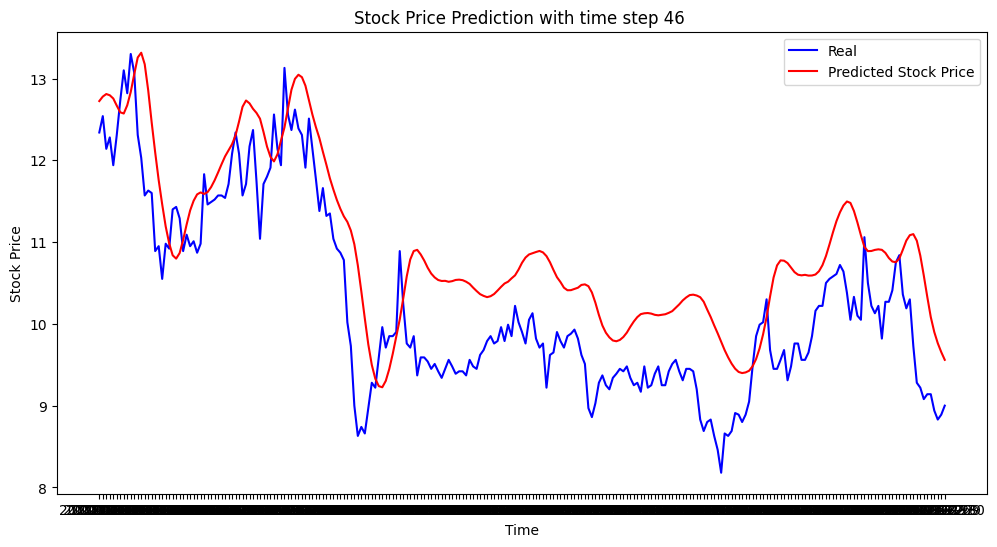

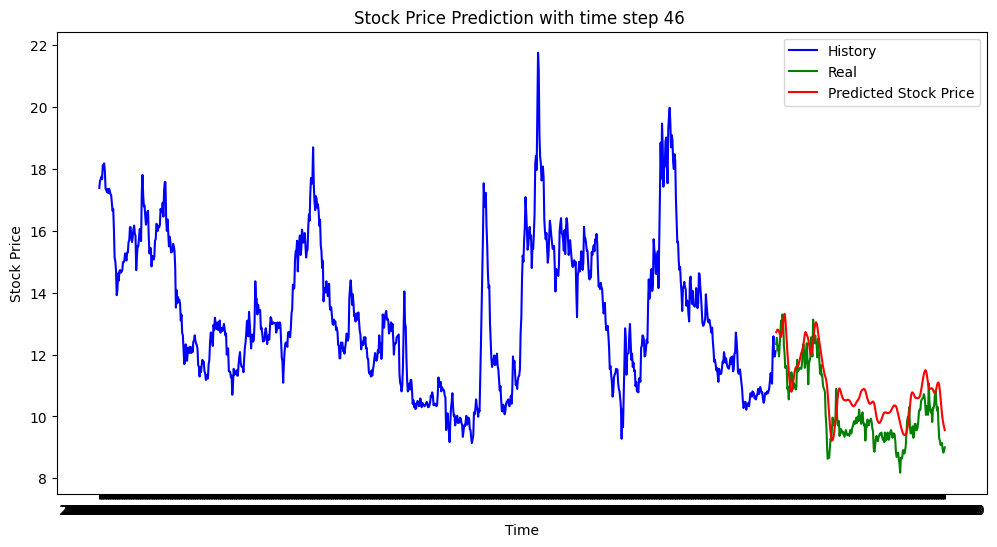

The MSE of time step 46 is 0.7359056321754468
The MAE of time step 46 is 0.7538966035254208
Shape of X:  (949, 23, 1)
Shape of y:  (949,)
Epoch 1/100
23/23 [==============================] - 7s 93ms/step - loss: 138.1381 - mean_absolute_error: 11.3885 - val_loss: 13.1216 - val_mean_absolute_error: 3.0685
Epoch 2/100
23/23 [==============================] - 1s 39ms/step - loss: 11.0225 - mean_absolute_error: 3.0217 - val_loss: 6.3390 - val_mean_absolute_error: 1.6633
Epoch 3/100
23/23 [==============================] - 1s 41ms/step - loss: 4.9268 - mean_absolute_error: 1.7783 - val_loss: 4.1665 - val_mean_absolute_error: 1.5771
Epoch 4/100
23/23 [==============================] - 1s 49ms/step - loss: 3.9640 - mean_absolute_error: 1.6161 - val_loss: 4.0069 - val_mean_absolute_error: 1.3810
Epoch 5/100
23/23 [==============================] - 1s 63ms/step - loss: 4.0830 - mean_absolute_error: 1.6461 - val_loss: 3.8716 - val_mean_absolute_error: 1.3558
Epoch 6/100
23/23 [==================

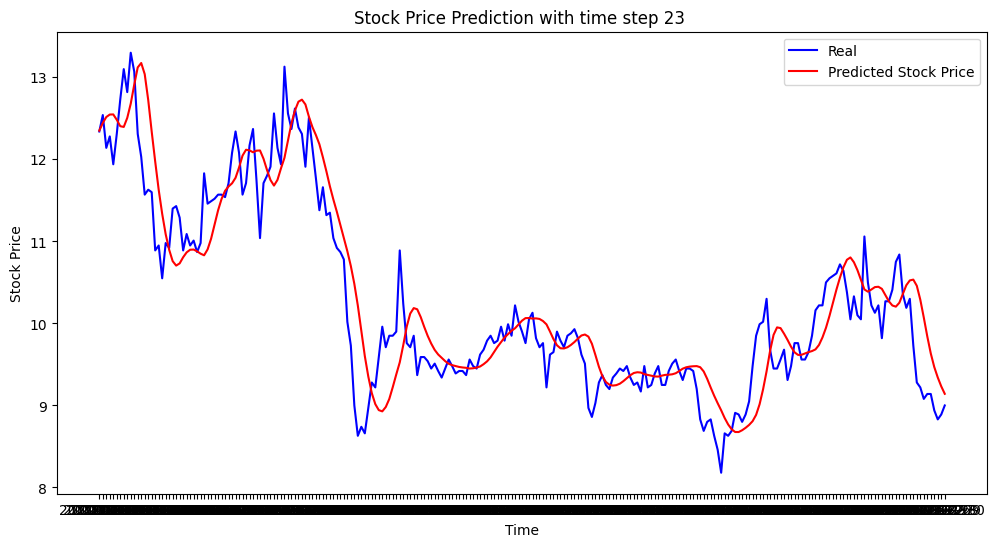

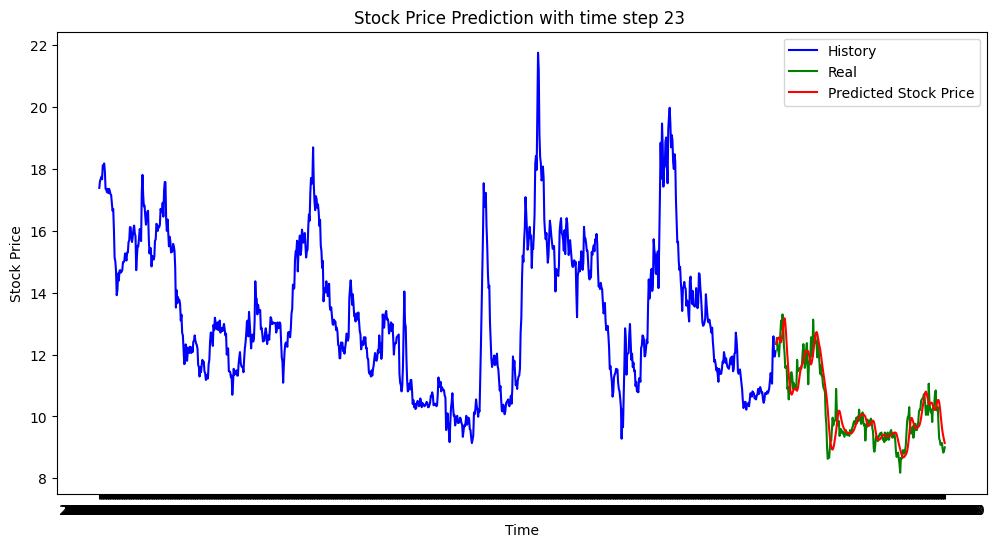

The MSE of time step 23 is 0.2390504261158482
The MAE of time step 23 is 0.36311116128301424
Shape of X:  (962, 10, 1)
Shape of y:  (962,)
Epoch 1/100
23/23 [==============================] - 7s 106ms/step - loss: 167.0512 - mean_absolute_error: 12.7460 - val_loss: 115.4538 - val_mean_absolute_error: 10.5887
Epoch 2/100
23/23 [==============================] - 1s 35ms/step - loss: 42.4576 - mean_absolute_error: 5.0991 - val_loss: 8.2043 - val_mean_absolute_error: 2.6756
Epoch 3/100
23/23 [==============================] - 1s 34ms/step - loss: 6.3273 - mean_absolute_error: 2.1726 - val_loss: 3.7844 - val_mean_absolute_error: 1.3042
Epoch 4/100
23/23 [==============================] - 1s 23ms/step - loss: 3.7405 - mean_absolute_error: 1.5440 - val_loss: 3.0699 - val_mean_absolute_error: 1.3590
Epoch 5/100
23/23 [==============================] - 1s 25ms/step - loss: 3.1859 - mean_absolute_error: 1.4717 - val_loss: 2.7780 - val_mean_absolute_error: 1.1961
Epoch 6/100
23/23 [==============

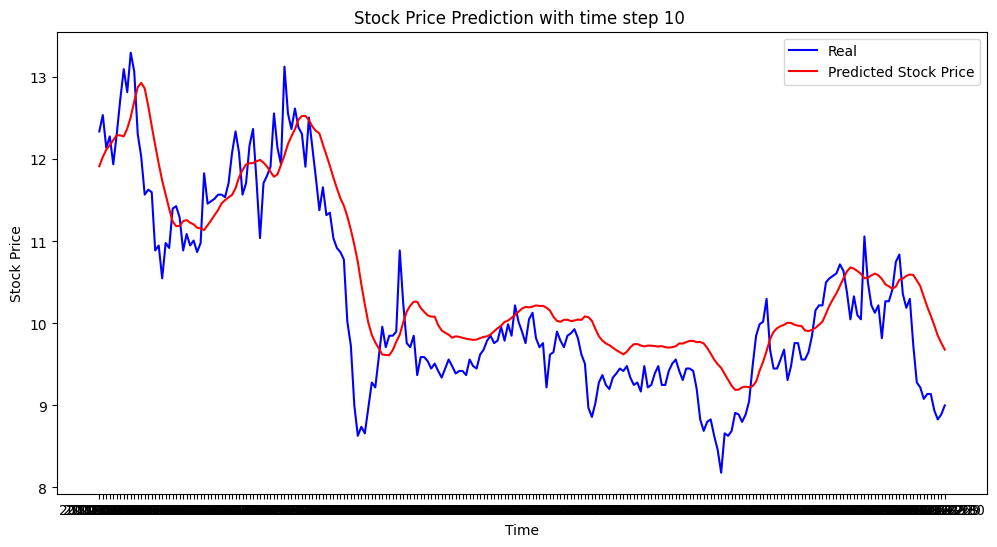

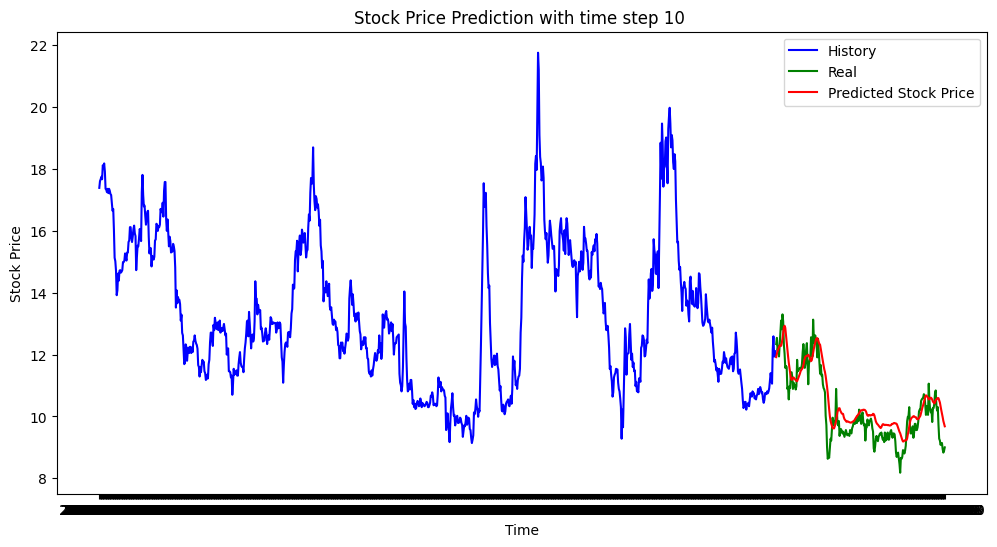

The MSE of time step 10 is 0.3511842359800377
The MAE of time step 10 is 0.47351387714652865
Shape of X:  (969, 3, 1)
Shape of y:  (969,)
Epoch 1/100
23/23 [==============================] - 7s 58ms/step - loss: 181.9015 - mean_absolute_error: 13.2955 - val_loss: 162.7863 - val_mean_absolute_error: 12.5527
Epoch 2/100
23/23 [==============================] - 0s 15ms/step - loss: 162.4916 - mean_absolute_error: 12.5605 - val_loss: 123.9937 - val_mean_absolute_error: 10.9631
Epoch 3/100
23/23 [==============================] - 0s 13ms/step - loss: 84.0471 - mean_absolute_error: 8.7880 - val_loss: 25.0897 - val_mean_absolute_error: 4.7721
Epoch 4/100
23/23 [==============================] - 0s 15ms/step - loss: 11.3775 - mean_absolute_error: 2.7018 - val_loss: 2.4626 - val_mean_absolute_error: 1.1388
Epoch 5/100
23/23 [==============================] - 0s 13ms/step - loss: 3.0452 - mean_absolute_error: 1.4396 - val_loss: 2.8272 - val_mean_absolute_error: 1.4239
Epoch 6/100
23/23 [========

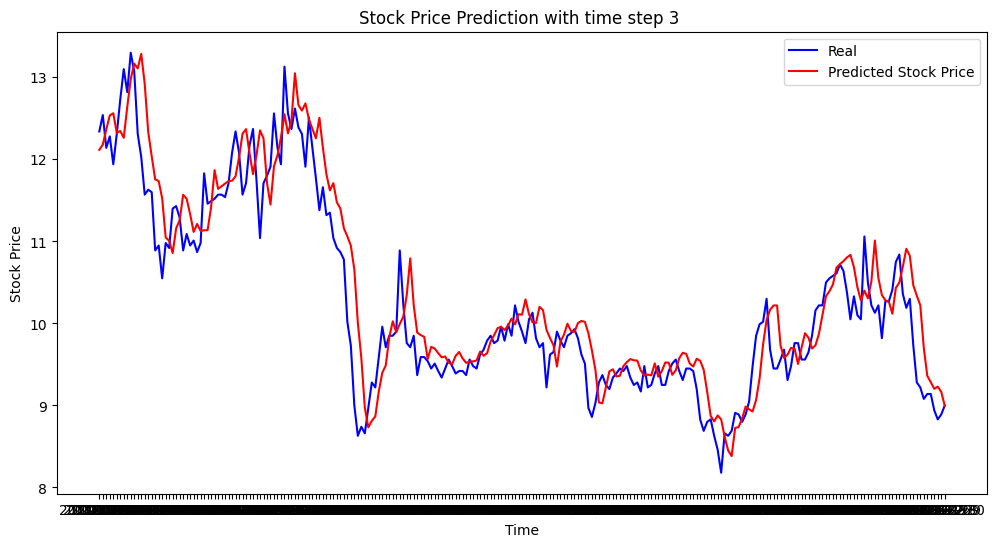

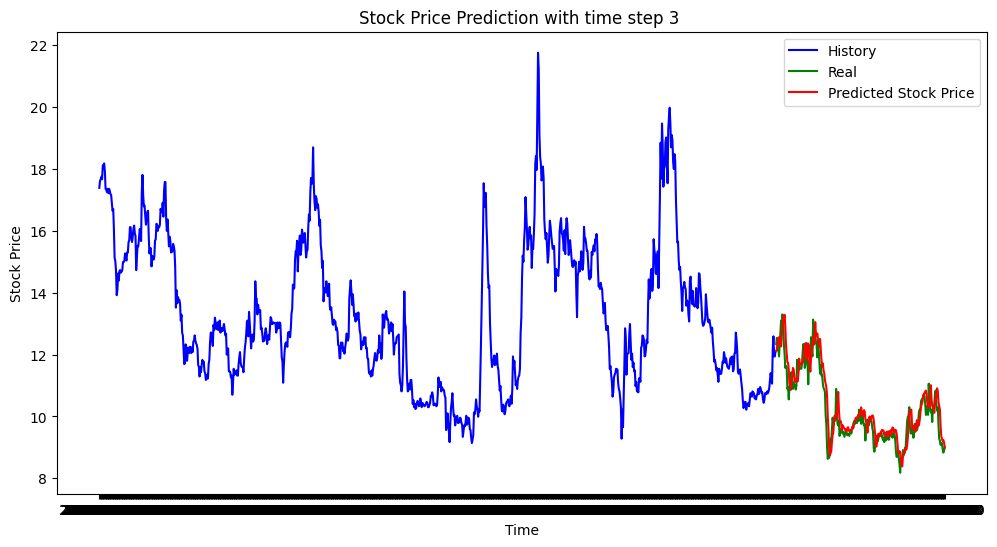

The MSE of time step 3 is 0.20760229301758337
The MAE of time step 3 is 0.34151441487755796
Shape of X:  (971, 1, 1)
Shape of y:  (971,)
Epoch 1/100
23/23 [==============================] - 9s 61ms/step - loss: 184.0171 - mean_absolute_error: 13.3707 - val_loss: 167.5223 - val_mean_absolute_error: 12.7316
Epoch 2/100
23/23 [==============================] - 0s 10ms/step - loss: 179.9588 - mean_absolute_error: 13.2205 - val_loss: 162.2524 - val_mean_absolute_error: 12.5276
Epoch 3/100
23/23 [==============================] - 0s 11ms/step - loss: 171.4768 - mean_absolute_error: 12.9016 - val_loss: 150.5549 - val_mean_absolute_error: 12.0651
Epoch 4/100
23/23 [==============================] - 0s 11ms/step - loss: 152.8261 - mean_absolute_error: 12.1718 - val_loss: 125.9130 - val_mean_absolute_error: 11.0314
Epoch 5/100
23/23 [==============================] - 0s 13ms/step - loss: 117.7183 - mean_absolute_error: 10.6537 - val_loss: 85.0867 - val_mean_absolute_error: 9.0587
Epoch 6/100
23/

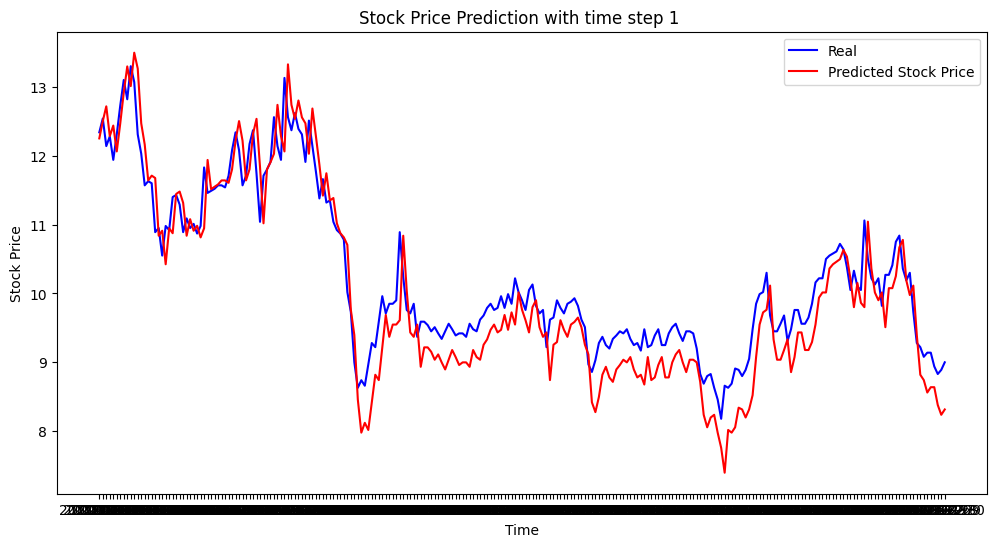

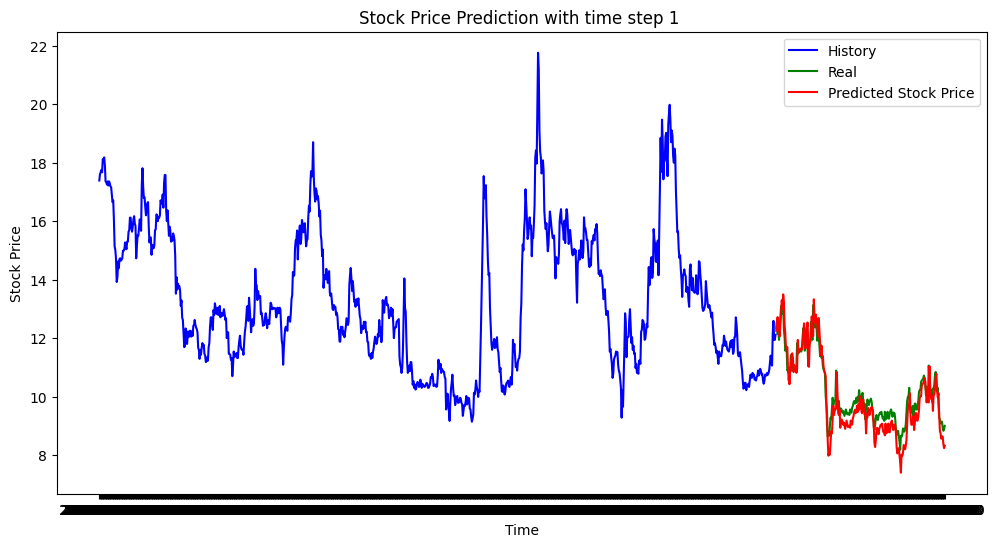

The MSE of time step 1 is 0.21885332885599798
The MAE of time step 1 is 0.39445810058970515


In [31]:
#grid search
time_step = [46, 23, 10, 3, 1]
batch_size = 32
df = data.copy()
df = df['432']
for time in time_step:
    lstm_model = LSTMMODEL(df, time_step= time, units = 50, batch_size = batch_size)
    train, test = lstm_model.split_data(0.8, 0.2)
    train_scaled = lstm_model.preprocess_data(train)
    train_label = train.copy()
    min_length = min(len(train_scaled), len(train_label))
    train_scaled = train_scaled[:min_length]
    train_label = train_label.iloc[:min_length]
    X_train, y_train = lstm_model.transform_data(train_scaled, train_label)
    lstm_model.build_model(X_train, y_train)
    predictions = []
    X_test = prepare_test_data(train,test, lstm_model.time_step, lstm_model.scaler)
    for i in range(len(X_test)):
        testX = X_test[i].reshape(1, lstm_model.time_step, 1)
        prediction = lstm_model.predictions(testX)
        predictions.append(prediction[0,0])
    # Convert predictions
    predictions = pd.Series(predictions, index = test.index)

    # Plot predictions
    lstm_model.plot_predictions(test, predictions)

    # Plot the whole data
    lstm_model.plot_full_data(train, test, predictions)

    # Evaluate the model
    # Calculate MSE and MAE
    mse = mean_squared_error(predictions, test)
    mae = mean_absolute_error(predictions, test)
    print(f'The MSE of time step {time} is {mse}')
    print(f'The MAE of time step {time} is {mae}')

## 2.5 RNN

In [60]:
class RNNMODEL(BaseModel):
    def __init__(self, data: pd.Series, time_step: int, units: int, batch_size: int):
        super().__init__(data, time_step, units, batch_size)


    def build_model(self, X, y):
        self.model = Sequential()
        # RNN Layer 1
        self.model.add(SimpleRNN(units=self.units, return_sequences=True, input_shape=(self.time_step, 1)))
        self.model.add(Dropout(0.2))
        # RNN Layer 2
        self.model.add(SimpleRNN(units=self.units, return_sequences=True))
        self.model.add(Dropout(0.2))
        # Dense
        self.model.add(Flatten())
        self.model.add(Dense(1))
        self.model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mean_absolute_error'])
        self.model.fit(X, y, epochs=300, batch_size=32, verbose=1, shuffle=False, validation_split=0.25)

    # Predict the data
    def predictions(self, data):
        # data = self.scaler.transform(data.values.reshape(-1,1))
        # data = data.reshape(1, 1, 1)
        predictions = self.model.predict(data)
        prediction = self.scaler.inverse_transform(predictions)
        return predictions

Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 4s 57ms/step - loss: 45.8261 - mean_absolute_error: 5.2999 - val_loss: 6.2572 - val_mean_absolute_error: 2.1145
Epoch 2/100
22/22 [==============================] - 1s 38ms/step - loss: 8.8304 - mean_absolute_error: 1.9674 - val_loss: 8.0397 - val_mean_absolute_error: 2.5604
Epoch 3/100
22/22 [==============================] - 1s 36ms/step - loss: 7.2339 - mean_absolute_error: 2.0925 - val_loss: 5.8516 - val_mean_absolute_error: 1.9844
Epoch 4/100
22/22 [==============================] - 1s 50ms/step - loss: 9.1486 - mean_absolute_error: 2.5466 - val_loss: 5.9917 - val_mean_absolute_error: 1.6936
Epoch 5/100
22/22 [==============================] - 1s 60ms/step - loss: 8.4437 - mean_absolute_error: 2.4943 - val_loss: 5.9451 - val_mean_absolute_error: 1.6773
Epoch 6/100
22/22 [==============================] - 1s 54ms/step - loss: 7.0533 - mean_absolute_error: 2.2291 - val_loss: 5.4813 - v

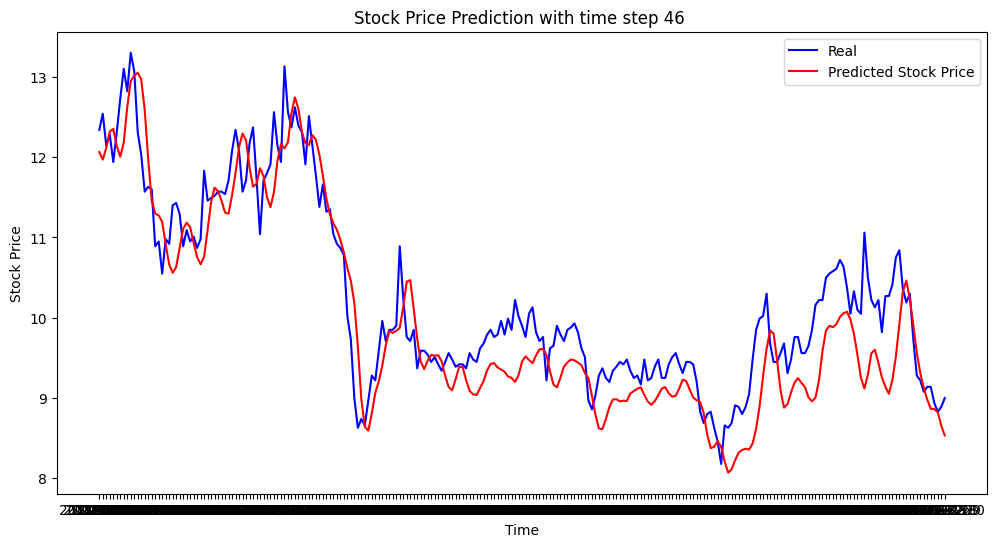

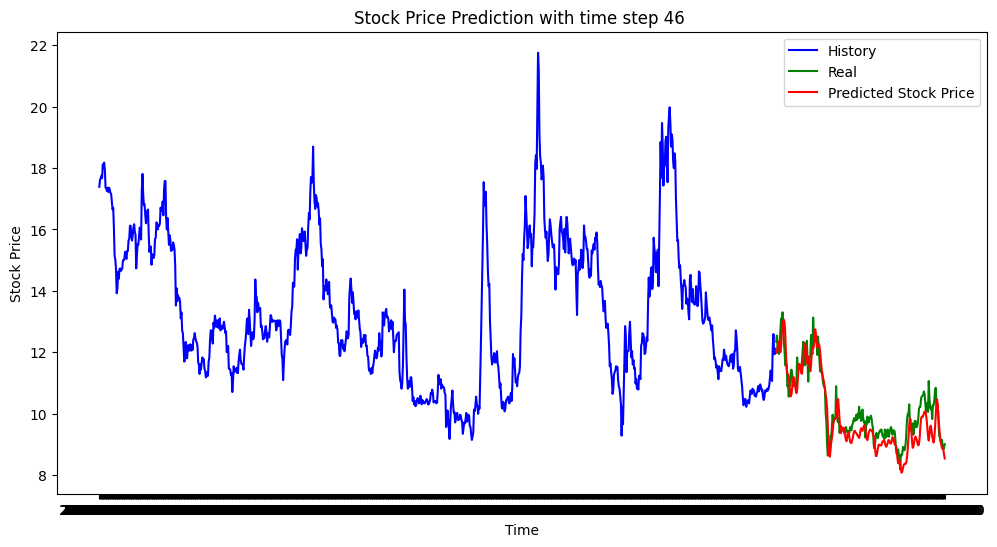

The MSE of time step 46 is 0.2749328851588474
The MAE of time step 46 is 0.4193764020189828
Shape of X:  (949, 23, 1)
Shape of y:  (949,)
Epoch 1/100
23/23 [==============================] - 4s 39ms/step - loss: 76.2535 - mean_absolute_error: 7.5673 - val_loss: 5.2039 - val_mean_absolute_error: 1.8513
Epoch 2/100
23/23 [==============================] - 0s 21ms/step - loss: 6.4212 - mean_absolute_error: 2.0510 - val_loss: 5.4518 - val_mean_absolute_error: 1.9997
Epoch 3/100
23/23 [==============================] - 0s 21ms/step - loss: 6.8062 - mean_absolute_error: 2.2321 - val_loss: 5.1943 - val_mean_absolute_error: 1.5723
Epoch 4/100
23/23 [==============================] - 0s 21ms/step - loss: 6.0825 - mean_absolute_error: 2.0968 - val_loss: 4.6568 - val_mean_absolute_error: 1.5758
Epoch 5/100
23/23 [==============================] - 0s 22ms/step - loss: 5.2582 - mean_absolute_error: 1.9380 - val_loss: 4.4568 - val_mean_absolute_error: 1.5043
Epoch 6/100
23/23 [======================

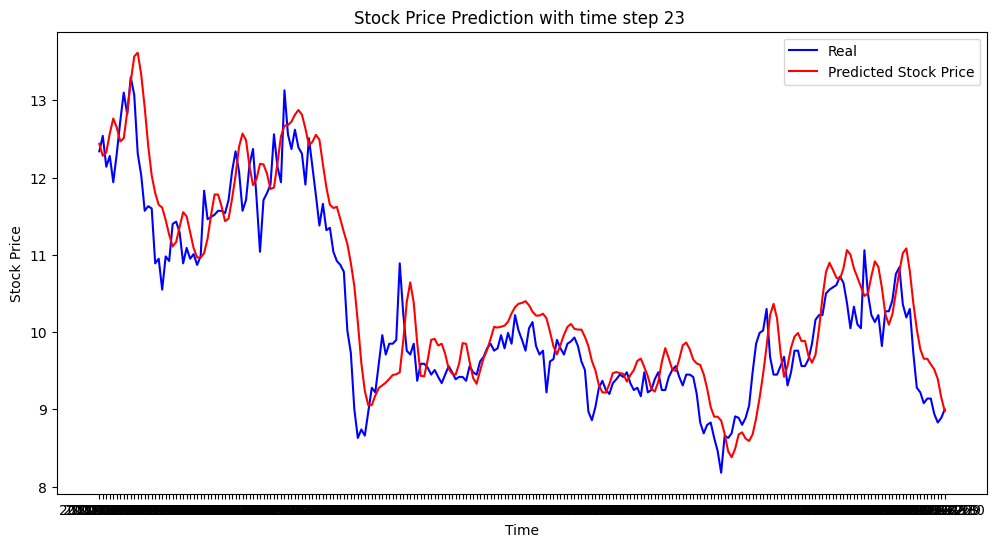

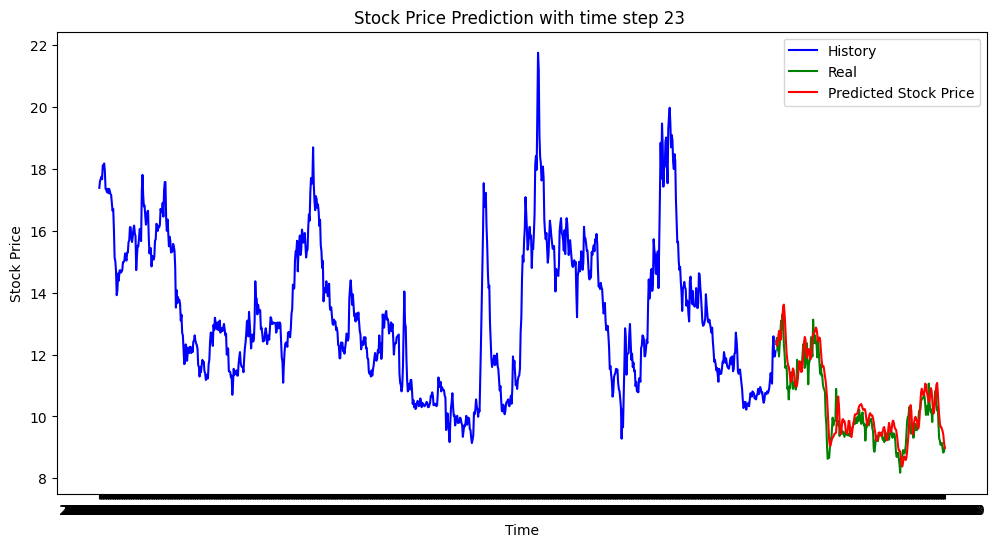

The MSE of time step 23 is 0.2543176342347629
The MAE of time step 23 is 0.3972090128517936
Shape of X:  (962, 10, 1)
Shape of y:  (962,)
Epoch 1/100
23/23 [==============================] - 4s 40ms/step - loss: 98.1331 - mean_absolute_error: 9.2381 - val_loss: 14.3618 - val_mean_absolute_error: 3.2187
Epoch 2/100
23/23 [==============================] - 0s 16ms/step - loss: 7.7426 - mean_absolute_error: 2.1849 - val_loss: 5.3743 - val_mean_absolute_error: 2.0687
Epoch 3/100
23/23 [==============================] - 0s 17ms/step - loss: 3.9458 - mean_absolute_error: 1.6048 - val_loss: 3.2596 - val_mean_absolute_error: 1.2698
Epoch 4/100
23/23 [==============================] - 0s 16ms/step - loss: 3.6484 - mean_absolute_error: 1.5846 - val_loss: 2.7550 - val_mean_absolute_error: 1.2135
Epoch 5/100
23/23 [==============================] - 0s 16ms/step - loss: 3.2284 - mean_absolute_error: 1.4312 - val_loss: 2.2149 - val_mean_absolute_error: 1.0377
Epoch 6/100
23/23 [=====================

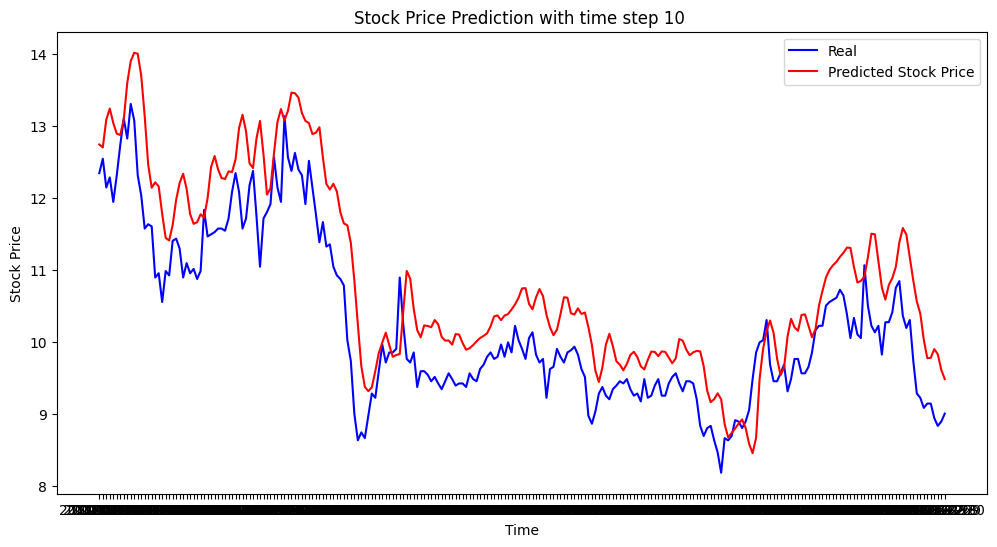

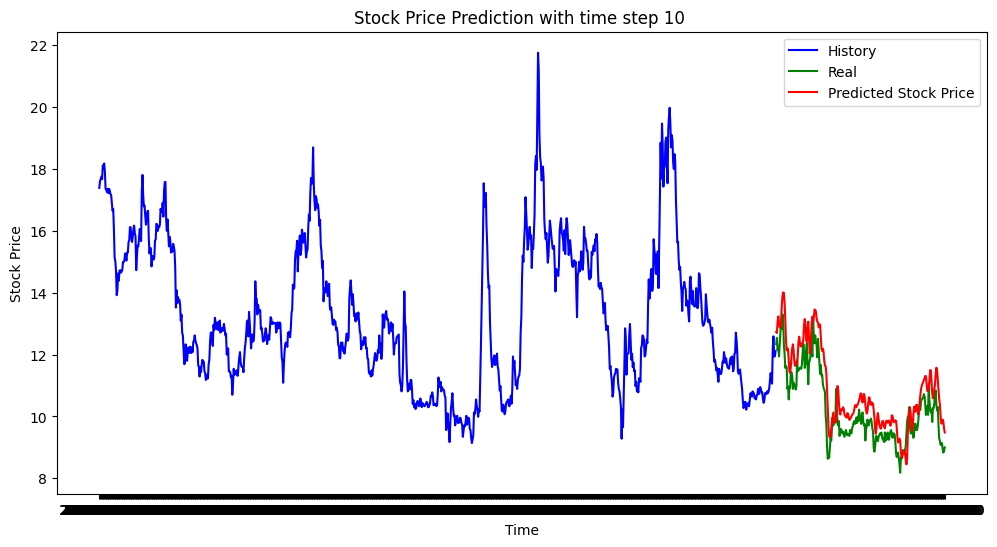

The MSE of time step 10 is 0.5955609382378749
The MAE of time step 10 is 0.6634745162210347
Shape of X:  (969, 3, 1)
Shape of y:  (969,)
Epoch 1/100
23/23 [==============================] - 3s 31ms/step - loss: 144.6456 - mean_absolute_error: 11.8228 - val_loss: 88.0858 - val_mean_absolute_error: 9.2479
Epoch 2/100
23/23 [==============================] - 0s 14ms/step - loss: 56.4401 - mean_absolute_error: 7.1485 - val_loss: 21.2808 - val_mean_absolute_error: 4.2550
Epoch 3/100
23/23 [==============================] - 0s 12ms/step - loss: 13.7823 - mean_absolute_error: 3.1083 - val_loss: 4.4117 - val_mean_absolute_error: 1.3371
Epoch 4/100
23/23 [==============================] - 0s 13ms/step - loss: 4.1296 - mean_absolute_error: 1.5958 - val_loss: 2.8194 - val_mean_absolute_error: 1.2976
Epoch 5/100
23/23 [==============================] - 0s 13ms/step - loss: 2.9810 - mean_absolute_error: 1.4085 - val_loss: 2.7162 - val_mean_absolute_error: 1.3343
Epoch 6/100
23/23 [=================

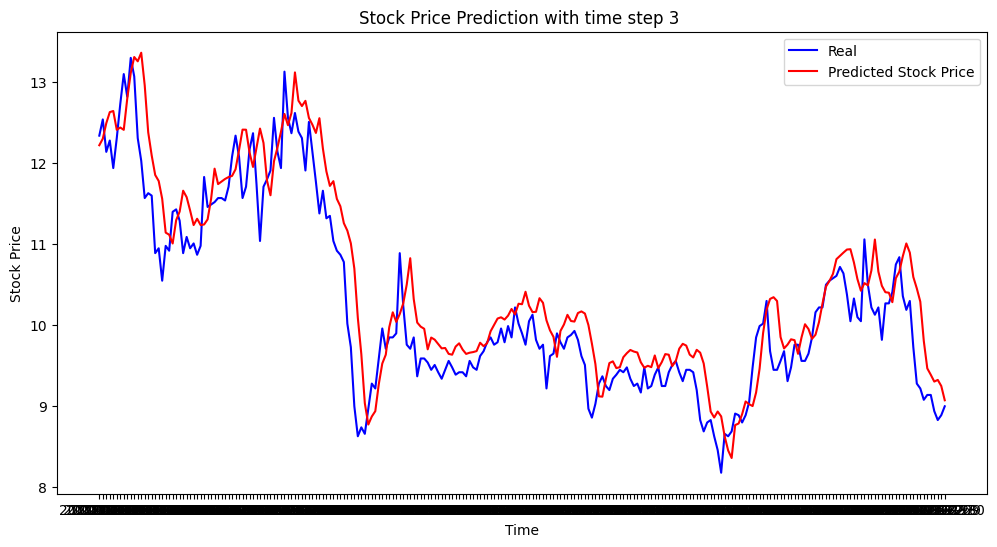

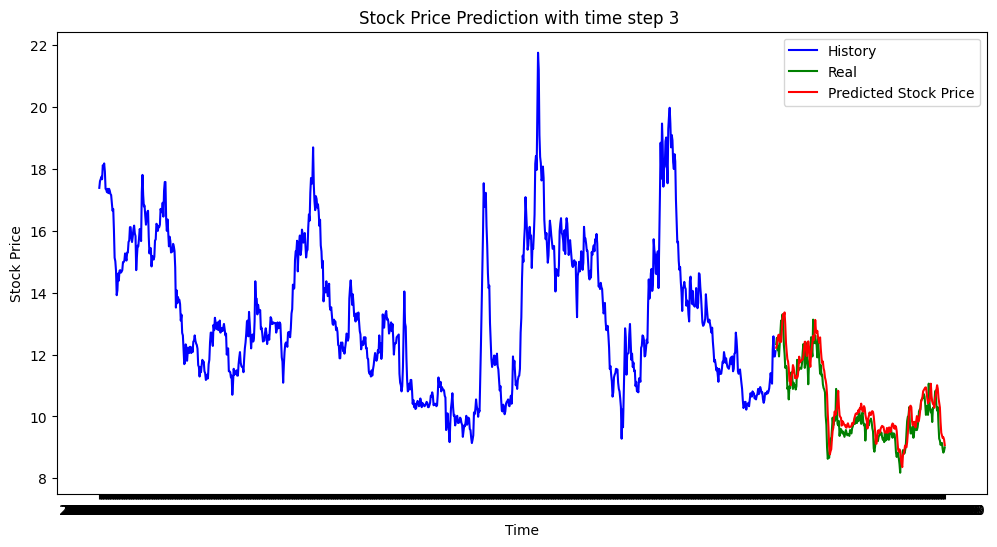

The MSE of time step 3 is 0.2491417721488771
The MAE of time step 3 is 0.3890503166732474
Shape of X:  (971, 1, 1)
Shape of y:  (971,)
Epoch 1/100
23/23 [==============================] - 4s 27ms/step - loss: 164.2637 - mean_absolute_error: 12.6459 - val_loss: 135.5343 - val_mean_absolute_error: 11.4885
Epoch 2/100
23/23 [==============================] - 0s 8ms/step - loss: 125.8495 - mean_absolute_error: 11.0639 - val_loss: 92.9920 - val_mean_absolute_error: 9.5244
Epoch 3/100
23/23 [==============================] - 0s 9ms/step - loss: 75.8868 - mean_absolute_error: 8.5400 - val_loss: 45.8661 - val_mean_absolute_error: 6.6579
Epoch 4/100
23/23 [==============================] - 0s 8ms/step - loss: 32.8124 - mean_absolute_error: 5.4770 - val_loss: 15.8799 - val_mean_absolute_error: 3.7981
Epoch 5/100
23/23 [==============================] - 0s 8ms/step - loss: 11.9010 - mean_absolute_error: 3.0676 - val_loss: 4.8796 - val_mean_absolute_error: 1.8057
Epoch 6/100
23/23 [===============

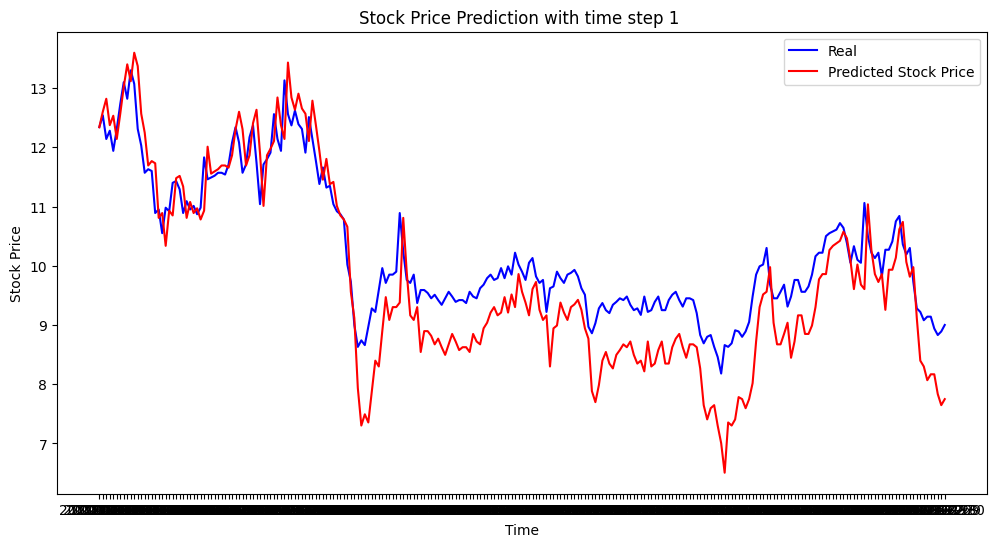

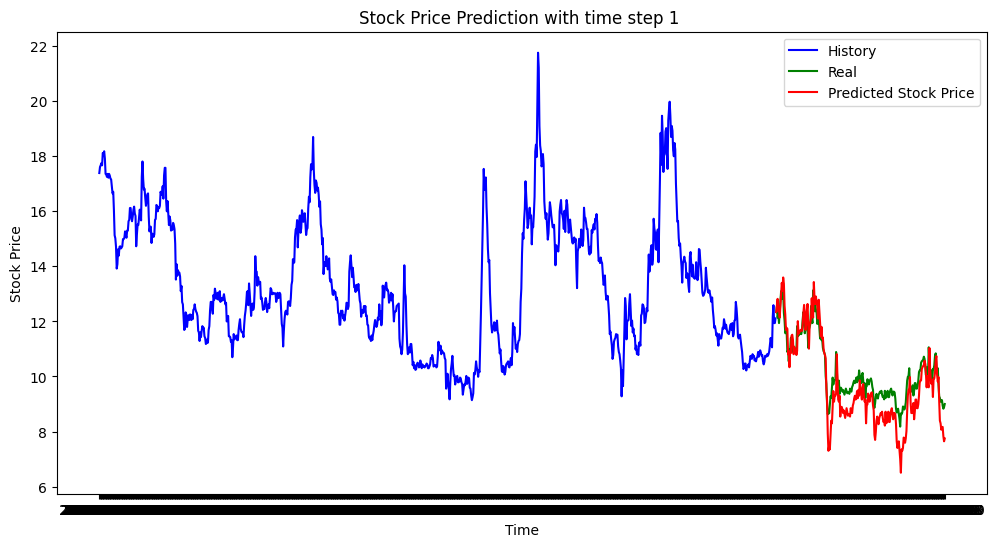

The MSE of time step 1 is 0.5425459360806055
The MAE of time step 1 is 0.6212243708072868


In [33]:
# Hyperparameter tuning
time_step = [46, 23, 10, 3, 1]
batch_size = 32
df = data.copy()
df = df['432']
for time in time_step:
    rnn_model = RNNMODEL(df, time_step= time, units = 50, batch_size = batch_size)
    train, test = rnn_model.split_data(0.8, 0.2)
    train_scaled = rnn_model.preprocess_data(train)
    train_label = train.copy()
    min_length = min(len(train_scaled), len(train_label))
    train_scaled = train_scaled[:min_length]
    train_label = train_label.iloc[:min_length]
    X_train, y_train = rnn_model.transform_data(train_scaled, train_label)
    rnn_model.build_model(X_train, y_train)
    predictions = []
    X_test = prepare_test_data(train,test, rnn_model.time_step, rnn_model.scaler)
    for i in range(len(X_test)):
        testX = X_test[i].reshape(1, rnn_model.time_step, 1)
        prediction = rnn_model.predictions(testX)
        predictions.append(prediction[0,0])
    # Convert predictions
    predictions = pd.Series(predictions, index = test.index)

    # Plot predictions
    rnn_model.plot_predictions(test, predictions)

    # Plot the whole data
    rnn_model.plot_full_data(train, test, predictions)

    # Evaluate the model
    # Calculate MSE and MAE
    mse = mean_squared_error(predictions, test)
    mae = mean_absolute_error(predictions, test)
    print(f'The MSE of time step {time} is {mse}')
    print(f'The MAE of time step {time} is {mae}')

## 2.6 GRU

In [67]:
# GRU Model
class GRUMODEL(BaseModel):
    def __init__(self, data: pd.Series, time_step: int, units: int, batch_size: int):
        super().__init__(data, time_step, units, batch_size)

    
    def build_model(self, X, y):
        self.model = Sequential()
        # GRU Layer 1
        self.model.add(GRU(units=self.units, return_sequences=True, input_shape=(self.time_step, 1)))
        self.model.add(Dropout(0.2))
        # GRU Layer 2
        self.model.add(GRU(units=self.units, return_sequences=True))
        self.model.add(Dropout(0.2))
        # Dense
        self.model.add(Flatten())
        self.model.add(Dense(1))
        self.model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mean_absolute_error'])
        self.model.fit(X, y, epochs=100, batch_size=32, verbose=1, shuffle=False, validation_split=0.25)

    # Predict the data
    def predictions(self, data):
        # data = self.scaler.transform(data.values.reshape(-1,1))
        # data = data.reshape(1, 1, 1)
        predictions = self.model.predict(data)
        prediction = self.scaler.inverse_transform(predictions)
        return predictions

Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 9s 127ms/step - loss: 106.9993 - mean_absolute_error: 9.5257 - val_loss: 17.6150 - val_mean_absolute_error: 3.5713
Epoch 2/100
22/22 [==============================] - 2s 80ms/step - loss: 8.8133 - mean_absolute_error: 2.4287 - val_loss: 7.6877 - val_mean_absolute_error: 2.4169
Epoch 3/100
22/22 [==============================] - 1s 67ms/step - loss: 4.9210 - mean_absolute_error: 1.6617 - val_loss: 6.1475 - val_mean_absolute_error: 2.1773
Epoch 4/100
22/22 [==============================] - 1s 68ms/step - loss: 3.9979 - mean_absolute_error: 1.4391 - val_loss: 5.4554 - val_mean_absolute_error: 2.0527
Epoch 5/100
22/22 [==============================] - 2s 69ms/step - loss: 3.6313 - mean_absolute_error: 1.3363 - val_loss: 5.0856 - val_mean_absolute_error: 1.9811
Epoch 6/100
22/22 [==============================] - 1s 67ms/step - loss: 3.4636 - mean_absolute_error: 1.3035 - val_loss: 4.9306 

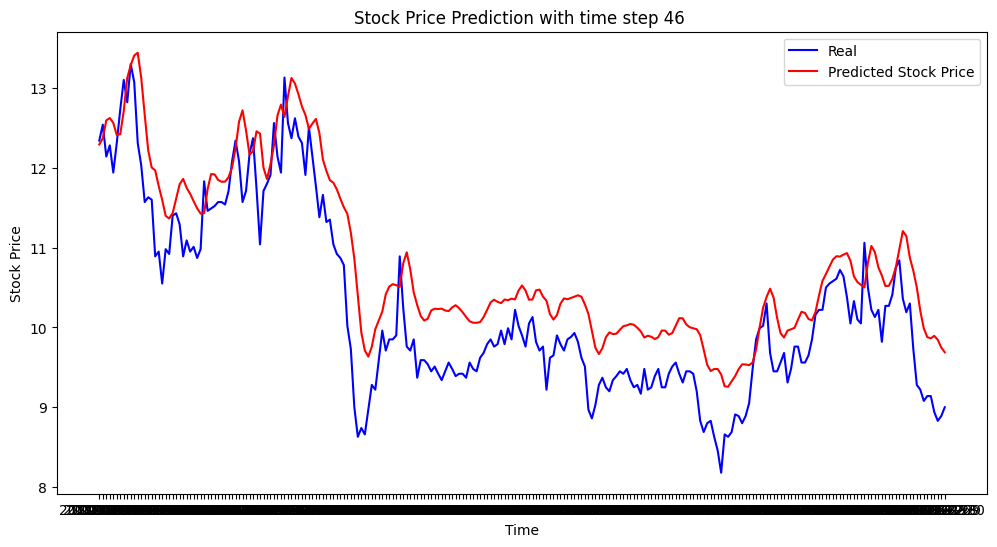

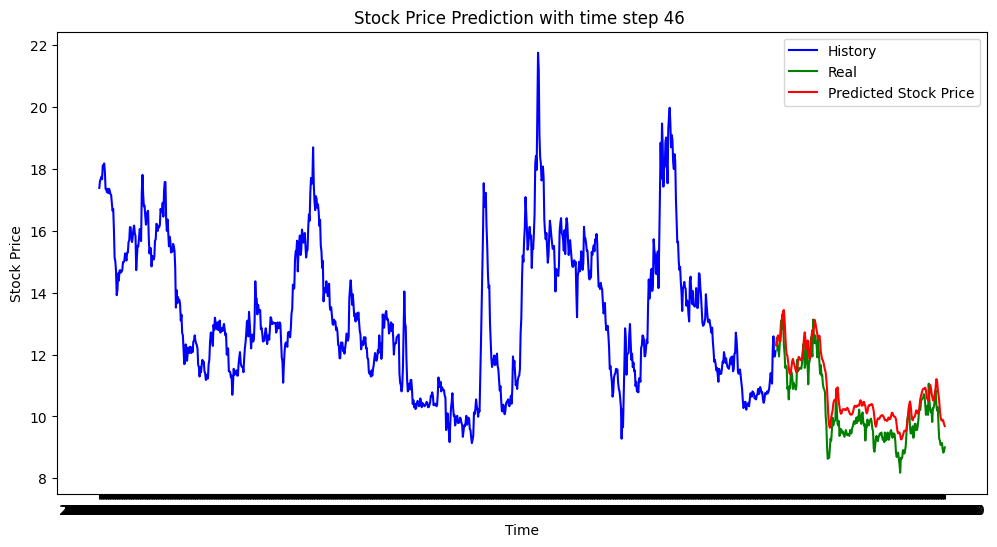

The MSE of time step 46 is 0.44107806895314944
The MAE of time step 46 is 0.585856627005118
Shape of X:  (949, 23, 1)
Shape of y:  (949,)
Epoch 1/100
23/23 [==============================] - 8s 84ms/step - loss: 131.3654 - mean_absolute_error: 11.0706 - val_loss: 10.4932 - val_mean_absolute_error: 2.8056
Epoch 2/100
23/23 [==============================] - 1s 38ms/step - loss: 8.9987 - mean_absolute_error: 2.4618 - val_loss: 3.9085 - val_mean_absolute_error: 1.4997
Epoch 3/100
23/23 [==============================] - 1s 41ms/step - loss: 2.9082 - mean_absolute_error: 1.2859 - val_loss: 2.7066 - val_mean_absolute_error: 1.2484
Epoch 4/100
23/23 [==============================] - 1s 39ms/step - loss: 2.5035 - mean_absolute_error: 1.1538 - val_loss: 2.8816 - val_mean_absolute_error: 1.3684
Epoch 5/100
23/23 [==============================] - 1s 43ms/step - loss: 2.5151 - mean_absolute_error: 1.1462 - val_loss: 3.0185 - val_mean_absolute_error: 1.4465
Epoch 6/100
23/23 [===================

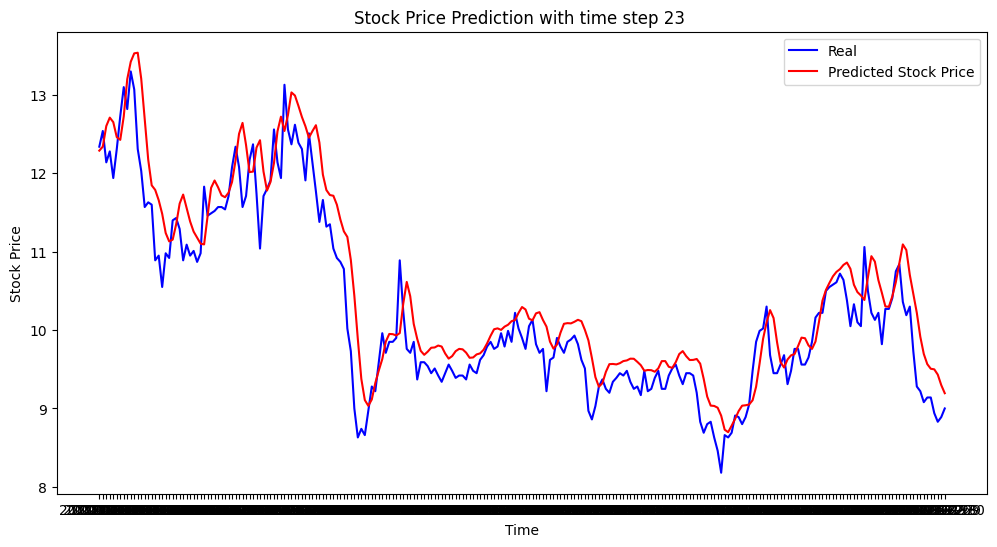

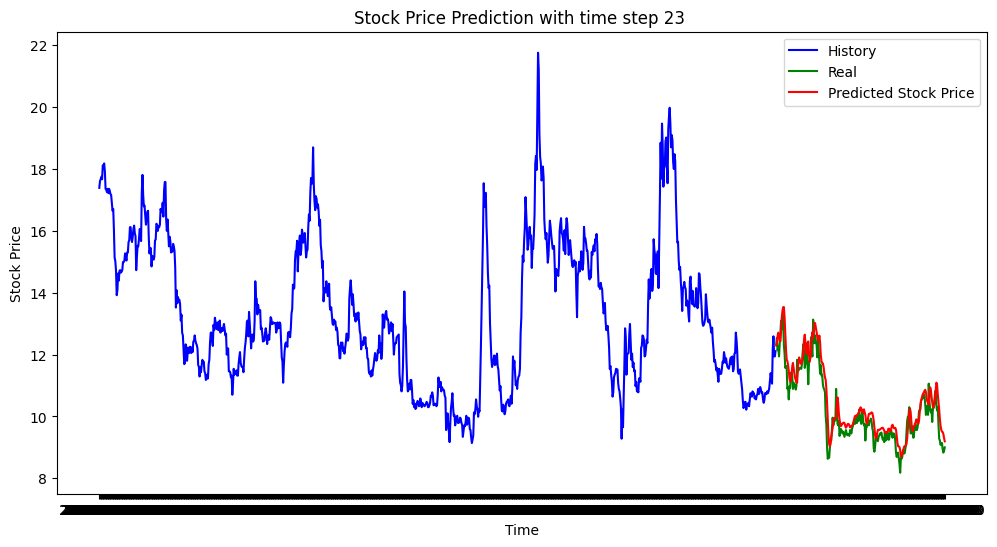

The MSE of time step 23 is 0.21220769625134234
The MAE of time step 23 is 0.35744913061950434
Shape of X:  (962, 10, 1)
Shape of y:  (962,)
Epoch 1/100
23/23 [==============================] - 7s 78ms/step - loss: 160.9138 - mean_absolute_error: 12.4941 - val_loss: 96.3544 - val_mean_absolute_error: 9.6634
Epoch 2/100
23/23 [==============================] - 1s 32ms/step - loss: 30.2129 - mean_absolute_error: 4.3860 - val_loss: 8.9531 - val_mean_absolute_error: 2.8028
Epoch 3/100
23/23 [==============================] - 1s 36ms/step - loss: 3.8224 - mean_absolute_error: 1.5331 - val_loss: 3.4274 - val_mean_absolute_error: 1.2296
Epoch 4/100
23/23 [==============================] - 1s 34ms/step - loss: 3.7347 - mean_absolute_error: 1.6014 - val_loss: 2.6497 - val_mean_absolute_error: 1.1983
Epoch 5/100
23/23 [==============================] - 1s 35ms/step - loss: 2.8521 - mean_absolute_error: 1.3528 - val_loss: 2.3471 - val_mean_absolute_error: 1.0841
Epoch 6/100
23/23 [================

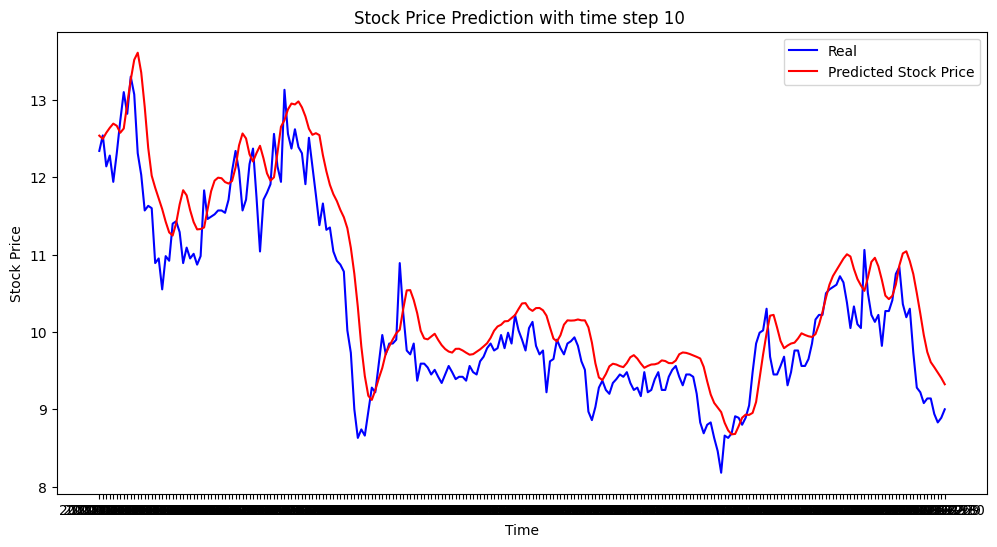

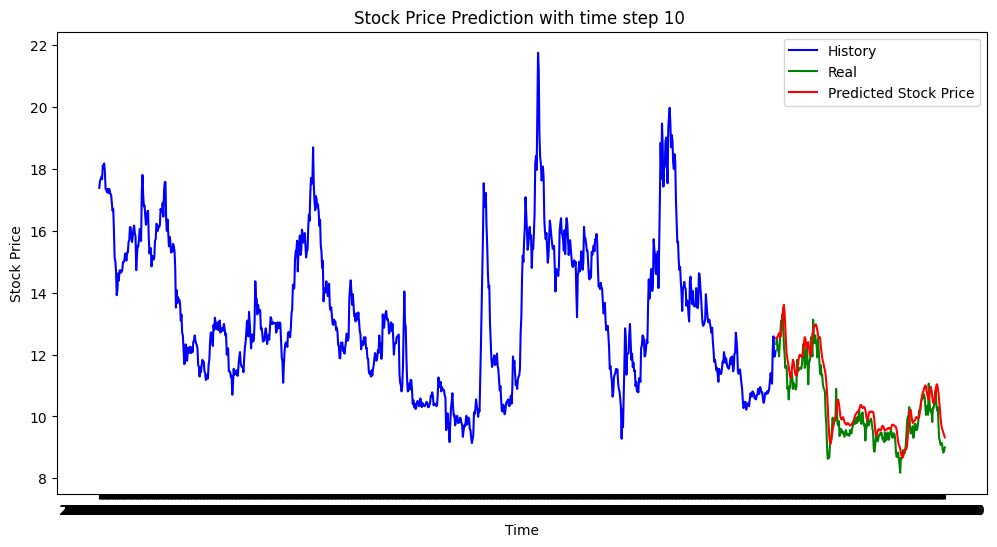

The MSE of time step 10 is 0.2984094855782379
The MAE of time step 10 is 0.4372415106188613
Shape of X:  (969, 3, 1)
Shape of y:  (969,)
Epoch 1/100
23/23 [==============================] - 8s 60ms/step - loss: 176.1996 - mean_absolute_error: 13.0827 - val_loss: 147.8266 - val_mean_absolute_error: 11.9612
Epoch 2/100
23/23 [==============================] - 0s 15ms/step - loss: 119.6666 - mean_absolute_error: 10.6574 - val_loss: 46.9110 - val_mean_absolute_error: 6.6509
Epoch 3/100
23/23 [==============================] - 0s 15ms/step - loss: 19.1787 - mean_absolute_error: 3.5273 - val_loss: 3.5226 - val_mean_absolute_error: 1.3715
Epoch 4/100
23/23 [==============================] - 0s 15ms/step - loss: 4.5146 - mean_absolute_error: 1.7837 - val_loss: 4.0877 - val_mean_absolute_error: 1.7138
Epoch 5/100
23/23 [==============================] - 0s 14ms/step - loss: 3.7540 - mean_absolute_error: 1.6421 - val_loss: 3.4460 - val_mean_absolute_error: 1.4836
Epoch 6/100
23/23 [=============

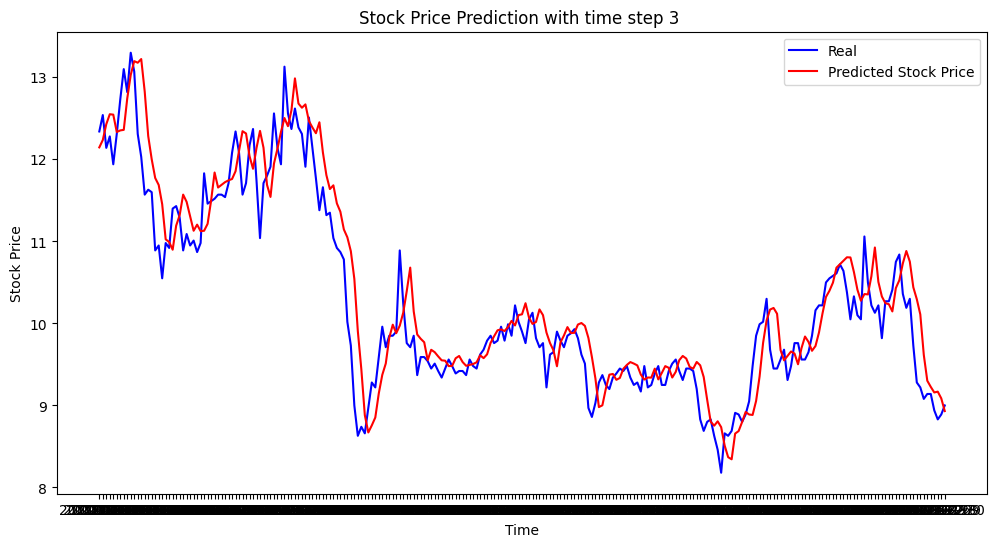

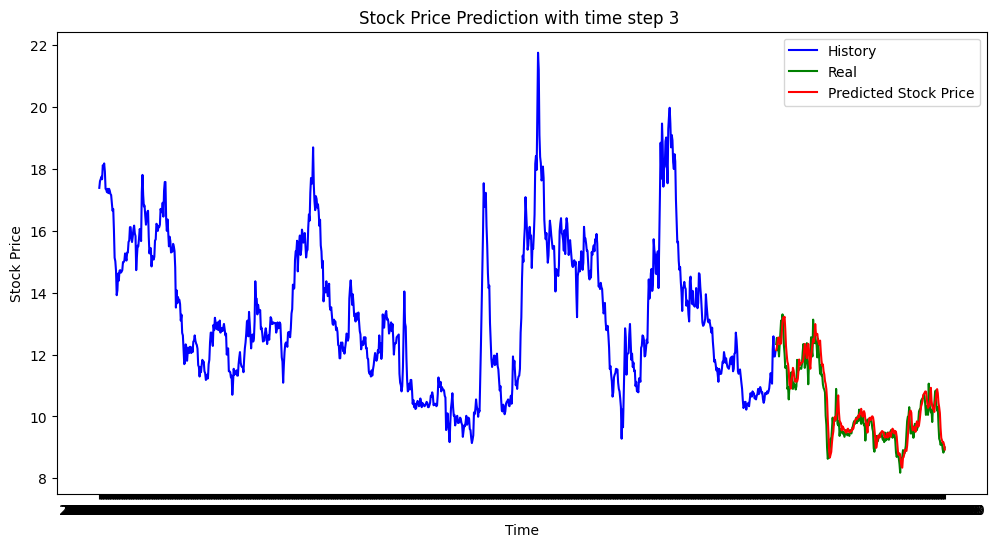

The MSE of time step 3 is 0.1871841033760002
The MAE of time step 3 is 0.32246019167174045
Shape of X:  (971, 1, 1)
Shape of y:  (971,)
Epoch 1/100
23/23 [==============================] - 7s 53ms/step - loss: 180.4929 - mean_absolute_error: 13.2409 - val_loss: 159.9336 - val_mean_absolute_error: 12.4404
Epoch 2/100
23/23 [==============================] - 0s 11ms/step - loss: 164.3627 - mean_absolute_error: 12.6283 - val_loss: 137.7998 - val_mean_absolute_error: 11.5416
Epoch 3/100
23/23 [==============================] - 0s 11ms/step - loss: 129.3210 - mean_absolute_error: 11.1682 - val_loss: 92.4107 - val_mean_absolute_error: 9.4285
Epoch 4/100
23/23 [==============================] - 0s 13ms/step - loss: 72.0185 - mean_absolute_error: 8.2015 - val_loss: 36.1641 - val_mean_absolute_error: 5.8011
Epoch 5/100
23/23 [==============================] - 0s 11ms/step - loss: 23.4068 - mean_absolute_error: 4.3515 - val_loss: 7.3818 - val_mean_absolute_error: 2.2679
Epoch 6/100
23/23 [======

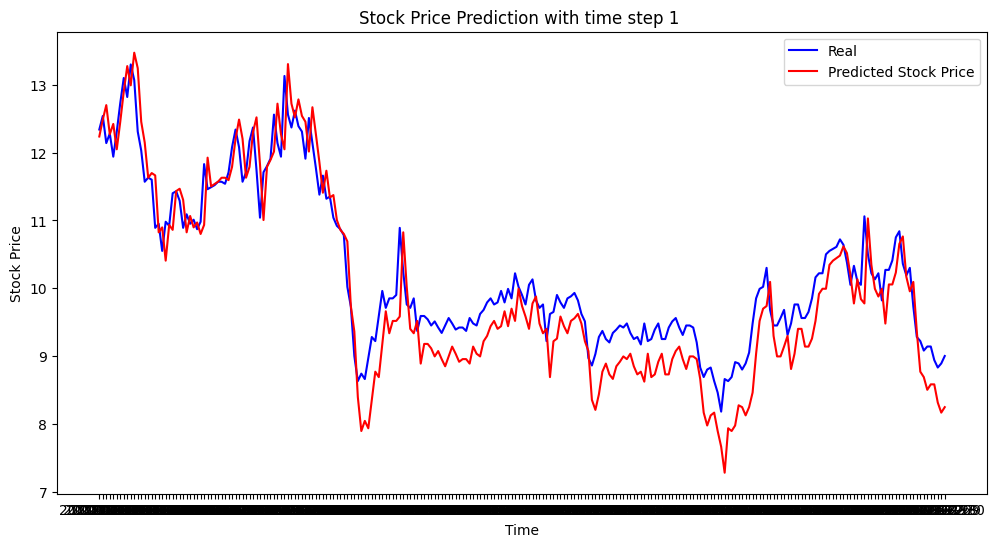

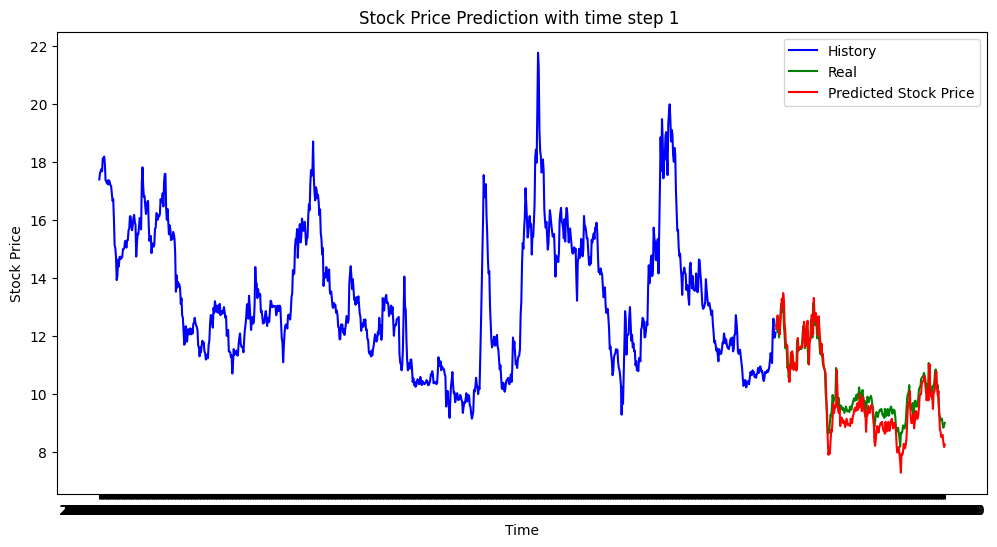

The MSE of time step 1 is 0.24579372191566481
The MAE of time step 1 is 0.4193457721977077


In [35]:
# hyperparameter tuning
time_step = [46, 23, 10, 3, 1]
batch_size = 32
df = data.copy()
df = df['432']
for time in time_step:
    gru_model = GRUMODEL(df, time_step= time, units = 50, batch_size = batch_size)
    train, test = gru_model.split_data(0.8, 0.2)
    train_scaled = gru_model.preprocess_data(train)
    train_label = train.copy()
    min_length = min(len(train_scaled), len(train_label))
    train_scaled = train_scaled[:min_length]
    train_label = train_label.iloc[:min_length]
    X_train, y_train = gru_model.transform_data(train_scaled, train_label)
    gru_model.build_model(X_train, y_train)
    predictions = []
    X_test = prepare_test_data(train,test, gru_model.time_step, gru_model.scaler)
    for i in range(len(X_test)):
        testX = X_test[i].reshape(1, gru_model.time_step, 1)
        prediction = gru_model.predictions(testX)
        predictions.append(prediction[0,0])
    # Convert predictions
    predictions = pd.Series(predictions, index = test.index)

    # Plot predictions
    gru_model.plot_predictions(test, predictions)

    # Plot the whole data
    gru_model.plot_full_data(train, test, predictions)

    # Evaluate the model
    # Calculate MSE and MAE
    mse = mean_squared_error(predictions, test)
    mae = mean_absolute_error(predictions, test)
    print(f'The MSE of time step {time} is {mse}')
    print(f'The MAE of time step {time} is {mae}')

# 3 Multi Features


In [16]:
from hmmlearn.hmm import GaussianHMM
import itertools

In [17]:
data = pd.read_csv('./Chinese Stock Market/price.csv', index_col=0)
data

,0,op,high,low,cl,adj_cl
000908.SZ,,,,,,
0,2018/1/2,13.619927,13.821537,13.530322,13.597525,13.799136
1,2018/1/3,13.776735,14.045549,13.709531,13.799136,13.978346
2,2018/1/4,14.023148,14.090352,13.911142,13.978346,14.023148
3,2018/1/5,13.978346,14.157555,13.955944,14.023148,14.090352
4,2018/1/8,14.067950,14.067950,13.933543,14.090352,14.023148
...,...,...,...,...,...,...
1210,2022/12/26,7.276132,7.388418,7.231218,7.253675,7.253675
1211,2022/12/27,7.253675,7.253675,6.961731,7.253675,7.096475
1212,2022/12/28,7.118932,7.118932,6.961731,7.096475,7.006646


In [18]:
def fraction_calculater(data):

    open_price = data['op']
    close_price = data['adj_cl']
    high_price = data['high']
    low_price = data['low']

    frac_change = (close_price - open_price) / open_price
    frac_high = (high_price - open_price) / open_price
    frac_low = (low_price - open_price) / open_price

    frac_data = pd.concat([frac_change, frac_high, frac_low], axis = 1)
    frac_data.columns = ['frac_change', 'frac_high', 'frac_low']
    return frac_data

# Split the data into train and test
def model_split_data(data: pd.DataFrame, train_ratio:float, test_ratio:float):
    train_size = int(len(data) * train_ratio)
    test_size = int(len(data) * test_ratio)
    train = data.iloc[:train_size]
    test = data.iloc[train_size:]
    return train, test


In [13]:
# LSTM Model
class BaseModel_MUL(Model):
    def __init__(self, data: pd.Series, time_step: int, units: int, batch_size: int):
        super().__init__()
        self.data = data
        self.time_step = time_step
        self.units = units
        self.batch_size = batch_size
        self.scaler = MinMaxScaler()
        self.model = None

    # Split the data into train and test
    def split_data(self, train_ratio: float, test_ratio: float):
        train_size = int(len(self.data) * train_ratio)
        test_size = int(len(self.data) * test_ratio)
        train = self.data.iloc[:train_size]
        test = self.data.iloc[train_size:]
        return train, test

    # Normalize the data
    # Min-max normalization
    def preprocess_data(self,data: pd.DataFrame):
        normalized_data = self.scaler.fit_transform(data)
        return normalized_data

    # Reshape the data
    def transform_data(self, data: pd.DataFrame, label: pd.Series):
        X, y = [], []
        for i in range(len(data) - self.time_step):
            end_ix = i + self.time_step
            seq_x, seq_y = data.iloc[i:end_ix,:], label.iloc[end_ix]
            X.append(seq_x)
            y.append(seq_y)
        X = np.array(X)
        X = X.reshape(X.shape[0], X.shape[1], X.shape[2])
        print('Shape of X: ', np.array(X).shape)
        print('Shape of y: ', np.array(y).shape)
        return np.array(X), np.array(y)

    # Plot the result
    def plot_predictions(self, real_data, predicted_data):
        plt.figure(figsize=(12, 6))
        plt.plot(real_data, color='blue', label='Real')
        plt.plot(predicted_data, color='red', label='Predicted Stock Price')
        plt.title(f'Stock Price Prediction with time step {self.time_step} ')
        plt.xlabel('Time')
        plt.ylabel('Stock Price')
        plt.legend()
        plt.show()

    # Plot the whole data
    def plot_full_data(self,train_data, test_data, predicted_data):
        plt.figure(figsize=(12, 6))
        plt.plot(train_data, color='blue', label='History')
        plt.plot(test_data, color='green', label='Real')
        plt.plot(predicted_data, color='red', label='Predicted Stock Price')
        plt.title(f'Stock Price Prediction with time step {self.time_step} ')
        plt.xlabel('Time')
        plt.ylabel('Stock Price')
        plt.legend()
        plt.show()



In [14]:
class LSTMMODEL_MUL(BaseModel_MUL):
    def __init__(self, data: pd.DataFrame, time_step: int, units: int, batch_size: int):
        super().__init__(data, time_step, units, batch_size)

    # Biuld the LSTM model
    def build_model(self, X, y):
        self.model = Sequential()
        # Layer 1
        self.model.add(LSTM(units = self.units, return_sequences = True, input_shape = (self.time_step, X.shape[2]))) # input_shape = (time_step, feature)
        self.model.add(Dropout(0.2))
        # Layer 2
        self.model.add(LSTM(units = self.units, return_sequences = True))
        self.model.add(Dropout(0.2))
        # Dense
        self.model.add(Flatten())
        self.model.add(Dense(1))   # 单步预测未来股价
        self.model.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['mean_absolute_error'])
        self.model.fit(X, y, epochs = 800, batch_size = self.batch_size, verbose = 1, shuffle = False, validation_split = 0.25) # validation_data = () 用于验证

    # Predict the data
    def predictions(self, data):
        predictions = self.model.predict(data)
        return predictions

## 3.1 LSTM

In [15]:
data = pd.read_csv('./Chinese Stock Market/price.csv', index_col=0)
df = data.copy()

df = data.copy()
lstm_mul_model = LSTMMODEL_MUL(df, time_step= 10, units = 50, batch_size = 32)
train, test = lstm_mul_model.split_data(0.8, 0.2)
frac_train = fraction_calculater(train.copy())
frac_train_scaled = frac_train.copy()
train_label = train['adj_cl'].copy()
min_length = min(len(frac_train_scaled), len(train_label))
train_scaled = frac_train_scaled[:min_length]
train_label = train_label.iloc[:min_length]
X_train, y_train = lstm_mul_model.transform_data(train_scaled, train_label)
lstm_mul_model.build_model(X_train, y_train)


Shape of X:  (962, 10, 3)
Shape of y:  (962,)

Epoch 1/800


23/23 [==============================] - 2s 29ms/step - loss: 106.3145 - mean_absolute_error: 10.1546 - val_loss: 67.4686 - val_mean_absolute_error: 8.0137
Epoch 2/800
23/23 [==============================] - 0s 7ms/step - loss: 24.7575 - mean_absolute_error: 3.9244 - val_loss: 6.2448 - val_mean_absolute_error: 2.2790
Epoch 3/800
23/23 [==============================] - 0s 8ms/step - loss: 3.8595 - mean_absolute_error: 1.6525 - val_loss: 3.6286 - val_mean_absolute_error: 1.3108
Epoch 4/800
23/23 [==============================] - 0s 7ms/step - loss: 4.7366 - mean_absolute_error: 1.8662 - val_loss: 3.1896 - val_mean_absolute_error: 1.3640
Epoch 5/800
23/23 [==============================] - 0s 6ms/step - loss: 4.3290 - mean_absolute_error: 1.7861 - val_loss: 3.2245 - val_mean_absolute_error: 1.3422
Epoch 6/800
23/23 [==============================] - 0s 7ms/step - loss: 4.2573 - mean_absolute_error: 1.7677 - val_loss: 3.1890 

KeyboardInterrupt: 

In [24]:

def prepare_test_data_mul(train_data, test_data, time_step, scaler):
    train_data = np.array(train_data)
    full_data = np.concatenate((train_data, test_data))
    # full_data = scaler.transform(full_data)
    X_test = []
    for i in range(len(train_data) - time_step, len(full_data)):
        end_ix = i + time_step
        if end_ix >= len(full_data):
            break
        seq_x = full_data[i:end_ix]
        X_test.append(seq_x)
    X_test = np.array(X_test)
    print(X_test.shape)
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], X_test.shape[2]))
    print(X_test.shape)
    return X_test


In [ ]:

predictions = []
frac_test = fraction_calculater(test.copy())
X_test = prepare_test_data_mul(frac_train, frac_test, lstm_mul_model.time_step, lstm_mul_model.scaler)
print(X_test.shape)
for i in range(len(X_test)):
    testX = X_test[i].reshape(1, lstm_mul_model.time_step, X_test.shape[2])
    prediction = lstm_mul_model.predictions(testX)
    predictions.append(prediction[0,0])
# Convert predictions
predictions = pd.Series(predictions, index = test.index)

# Plot predictions
lstm_mul_model.plot_predictions(test['adj_cl'], predictions)

# Plot the whole data
lstm_mul_model.plot_full_data(train['adj_cl'], test['adj_cl'], predictions)

# Evaluate the model
# Calculate MSE and MAE
mse = mean_squared_error(predictions, test['adj_cl'])
mae = mean_absolute_error(predictions, test['adj_cl'])
print(f'The MSE is {mse}')
print(f'The MAE is {mae}')


## 3.2 RNN

In [19]:
class RNNMODEL_MUL(BaseModel_MUL):
    def __init__(self, data: pd.DataFrame, time_step: int, units: int, batch_size: int):
        super().__init__(data, time_step, units, batch_size)

    def build_model(self, X, y):
        self.model = Sequential()
        # RNN Layer 1
        self.model.add(SimpleRNN(units=self.units, return_sequences=True, input_shape=(self.time_step, X.shape[2])))
        self.model.add(Dropout(0.2))
        # RNN Layer 2
        self.model.add(SimpleRNN(units=self.units, return_sequences=True))
        self.model.add(Dropout(0.2))
        # Dense
        self.model.add(Flatten())
        self.model.add(Dense(1))
        self.model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mean_absolute_error'])
        self.model.fit(X, y, epochs=800, batch_size=32, verbose=1, shuffle=False, validation_split=0.25)

    # Predict the data
    def predictions(self, data):
        predictions = self.model.predict(data)
        return predictions

In [79]:
data = pd.read_csv('./Chinese Stock Market/price.csv', index_col=0)
df = data.copy()

rnn_mul_model = RNNMODEL_MUL(df, time_step= 10, units = 50, batch_size = 32)
train, test = rnn_mul_model.split_data(0.8, 0.2)
frac_train = fraction_calculater(train.copy())
print(frac_train.shape)
frac_train_scaled = frac_train.copy()
print(frac_train_scaled.shape)
print(type(frac_train))
train_label = train['adj_cl'].copy()
min_length = min(len(frac_train_scaled), len(train_label))
train_scaled = frac_train_scaled[:min_length]
train_label = train_label.iloc[:min_length]
print(train_scaled.shape)
print(train_label.shape)
X_train, y_train = rnn_mul_model.transform_data(train_scaled, train_label)
rnn_mul_model.build_model(X_train, y_train)


(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 3s 29ms/step - loss: 63.3253 - mean_absolute_error: 7.1134 - val_loss: 3.2040 - val_mean_absolute_error: 1.3830
Epoch 2/800
23/23 [==============================] - 0s 13ms/step - loss: 7.5238 - mean_absolute_error: 2.4598 - val_loss: 3.3378 - val_mean_absolute_error: 1.3933
Epoch 3/800
23/23 [==============================] - 0s 13ms/step - loss: 4.1943 - mean_absolute_error: 1.6836 - val_loss: 3.3243 - val_mean_absolute_error: 1.4243
Epoch 4/800
23/23 [==============================] - 0s 12ms/step - loss: 4.2437 - mean_absolute_error: 1.7632 - val_loss: 3.3140 - val_mean_absolute_error: 1.4189
Epoch 5/800
23/23 [==============================] - 0s 12ms/step - loss: 4.0956 - mean_absolute_error: 1.7143 - val_loss: 3.3044 - val_mean_absolute_error: 1.4191
Epoch 6/800
23/23 [==============================] - 0s 13ms/

(243, 10, 3)
(243, 10, 3)
(243, 10, 3)
1/1 [==============================] - 0s 33ms/step


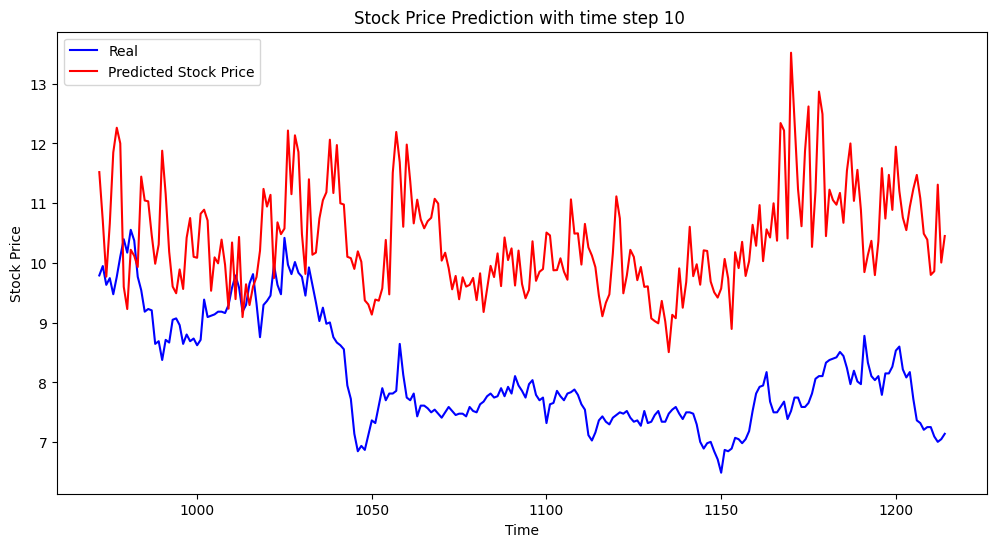

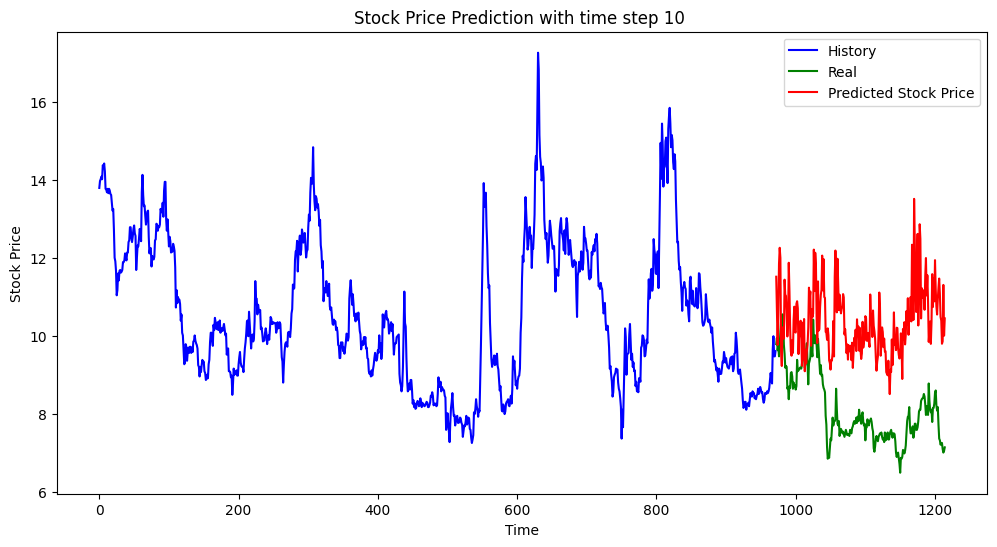

The MSE is 6.275878307711394
The MAE is 2.286548318557378


In [80]:
# Predict
predictions = []
frac_test = fraction_calculater(test.copy())
X_test = prepare_test_data_mul(frac_train, frac_test, rnn_mul_model.time_step, rnn_mul_model.scaler)
print(X_test.shape)
for i in range(len(X_test)):
    testX = X_test[i].reshape(1, rnn_mul_model.time_step, X_test.shape[2])
    prediction = rnn_mul_model.predictions(testX)
    predictions.append(prediction[0,0])

# Convert predictions
predictions = pd.Series(predictions, index = test.index)

# Plot predictions
rnn_mul_model.plot_predictions(test['adj_cl'], predictions)

# Plot the whole data
rnn_mul_model.plot_full_data(train['adj_cl'], test['adj_cl'], predictions)

# Evaluate the model
# Calculate MSE and MAE
mse = mean_squared_error(predictions, test['adj_cl'])
mae = mean_absolute_error(predictions, test['adj_cl'])
print(f'The MSE is {mse}')
print(f'The MAE is {mae}')

## 3.3 GRU

In [20]:
class GRU_MUL(BaseModel_MUL):
    def __init__(self, data: pd.DataFrame, time_step: int, units: int, batch_size: int):
        super().__init__(data, time_step, units, batch_size)

    def build_model(self, X, y):
        self.model = Sequential()
        # GRU Layer 1
        self.model.add(GRU(units=self.units, return_sequences=True, input_shape=(self.time_step, X.shape[2])))
        self.model.add(Dropout(0.2))
        # GRU Layer 2
        self.model.add(GRU(units=self.units, return_sequences=True))
        self.model.add(Dropout(0.2))
        # Dense
        self.model.add(Flatten())
        self.model.add(Dense(1))
        self.model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mean_absolute_error'])
        self.model.fit(X, y, epochs=800, batch_size=32, verbose=1, shuffle=False, validation_split=0.25)

    # Predict the data
    def predictions(self, data):
        predictions = self.model.predict(data)
        return predictions

data = pd.read_csv('./Chinese Stock Market/price.csv', index_col=0)
df = data.copy()

gru_mul_model = GRU_MUL(df, time_step= 10, units = 50, batch_size = 32)
train, test = gru_mul_model.split_data(0.8, 0.2)
frac_train = fraction_calculater(train.copy())
print(frac_train.shape)
frac_train_scaled = frac_train.copy()
print(frac_train_scaled.shape)
print(type(frac_train))
train_label = train['adj_cl'].copy()
min_length = min(len(frac_train_scaled), len(train_label))
train_scaled = frac_train_scaled[:min_length]
train_label = train_label.iloc[:min_length]
print(train_scaled.shape)
print(train_label.shape)
X_train, y_train = gru_mul_model.transform_data(train_scaled, train_label)
gru_mul_model.build_model(X_train, y_train)


(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 2s 25ms/step - loss: 98.9356 - mean_absolute_error: 9.7632 - val_loss: 45.1438 - val_mean_absolute_error: 6.4655
Epoch 2/800
23/23 [==============================] - 0s 8ms/step - loss: 18.7262 - mean_absolute_error: 3.5289 - val_loss: 3.5131 - val_mean_absolute_error: 1.3169
Epoch 3/800
23/23 [==============================] - 0s 7ms/step - loss: 4.5283 - mean_absolute_error: 1.7649 - val_loss: 3.2422 - val_mean_absolute_error: 1.3734
Epoch 4/800
23/23 [==============================] - 0s 7ms/step - loss: 4.7507 - mean_absolute_error: 1.9133 - val_loss: 3.5603 - val_mean_absolute_error: 1.3140
Epoch 5/800
23/23 [==============================] - 0s 6ms/step - loss: 5.0542 - mean_absolute_error: 1.9634 - val_loss: 3.4398 - val_mean_absolute_error: 1.3168
Epoch 6/800
23/23 [==============================] - 0s 7ms/ste

KeyboardInterrupt: 

(243, 10, 3)
(243, 10, 3)
(243, 10, 3)
1/1 [==============================] - 0s 24ms/step


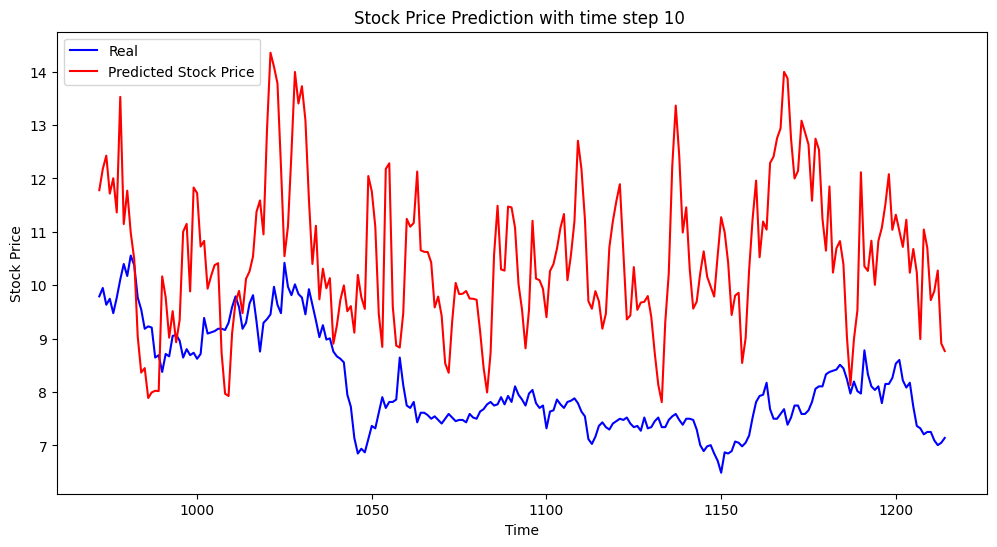

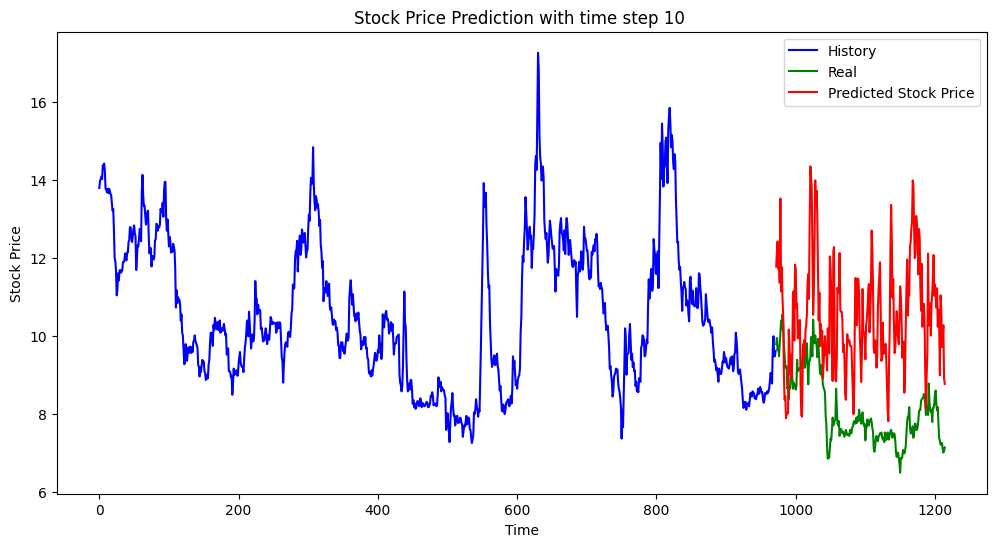

The MSE is 8.013020406797827
The MAE is 2.492141684464699


In [82]:
# Predict
predictions = []
frac_test = fraction_calculater(test.copy())
X_test = prepare_test_data_mul(frac_train, frac_test, gru_mul_model.time_step, gru_mul_model.scaler)
print(X_test.shape)
for i in range(len(X_test)):
    testX = X_test[i].reshape(1, gru_mul_model.time_step, X_test.shape[2])
    prediction = gru_mul_model.predictions(testX)
    predictions.append(prediction[0,0])

# Convert predictions
predictions = pd.Series(predictions, index = test.index)

# Plot predictions
gru_mul_model.plot_predictions(test['adj_cl'], predictions)

# Plot the whole data
gru_mul_model.plot_full_data(train['adj_cl'], test['adj_cl'], predictions)

# Evaluate the model
# Calculate MSE and MAE
mse = mean_squared_error(predictions, test['adj_cl'])
mae = mean_absolute_error(predictions, test['adj_cl'])
print(f'The MSE is {mse}')
print(f'The MAE is {mae}')

## 3.4 HMM

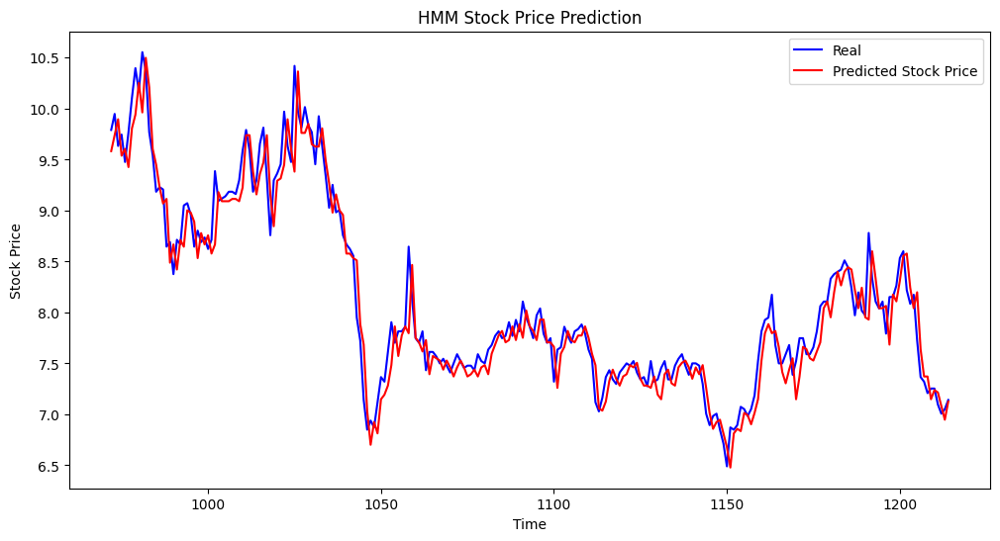

The MSE is 0.053985681957621254
The MAE is 0.17149040110331382


In [32]:
data = pd.read_csv('./Chinese Stock Market/price.csv', index_col=0)
df = data.copy()

# Feature Engineering
# Use fraction change as feature
def fraction_calculater(data):

    open_price = data['op']
    close_price = data['adj_cl']
    high_price = data['high']
    low_price = data['low']

    frac_change = (close_price - open_price) / open_price
    frac_high = (high_price - open_price) / open_price
    frac_low = (low_price - open_price) / open_price

    frac_data = pd.concat([frac_change, frac_high, frac_low], axis = 1)
    frac_data.columns = ['frac_change', 'frac_high', 'frac_low']
    return frac_data

# Split the data into train and test
def model_split_data(data: pd.DataFrame, train_ratio:float, test_ratio:float):
    train_size = int(len(data) * train_ratio)
    test_size = int(len(data) * test_ratio)
    train = data.iloc[:train_size]
    test = data.iloc[train_size:]
    return train, test

hmm_train, hmm_test = model_split_data(df, 0.8, 0.2)
frac_vec = fraction_calculater(hmm_train)

# Build the HMM model
hmm_model = GaussianHMM(n_components=4)
hmm_model.fit(frac_vec)

def discrete_range(n_steps_change, n_steps_high, n_steps_low):
    # increment = 0.01
    # frac_change: from -0.1 to 0.1
    # frac_high: from 0 to 0.1
    # frac_low: from 0  to 0.1

    frac_change_range = np.linspace(-0.1, 0.1, n_steps_change)
    frac_high_range = np.linspace(0, 0.1, n_steps_high)
    frac_low_range = np.linspace(0, 0.1, n_steps_low)

    possible_outcomes = np.array(list(itertools.product(frac_change_range, frac_high_range, frac_low_range)))
    return possible_outcomes

possible_outcomes = discrete_range(20, 10, 10)

# Find the combination of fractions that gives the max probability
def find_max_prob(day_index, hmm_model, possible_outcomes, test_data, latency_date):
    previous_data_start_date = max(0, day_index - latency_date)
    previous_data_end_date = max(0, day_index - 1)

    previous_data = test_data.iloc[previous_data_end_date:previous_data_start_date]
    previous_data_frac = fraction_calculater(previous_data)

    outcome_score = []
    for outcome in possible_outcomes:
        one_outcome = np.row_stack((previous_data_frac, outcome))
        outcome_score.append(hmm_model.score(one_outcome))

    most_likely_outcome = possible_outcomes[np.argmax(outcome_score)]
    return most_likely_outcome

# most_likely_outcome = find_max_prob(20, hmm_model, possible_outcomes, hmm_test, 10)
# print(most_likely_outcome)

# Predict the data
def get_close_price(day_index, test_data, most_likely_outcome, hmm, possible_outcomes):
    open_price = test_data['op'].iloc[day_index]
    predicted_frac_changes, _, _ = most_likely_outcome
    predicted_close_price = open_price * (1 + predicted_frac_changes)
    return predicted_close_price
# predicted_close_price = get_close_price(20, hmm_test, most_likely_outcome, hmm_model, possible_outcomes)
# print(predicted_close_price)

def predicted_close_price(test_data, hmm, possible_outcomes, latency_date: float):
    predicted_close_prices = []
    for day_index in range(test_data.shape[0]):
        most_likely_outcome = find_max_prob(day_index, hmm, possible_outcomes, test_data, latency_date = 10)
        predicted_close_price = get_close_price(day_index, test_data, most_likely_outcome, hmm, possible_outcomes)
        predicted_close_prices.append(predicted_close_price)
    return predicted_close_prices

prediction = predicted_close_price(hmm_test, hmm_model, possible_outcomes, latency_date = 10)
# print(prediction)

# Evaluate the model and plot the result
def plot_predictions(test_data, predicting_data):
    predicting_data = pd.Series(predicting_data, index = test_data.index)
    plt.figure(figsize=(12, 6))
    plt.plot(test_data['adj_cl'], color='blue', label='Real')
    plt.plot(predicting_data, color='red', label='Predicted Stock Price')
    plt.title('HMM Stock Price Prediction')
    plt.xlabel('Time')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.show()

plot_predictions(hmm_test, prediction)

mse = mean_squared_error(prediction, hmm_test['adj_cl'])
mae = mean_absolute_error(prediction, hmm_test['adj_cl'])

print(f'The MSE is {mse}')
print(f'The MAE is {mae}')

# 4 Comparison

## 4.1 Model Integration

In [37]:
def rolling_arma_decompose(train_data,test_data):
    #using decompose to get trend
    def get_decompose_result(train_data):
        decompose_result=seasonal_decompose(train_data,model='additive',period=30)
        trend=decompose_result.trend
        season=decompose_result.seasonal
        residual=decompose_result.resid
        return trend,season,residual
    def fit_trend(trend):
        #using polynomial fitting to get trend
        #fill nan with before or after value
        na_index=trend.isna()
        trend_values=trend.values
        #index which is not na
        x_index=np.array([i for i in range(len(trend_values)) if not na_index[i]])
        trend_nonnan_value=np.array(trend_values[x_index])
        #fitting
        coefs = np.polyfit(x_index, trend_nonnan_value, deg=2)
        trend_predict = np.polyval(coefs, x_index)
        return coefs,trend_predict
    def fit_season(season):
        L=30
        season_values=season.values
        season_values_ref=season_values[:L]
        return season_values_ref
    def pred_trend(coefs,train_data,test_data):
        trend_predict_test=np.polyval(coefs, [i for i in range(len(train_data),len(train_data)+len(test_data))])
        return trend_predict_test
    def pred_season(season_values_ref,test_data):
        season_predict_test=season_values_ref[-len(test_data):]
        return season_predict_test

    def pred_resi(residual,season,trend,train_data,test_data):
        #residual predicting for test data
        L=30
        train_new_resi_data=residual.dropna().values
        test_start_index=len(train_new_resi_data)
        test_predict=[]
        season_values_ref=fit_season(season)
        coefs,_=fit_trend(trend)
        trend_predict_test=pred_trend(coefs,train_data,test_data)
        test_x_index=np.array([i for i in range(len(train_data),len(train_data)+len(test_data))])
        for i in range(len(test_data)):
            season_now=season_values_ref[(i+len(train_new_resi_data))%L]
            trend_now=trend_predict_test[i]
            resi_now=test_data.values[i]-season_now-trend_now
            train_new_resi_data=np.append(train_new_resi_data,resi_now)
            model = ARIMA(train_new_resi_data, order=(1,0,0))
            model_fit = model.fit()
            test_predict.append(model_fit.forecast()[0]+season_now+trend_now)
        #plt.plot(train_data.index,train_data.values,label='train')
        #plt.plot(test_x_index,test_data.values,label='real test')
        #plt.plot(test_x_index,test_predict,label='predict test')
        return test_predict
    def mse_mae(test_predict,test_data):
        mse = mean_squared_error(test_predict, test_data)
        mae = mean_absolute_error(test_predict, test_data)
        return mse,mae
    trend,season,residual=get_decompose_result(train_data)
    test_predict=pred_resi(residual,season,trend,train_data,test_data)
    return mse_mae(test_predict,test_data)

In [38]:
def rolling_kf(train_data,test_data):
    train_in=pd.DataFrame(train_data)
    col_name=train_in.columns[0]
    train_in.index=[i for i in range(train_data.shape[0])]
    train_seried=TimeSeries.from_dataframe(train_in)
    h=test_data.shape[0]

    test_predict = []
    for i in range(len(test_data)):
        model = KalmanForecaster(dim_x=5)
        model.fit(train_seried)
        pred = model.predict(1).pd_dataframe()
        test_predict.append(pred[col_name].values[0])
        train_in.at[i+len(train_data),col_name]=test_data.values[i]
        train_seried=TimeSeries.from_dataframe(train_in)
    plt.plot(train_x_index,train_data.values,label='train')
    plt.plot(test_x_index,test_data.values,label='real test')
    plt.plot(test_x_index,test_predict,label='darts predict')
    plt.legend()
    plt.show()
    mse = mean_squared_error(test_predict, test_data)
    mae = mean_absolute_error(test_predict, test_data)
    return mse,mae

In [39]:
def LSTM_mse(df):
    time = 46
    batch_size = 32

    lstm_model = LSTMMODEL(df, time_step= time, units = 50, batch_size = batch_size)
    train, test = lstm_model.split_data(0.8, 0.2)
    train_scaled = lstm_model.preprocess_data(train)
    train_label = train.copy()
    min_length = min(len(train_scaled), len(train_label))
    train_scaled = train_scaled[:min_length]
    train_label = train_label.iloc[:min_length]
    X_train, y_train = lstm_model.transform_data(train_scaled, train_label)
    lstm_model.build_model(X_train, y_train)

    # Predict
    predictions = []

    X_test = prepare_test_data(train,test, lstm_model.time_step, lstm_model.scaler)
    for i in range(len(X_test)):
        testX = X_test[i].reshape(1, lstm_model.time_step, 1)
        prediction = lstm_model.predictions(testX)
        predictions.append(prediction[0,0])
    # Convert predictions
    predictions = pd.Series(predictions, index = test.index)

    # Plot predictions
    lstm_model.plot_predictions(test, predictions)

    # Plot the whole data
    lstm_model.plot_full_data(train, test, predictions)

    # Evaluate the model
    # Calculate MSE and MAE
    mse = mean_squared_error(predictions, test)
    mae = mean_absolute_error(predictions, test)

    return mse,mae

In [62]:
def RNN_mse(df):

    time = 42
    batch_size = 32
    rnn_model = RNNMODEL(df, time_step= time, units = 50, batch_size = batch_size)
    train, test = rnn_model.split_data(0.8, 0.2)
    train_scaled = rnn_model.preprocess_data(train)
    train_label = train.copy()
    min_length = min(len(train_scaled), len(train_label))
    train_scaled = train_scaled[:min_length]
    train_label = train_label.iloc[:min_length]
    X_train, y_train = rnn_model.transform_data(train_scaled, train_label)
    rnn_model.build_model(X_train, y_train)

    # Predict
    predictions = []
    X_test = prepare_test_data(train,test, rnn_model.time_step, rnn_model.scaler)
    for i in range(len(X_test)):
        testX = X_test[i].reshape(1, rnn_model.time_step, 1)
        prediction = rnn_model.predictions(testX)
        predictions.append(prediction[0,0])
    # Convert predictions
    predictions = pd.Series(predictions, index = test.index)

    # Plot predictions
    rnn_model.plot_predictions(test, predictions)

    # Plot the whole data
    rnn_model.plot_full_data(train, test, predictions)

    # Evaluate the model
    # Calculate MSE and MAE
    mse = mean_squared_error(predictions, test)
    mae = mean_absolute_error(predictions, test)
    print(f'The MSE is {mse}')
    print(f'The MAE is {mae}')
    return mse,mae


In [68]:
def GRU_mse(df):
    time = 46
    batch_size = 32

    gru_model = GRUMODEL(df, time_step= time, units = 50, batch_size = batch_size)
    train, test = gru_model.split_data(0.8, 0.2)
    train_scaled = gru_model.preprocess_data(train)
    train_label = train.copy()
    min_length = min(len(train_scaled), len(train_label))
    train_scaled = train_scaled[:min_length]
    train_label = train_label.iloc[:min_length]
    X_train, y_train = gru_model.transform_data(train_scaled, train_label)
    gru_model.build_model(X_train, y_train)

    # Predict
    predictions = []
    X_test = prepare_test_data(train,test, gru_model.time_step, gru_model.scaler)
    for i in range(len(X_test)):
        testX = X_test[i].reshape(1, gru_model.time_step, 1)
        prediction = gru_model.predictions(testX)
        predictions.append(prediction[0,0])
    # Convert predictions
    predictions = pd.Series(predictions, index = test.index)

    # Plot predictions
    gru_model.plot_predictions(test, predictions)

    # Plot the whole data
    gru_model.plot_full_data(train, test, predictions)

    # Evaluate the model
    # Calculate MSE and MAE
    mse = mean_squared_error(predictions, test)
    mae = mean_absolute_error(predictions, test)
    print(f'The MSE is {mse}')
    print(f'The MAE is {mae}')
    return mse,mae

## 4.2 Numerical Test

### 4.2.1 Single Feature

In [42]:
#find data column which has no nan
data = pd.read_csv('./Chinese Stock Market/CL.csv',index_col=0)
data_col=[]
for col in data.columns:
    if data[col].isna().sum()==0:
        data_col.append(col)

#random choose 8 data column to predict
import random
random.seed(42)
random_col=random.sample(data_col,8)
random_col

['3537', '593', '115', '4072', '1282', '1154', '1064', '711', '4040', '484']

(1) ARMA-Decompose

In [43]:
error_df=pd.DataFrame(columns=['mse','mae'])
for col in random_col:
    train_data_cur, _, test_data_cur = split_data(data[col], 0.8, 0, 0.2)
    print('current column is: ',col)
    mse,mae=rolling_arma_decompose(train_data_cur,test_data_cur)
    print('mse is: ',mse)
    print('mae is: ',mae)
    error_df.loc[col]=[mse,mae]
error_df

current column is:  3537


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


mse is:  2.831573790947407
mae is:  0.753969530511492
current column is:  593
mse is:  0.7857985323656508
mae is:  0.7548792880135986
current column is:  115
mse is:  0.1651281221593801
mae is:  0.32724467785420824
current column is:  4072
mse is:  0.6695110220614033
mae is:  0.5994155027672886
current column is:  1282


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


mse is:  6.171127827984172
mae is:  1.0277240488581836
current column is:  1154
mse is:  0.1390597338971447
mae is:  0.2867439628228682
current column is:  1064
mse is:  0.06458367384314198
mae is:  0.2366875014684458
current column is:  711
mse is:  0.12685032883706449
mae is:  0.3028088663775268
current column is:  4040
mse is:  0.05664308013544795
mae is:  0.19484405150534587
current column is:  484
mse is:  0.06411464275113357
mae is:  0.21264977998788245


,mse,mae
3537,2.831574,0.753970
593,0.785799,0.754879
115,0.165128,0.327245
4072,0.669511,0.599416
1282,6.171128,1.027724
1154,0.139060,0.286744
1064,0.064584,0.236688
711,0.126850,0.302809
4040,0.056643,0.194844
484,0.064115,0.212650


(2) KF

In [ ]:
error_df2=pd.DataFrame(columns=['mse','mae'])
for col in random_col:
    train_data_cur, _, test_data_cur = split_data(data[col], 0.8, 0, 0.2)
    print('current column is: ',col)
    mse,mae=rolling_kf(train_data_cur,test_data_cur)
    print('mse is: ',mse)
    print('mae is: ',mae)
    error_df2.loc[col]=[mse,mae]
error_df2

current column is:  3537
mse is:  5.595643601003564
mae is:  1.7111448166647711
current column is:  593
mse is:  4.318362363743186
mae is:  1.4441243680479936
current column is:  115
mse is:  0.4197348268790152
mae is:  0.461632223687619
current column is:  4072
mse is:  1.9099416584052806
mae is:  1.0416307850727564
current column is:  1282
mse is:  34.81439402920116
mae is:  4.623358131894631
current column is:  1154
mse is:  0.45628559971358407
mae is:  0.4932193244567748
current column is:  1064
mse is:  0.20825829371955357
mae is:  0.3429787956962977
current column is:  711
mse is:  1.6830706066600014
mae is:  1.0112445063833702
current column is:  4040
mse is:  0.30157438753701443
mae is:  0.39808489894607624
current column is:  484
mse is:  0.17374381314890927
mae is:  0.30908633591018825


,mse,mae
3537,5.595644,1.711145
593,4.318362,1.444124
115,0.419735,0.461632
4072,1.909942,1.041631
1282,34.814394,4.623358
1154,0.456286,0.493219
1064,0.208258,0.342979
711,1.683071,1.011245
4040,0.301574,0.398085
484,0.173744,0.309086


(3) LSTM

current column is:  3537
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/600
22/22 [==============================] - 11s 286ms/step - loss: 1600.3240 - mean_absolute_error: 38.5259 - val_loss: 6564.7642 - val_mean_absolute_error: 72.9361
Epoch 2/600
22/22 [==============================] - 3s 140ms/step - loss: 271.7282 - mean_absolute_error: 11.1315 - val_loss: 3855.2600 - val_mean_absolute_error: 50.9026
Epoch 3/600
22/22 [==============================] - 3s 130ms/step - loss: 129.2124 - mean_absolute_error: 9.9600 - val_loss: 4511.0879 - val_mean_absolute_error: 56.9677
Epoch 4/600
22/22 [==============================] - 4s 170ms/step - loss: 141.4751 - mean_absolute_error: 9.3687 - val_loss: 4266.3237 - val_mean_absolute_error: 54.7931
Epoch 5/600
22/22 [==============================] - 2s 112ms/step - loss: 135.7206 - mean_absolute_error: 9.6333 - val_loss: 4310.6265 - val_mean_absolute_error: 55.2080
Epoch 6/600
22/22 [==============================] - 1s 66ms/step - lo

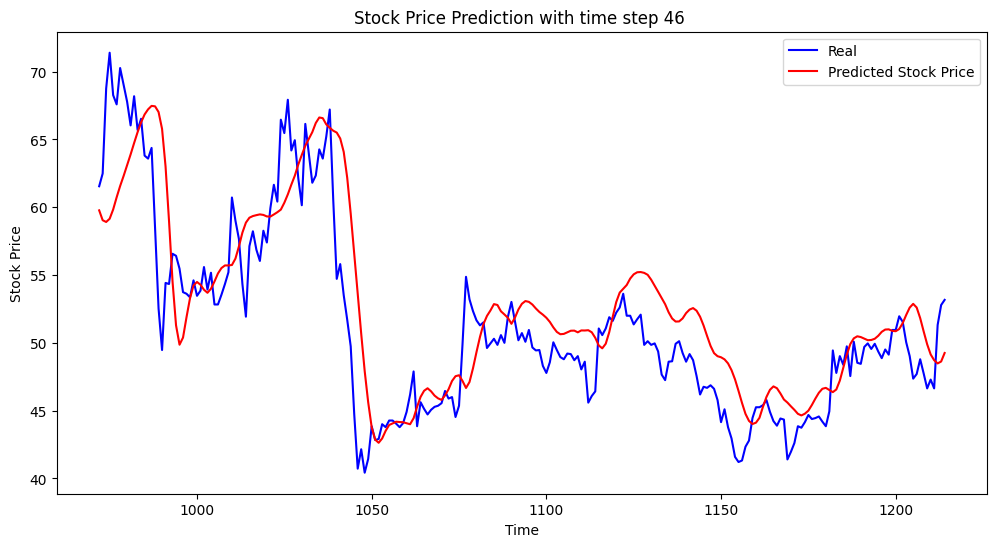

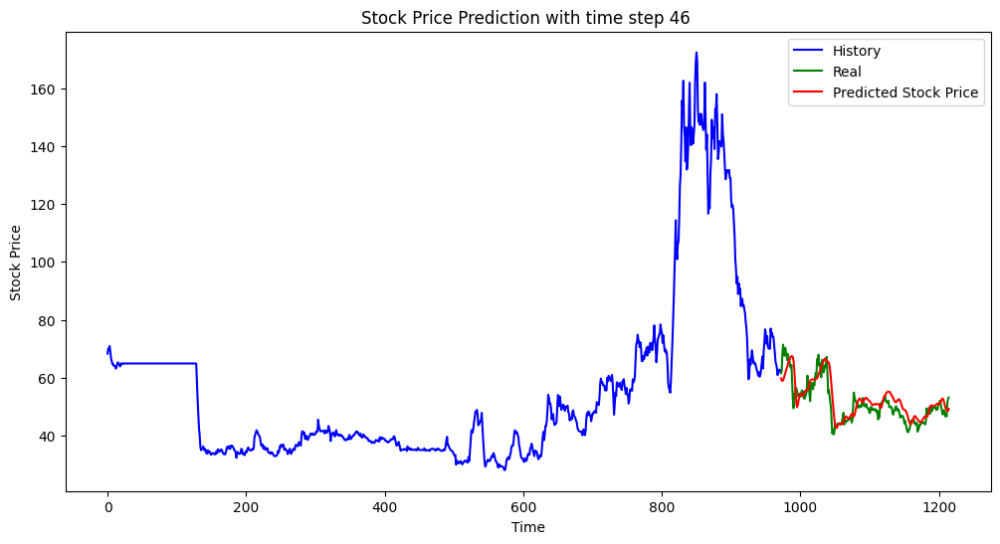

mse is:  16.144190246713276
mae is:  2.9516759965056747
current column is:  593
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/600
22/22 [==============================] - 8s 122ms/step - loss: 4170.5562 - mean_absolute_error: 63.7042 - val_loss: 3145.1746 - val_mean_absolute_error: 55.7740
Epoch 2/600
22/22 [==============================] - 2s 70ms/step - loss: 471.5027 - mean_absolute_error: 20.0931 - val_loss: 42.6864 - val_mean_absolute_error: 5.3412
Epoch 3/600
22/22 [==============================] - 2s 72ms/step - loss: 432.3590 - mean_absolute_error: 18.4252 - val_loss: 79.1868 - val_mean_absolute_error: 7.2619
Epoch 4/600
22/22 [==============================] - 2s 69ms/step - loss: 340.7478 - mean_absolute_error: 15.9689 - val_loss: 143.9841 - val_mean_absolute_error: 10.5050
Epoch 5/600
22/22 [==============================] - 2s 75ms/step - loss: 280.3477 - mean_absolute_error: 14.3533 - val_loss: 101.0926 - val_mean_absolute_error: 8.4057
Epoch 6/600
22/22 [=======

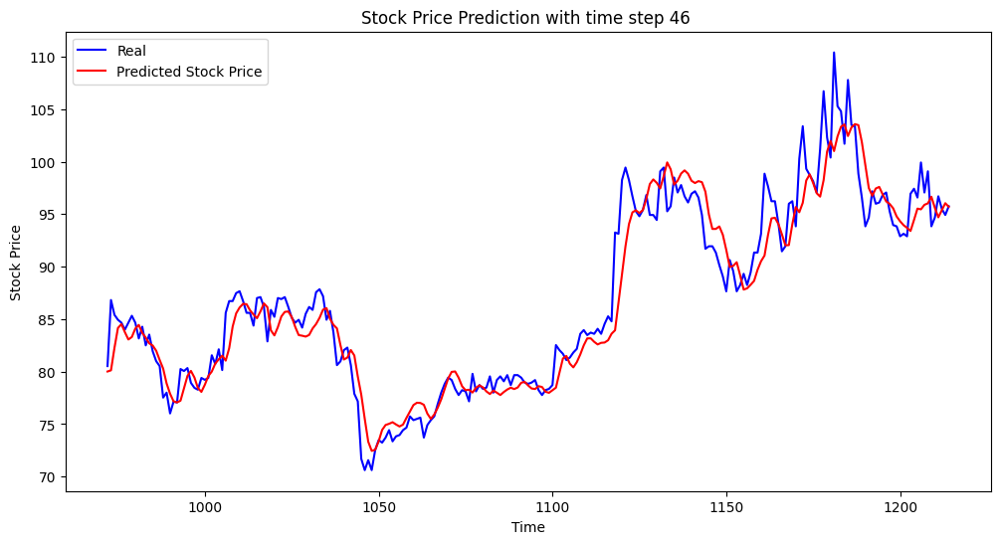

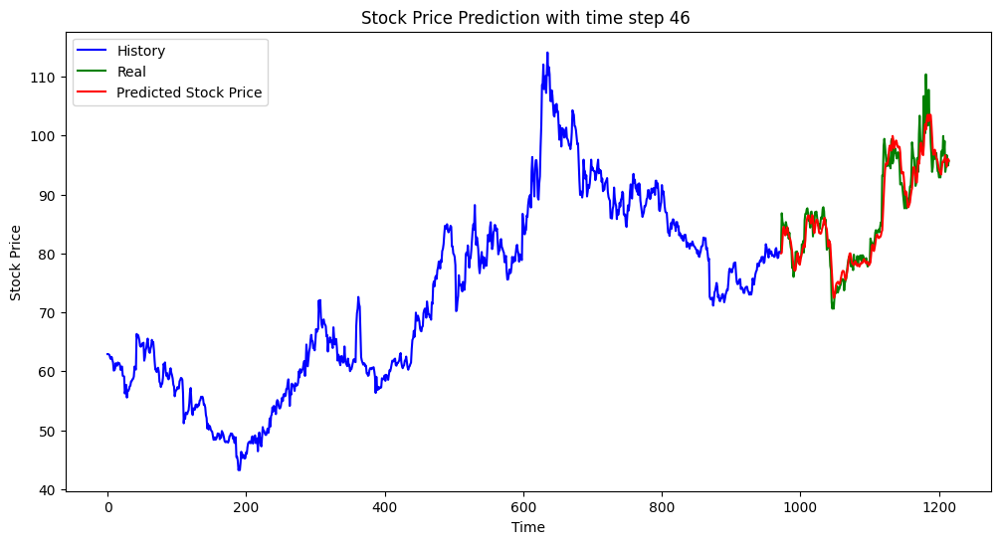

mse is:  6.3195472886314885
mae is:  1.7658341647175602
current column is:  115
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/600
22/22 [==============================] - 9s 164ms/step - loss: 734.3064 - mean_absolute_error: 24.5490 - val_loss: 16.9945 - val_mean_absolute_error: 2.9367
Epoch 2/600
22/22 [==============================] - 2s 71ms/step - loss: 80.0174 - mean_absolute_error: 7.5155 - val_loss: 35.3657 - val_mean_absolute_error: 4.8698
Epoch 3/600
22/22 [==============================] - 2s 71ms/step - loss: 74.1843 - mean_absolute_error: 6.8238 - val_loss: 11.4498 - val_mean_absolute_error: 2.6216
Epoch 4/600
22/22 [==============================] - 2s 74ms/step - loss: 40.6278 - mean_absolute_error: 5.2356 - val_loss: 14.9693 - val_mean_absolute_error: 2.7386
Epoch 5/600
22/22 [==============================] - 2s 72ms/step - loss: 46.9997 - mean_absolute_error: 5.5553 - val_loss: 12.8885 - val_mean_absolute_error: 2.4600
Epoch 6/600
22/22 [======================

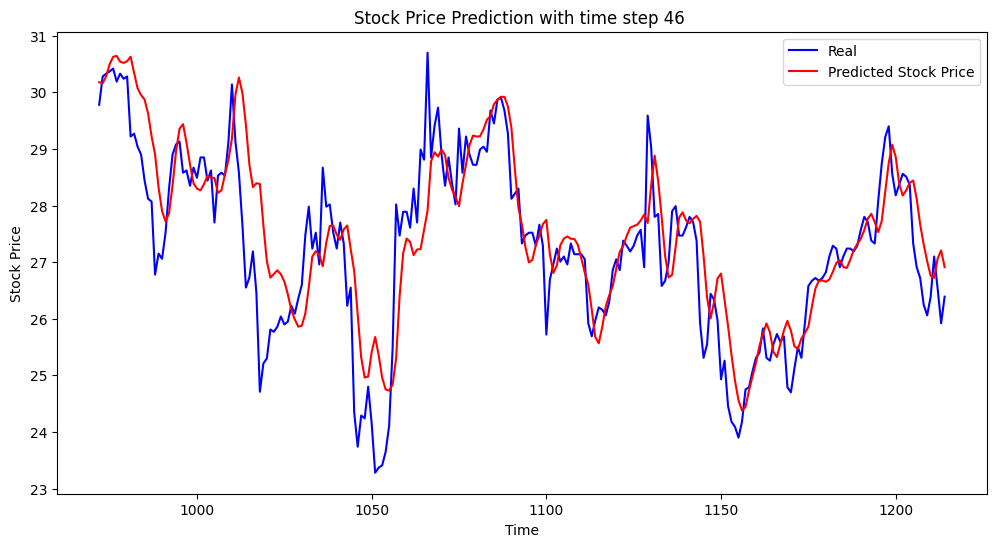

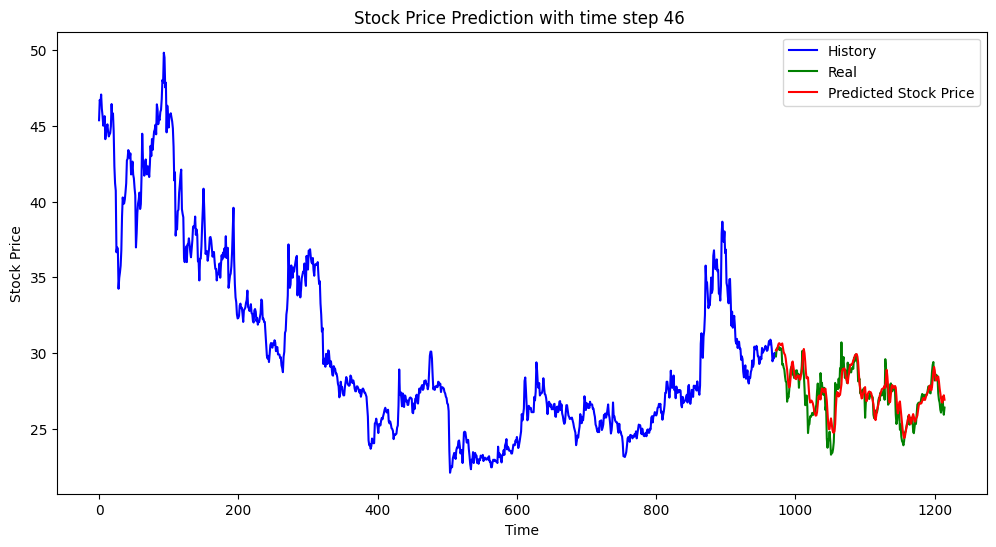

mse is:  0.8171746912519289
mae is:  0.6465394893693336
current column is:  4072
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/600
22/22 [==============================] - 11s 158ms/step - loss: 1517.5643 - mean_absolute_error: 38.1756 - val_loss: 972.1995 - val_mean_absolute_error: 30.0223
Epoch 2/600
22/22 [==============================] - 2s 77ms/step - loss: 98.9555 - mean_absolute_error: 7.8548 - val_loss: 107.2985 - val_mean_absolute_error: 8.0451
Epoch 3/600
22/22 [==============================] - 2s 76ms/step - loss: 289.0558 - mean_absolute_error: 14.0550 - val_loss: 293.5844 - val_mean_absolute_error: 14.8910
Epoch 4/600
22/22 [==============================] - 2s 76ms/step - loss: 182.2381 - mean_absolute_error: 10.7083 - val_loss: 211.0895 - val_mean_absolute_error: 11.8522
Epoch 5/600
22/22 [==============================] - 2s 79ms/step - loss: 205.7680 - mean_absolute_error: 11.6422 - val_loss: 219.2141 - val_mean_absolute_error: 12.1817
Epoch 6/600
22/22 [====

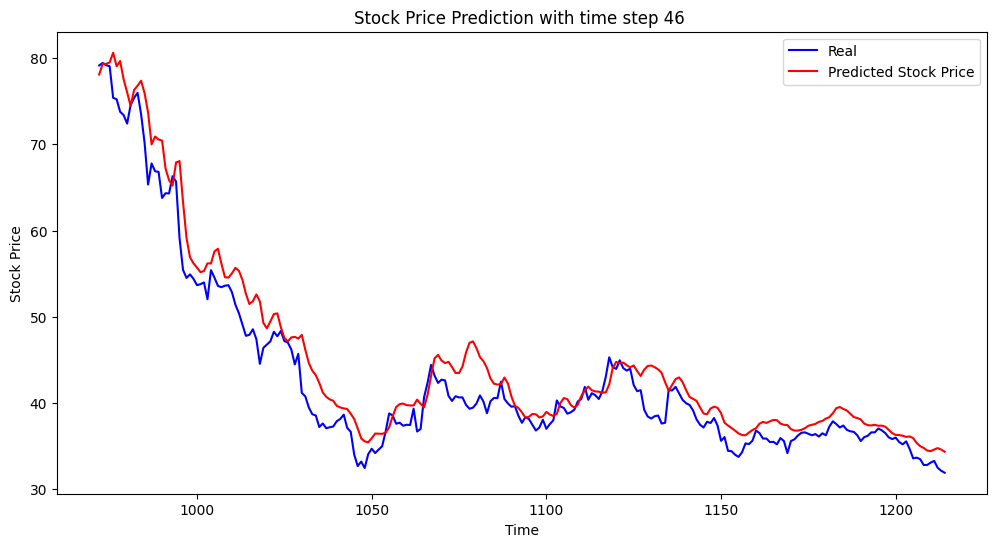

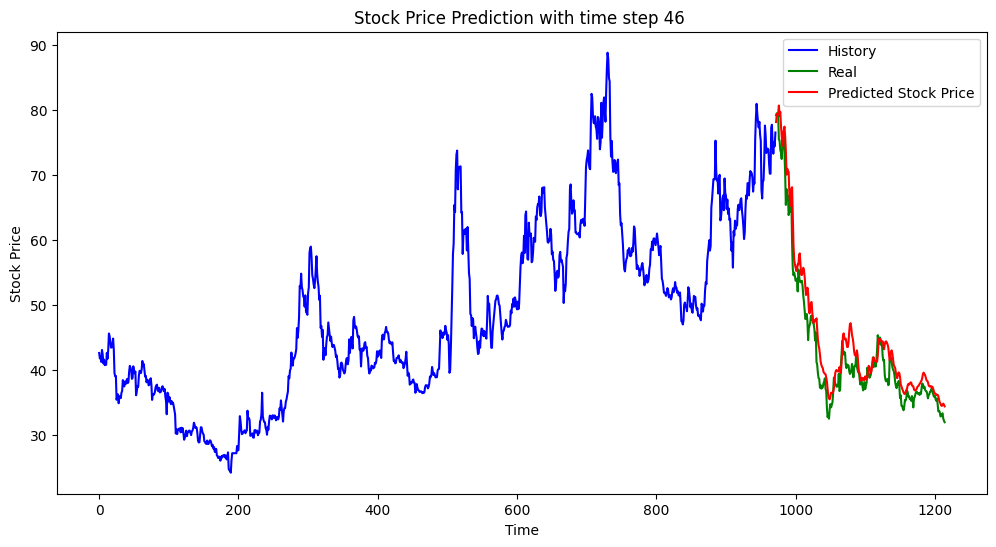

mse is:  8.354011022488638
mae is:  2.2748608794035734
current column is:  1282
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/600
22/22 [==============================] - 8s 150ms/step - loss: 11984.1279 - mean_absolute_error: 91.6896 - val_loss: 43030.3203 - val_mean_absolute_error: 204.3284
Epoch 2/600
22/22 [==============================] - 3s 118ms/step - loss: 6106.8184 - mean_absolute_error: 52.2070 - val_loss: 27010.9629 - val_mean_absolute_error: 160.4056
Epoch 3/600
22/22 [==============================] - 2s 78ms/step - loss: 4297.5249 - mean_absolute_error: 45.7410 - val_loss: 20024.2285 - val_mean_absolute_error: 136.9088
Epoch 4/600
22/22 [==============================] - 2s 79ms/step - loss: 4549.5845 - mean_absolute_error: 54.5599 - val_loss: 18237.2441 - val_mean_absolute_error: 130.2245
Epoch 5/600
22/22 [==============================] - 2s 80ms/step - loss: 4624.8032 - mean_absolute_error: 56.0587 - val_loss: 17834.0391 - val_mean_absolute_error: 128.6760
E

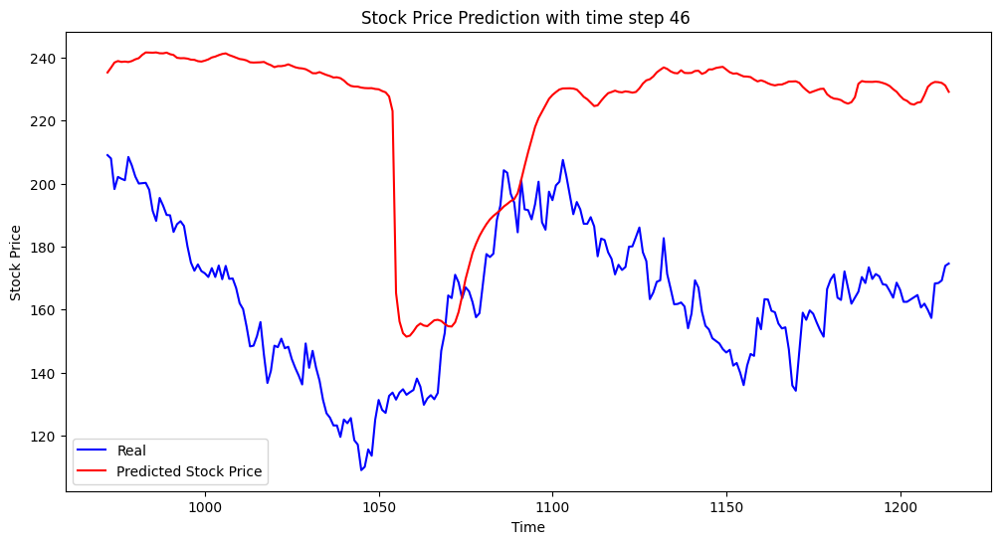

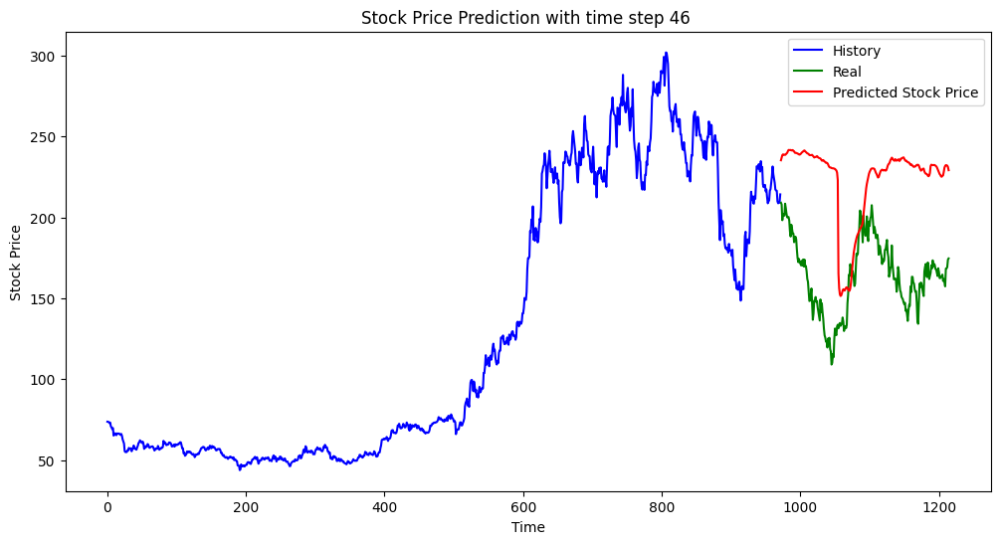

mse is:  4477.796448794907
mae is:  60.184779645503795
current column is:  1154
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/600
22/22 [==============================] - 14s 169ms/step - loss: 656.6395 - mean_absolute_error: 24.8006 - val_loss: 47.7991 - val_mean_absolute_error: 6.7039
Epoch 2/600
22/22 [==============================] - 2s 87ms/step - loss: 64.3111 - mean_absolute_error: 6.7421 - val_loss: 8.0181 - val_mean_absolute_error: 2.5103
Epoch 3/600
22/22 [==============================] - 2s 84ms/step - loss: 30.8989 - mean_absolute_error: 4.5116 - val_loss: 7.5517 - val_mean_absolute_error: 2.4325
Epoch 4/600
22/22 [==============================] - 2s 84ms/step - loss: 35.7830 - mean_absolute_error: 5.0223 - val_loss: 5.7809 - val_mean_absolute_error: 2.1268
Epoch 5/600
22/22 [==============================] - 2s 85ms/step - loss: 33.8616 - mean_absolute_error: 4.8575 - val_loss: 6.4328 - val_mean_absolute_error: 2.2485
Epoch 6/600
22/22 [=========================

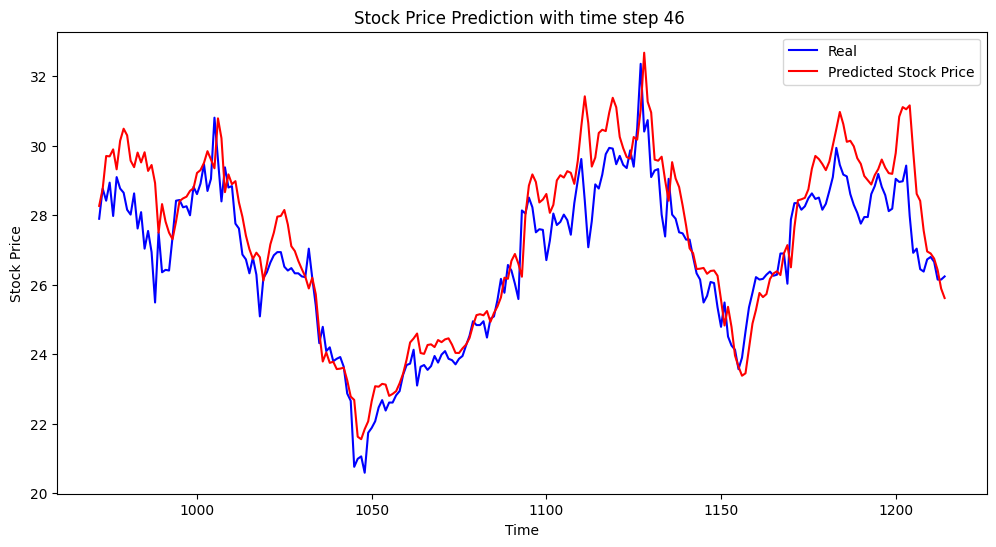

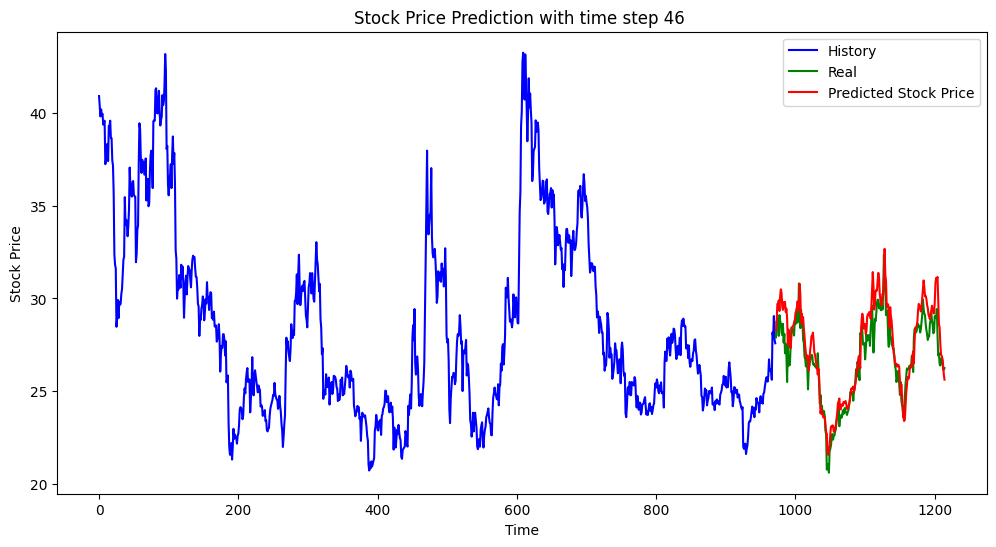

mse is:  1.1307098460800795
mae is:  0.816721416206517
current column is:  1064
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/600
22/22 [==============================] - 8s 137ms/step - loss: 145.2652 - mean_absolute_error: 10.7462 - val_loss: 43.6446 - val_mean_absolute_error: 6.5715
Epoch 2/600
22/22 [==============================] - 3s 118ms/step - loss: 10.4943 - mean_absolute_error: 2.5021 - val_loss: 9.4075 - val_mean_absolute_error: 3.0010
Epoch 3/600
22/22 [==============================] - 3s 128ms/step - loss: 4.6048 - mean_absolute_error: 1.6832 - val_loss: 10.0037 - val_mean_absolute_error: 3.0977
Epoch 4/600
22/22 [==============================] - 2s 85ms/step - loss: 4.9977 - mean_absolute_error: 1.7325 - val_loss: 12.3181 - val_mean_absolute_error: 3.4519
Epoch 5/600
22/22 [==============================] - 2s 91ms/step - loss: 5.0182 - mean_absolute_error: 1.7210 - val_loss: 13.0037 - val_mean_absolute_error: 3.5502
Epoch 6/600
22/22 [========================

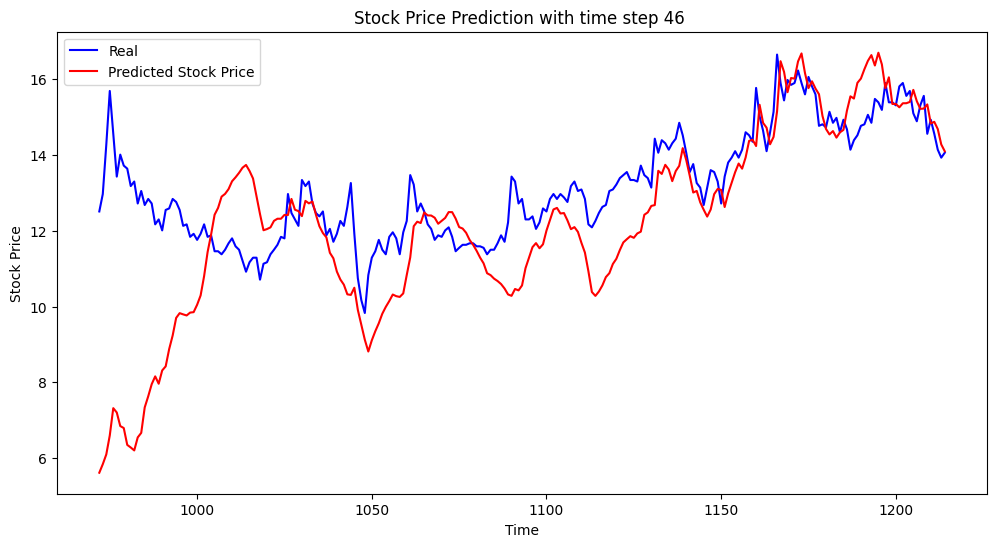

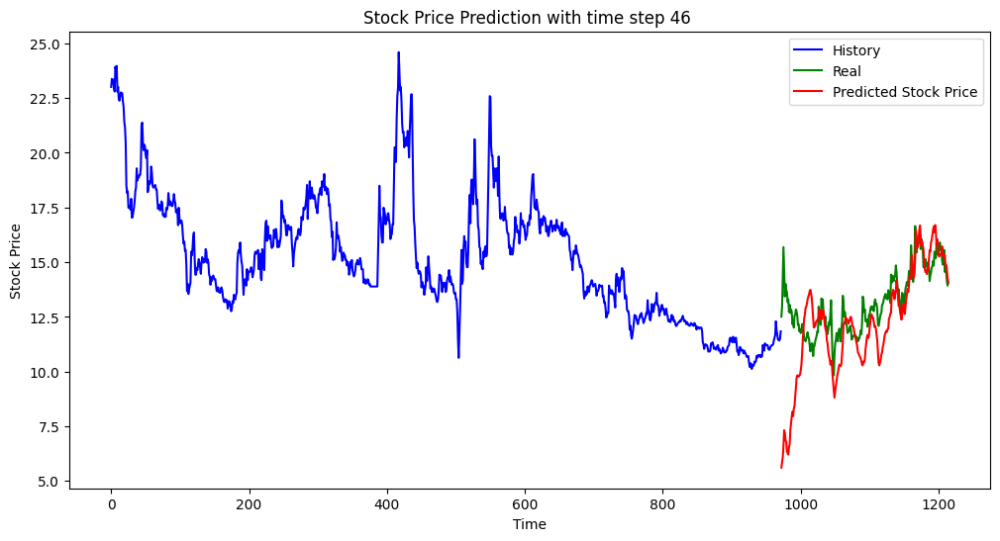

mse is:  4.763699354734484
mae is:  1.4100491000987865
current column is:  711
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/600
22/22 [==============================] - 8s 139ms/step - loss: 211.6759 - mean_absolute_error: 13.7927 - val_loss: 50.8965 - val_mean_absolute_error: 5.2798
Epoch 2/600
22/22 [==============================] - 2s 109ms/step - loss: 19.1943 - mean_absolute_error: 3.5771 - val_loss: 135.5988 - val_mean_absolute_error: 9.3771
Epoch 3/600
22/22 [==============================] - 3s 123ms/step - loss: 6.6496 - mean_absolute_error: 1.9543 - val_loss: 116.6600 - val_mean_absolute_error: 8.3502
Epoch 4/600
22/22 [==============================] - 2s 102ms/step - loss: 4.3990 - mean_absolute_error: 1.3329 - val_loss: 105.0144 - val_mean_absolute_error: 7.7123
Epoch 5/600
22/22 [==============================] - 2s 85ms/step - loss: 4.7918 - mean_absolute_error: 1.4172 - val_loss: 107.8733 - val_mean_absolute_error: 7.8923
Epoch 6/600
22/22 [===================

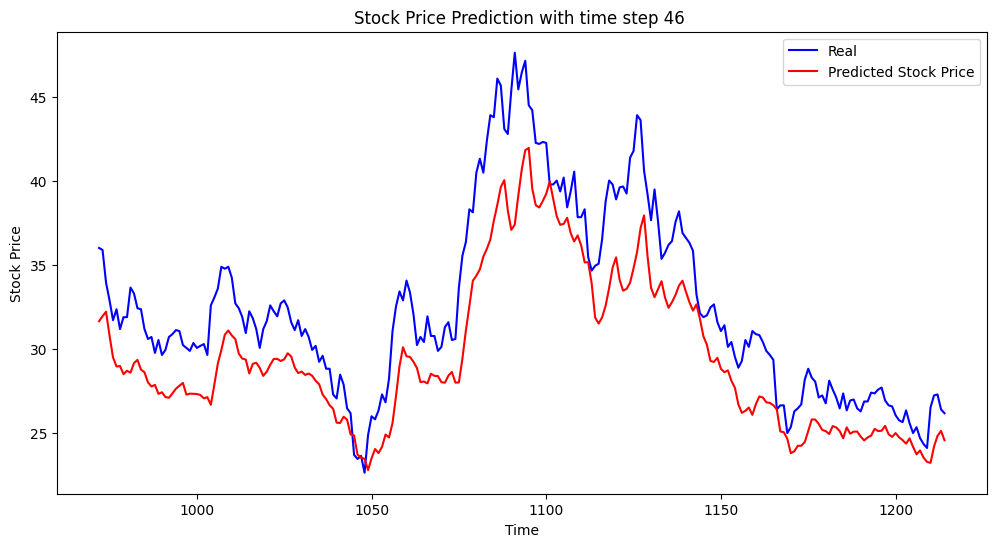

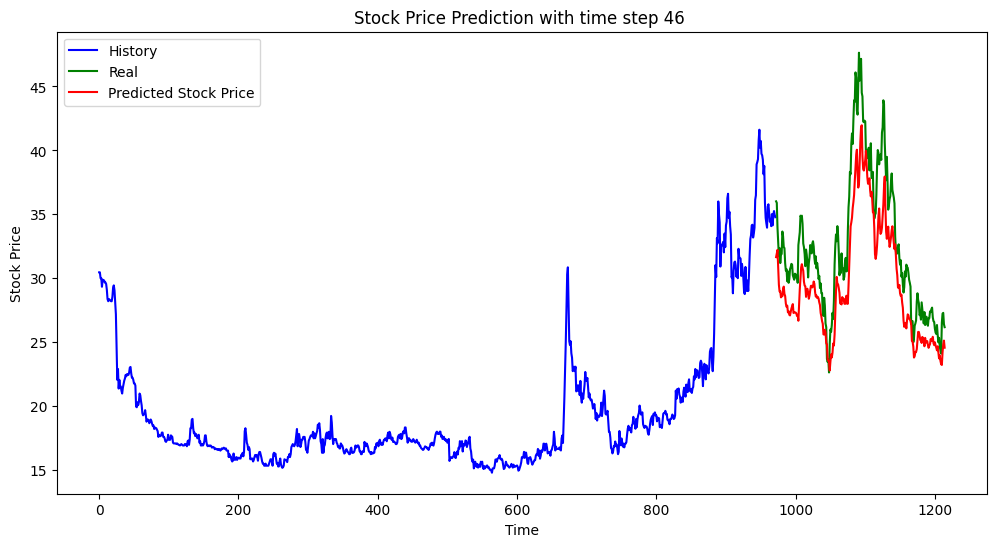

mse is:  11.940557771775106
mae is:  3.018231496928651
current column is:  4040
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/600
22/22 [==============================] - 8s 143ms/step - loss: 271.7509 - mean_absolute_error: 15.4660 - val_loss: 23.2671 - val_mean_absolute_error: 4.3707
Epoch 2/600
22/22 [==============================] - 2s 105ms/step - loss: 33.1910 - mean_absolute_error: 4.5422 - val_loss: 3.8905 - val_mean_absolute_error: 1.4831
Epoch 3/600
22/22 [==============================] - 3s 116ms/step - loss: 10.9549 - mean_absolute_error: 2.6783 - val_loss: 8.0463 - val_mean_absolute_error: 2.4548
Epoch 4/600
22/22 [==============================] - 3s 129ms/step - loss: 11.4792 - mean_absolute_error: 2.6468 - val_loss: 6.2056 - val_mean_absolute_error: 2.1034
Epoch 5/600
22/22 [==============================] - 2s 84ms/step - loss: 11.8940 - mean_absolute_error: 2.7190 - val_loss: 5.7605 - val_mean_absolute_error: 1.9985
Epoch 6/600
22/22 [=======================

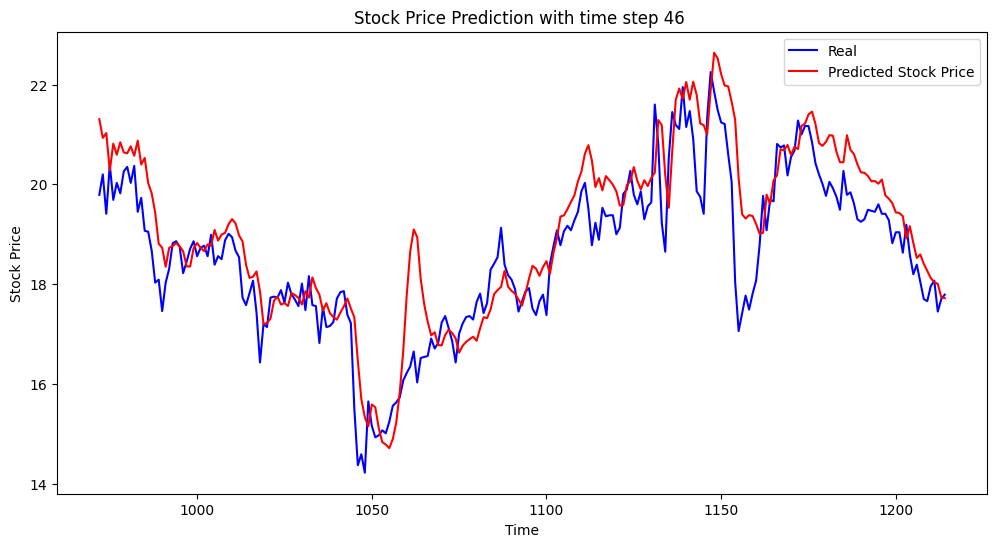

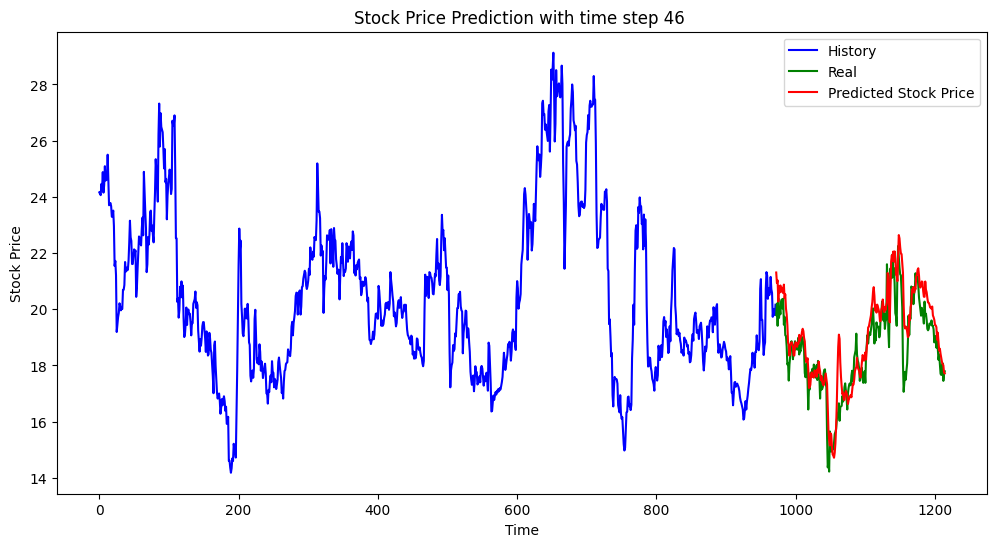

mse is:  0.7245513110740326
mae is:  0.6412131413903256
current column is:  484
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/600
22/22 [==============================] - 15s 209ms/step - loss: 175.0844 - mean_absolute_error: 12.2433 - val_loss: 11.6242 - val_mean_absolute_error: 3.0927
Epoch 2/600
22/22 [==============================] - 2s 90ms/step - loss: 20.3047 - mean_absolute_error: 3.7361 - val_loss: 4.0386 - val_mean_absolute_error: 1.5183
Epoch 3/600
22/22 [==============================] - 2s 90ms/step - loss: 5.1566 - mean_absolute_error: 1.8715 - val_loss: 2.6145 - val_mean_absolute_error: 1.3915
Epoch 4/600
22/22 [==============================] - 2s 91ms/step - loss: 6.7332 - mean_absolute_error: 2.0442 - val_loss: 2.7777 - val_mean_absolute_error: 1.4388
Epoch 5/600
22/22 [==============================] - 3s 115ms/step - loss: 7.3337 - mean_absolute_error: 2.1712 - val_loss: 2.7435 - val_mean_absolute_error: 1.4309
Epoch 6/600
22/22 [===========================

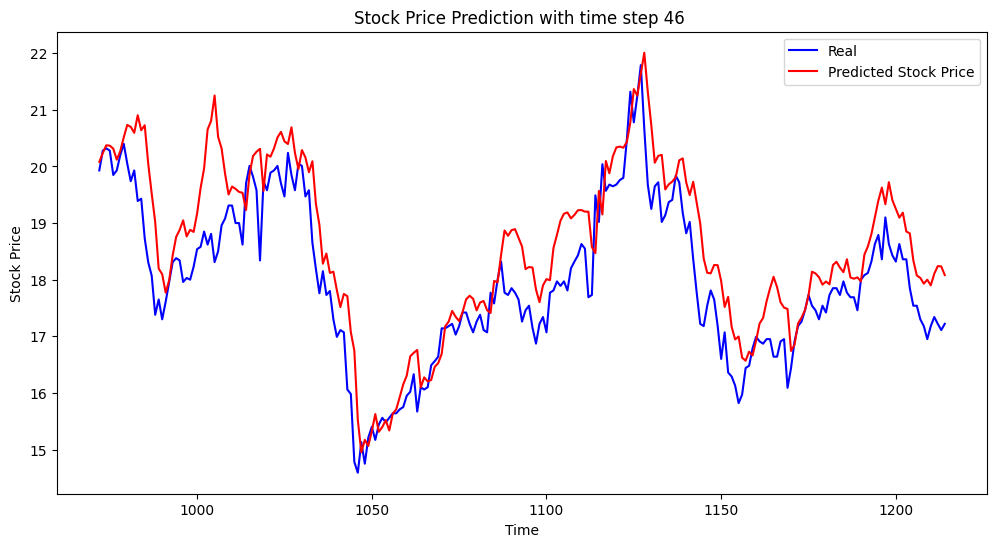

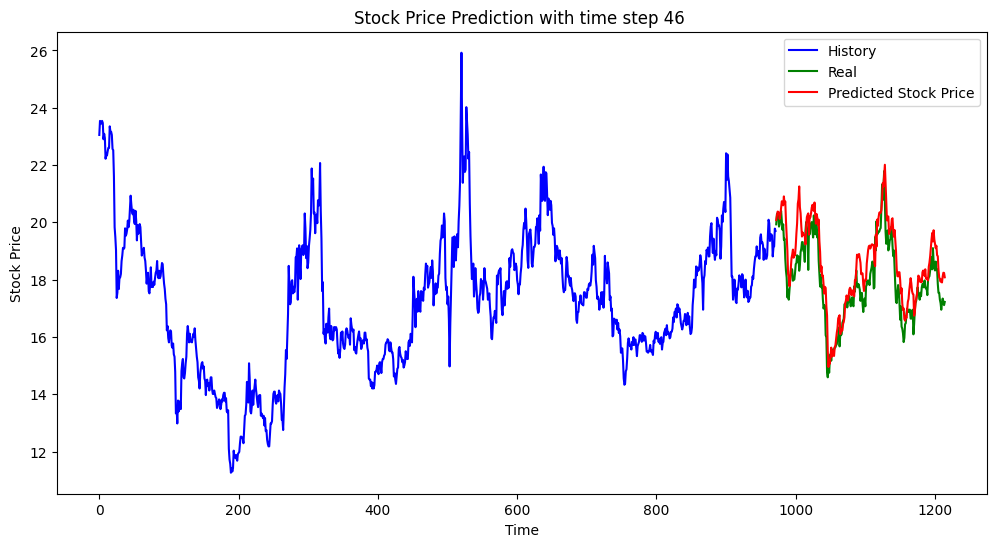

mse is:  0.6732162669891222
mae is:  0.6547851775997461


,mse,mae
3537,16.144190,2.951676
593,6.319547,1.765834
115,0.817175,0.646539
4072,8.354011,2.274861
1282,4477.796449,60.184780
1154,1.130710,0.816721
1064,4.763699,1.410049
711,11.940558,3.018231
4040,0.724551,0.641213
484,0.673216,0.654785


In [51]:
error_df3=pd.DataFrame(columns=['mse','mae'])
for col in random_col:
    print('current column is: ',col)
    mse,mae=LSTM_mse(data[col])
    print('mse is: ',mse)
    print('mae is: ',mae)
    error_df3.loc[col]=[mse,mae]
error_df3

(4) RNN

current column is:  3537
Shape of X:  (930, 42, 1)
Shape of y:  (930,)
Epoch 1/300
22/22 [==============================] - 11s 193ms/step - loss: 1320.5931 - mean_absolute_error: 33.9912 - val_loss: 6247.4204 - val_mean_absolute_error: 70.5149
Epoch 2/300
22/22 [==============================] - 1s 64ms/step - loss: 310.3634 - mean_absolute_error: 11.4211 - val_loss: 3679.6765 - val_mean_absolute_error: 49.2710
Epoch 3/300
22/22 [==============================] - 1s 40ms/step - loss: 133.3900 - mean_absolute_error: 10.3768 - val_loss: 4188.1489 - val_mean_absolute_error: 54.3007
Epoch 4/300
22/22 [==============================] - 1s 35ms/step - loss: 133.2507 - mean_absolute_error: 9.2601 - val_loss: 4100.9336 - val_mean_absolute_error: 53.3418
Epoch 5/300
22/22 [==============================] - 1s 42ms/step - loss: 127.4365 - mean_absolute_error: 9.2422 - val_loss: 4085.1455 - val_mean_absolute_error: 53.2490
Epoch 6/300
22/22 [==============================] - 1s 44ms/step - loss:

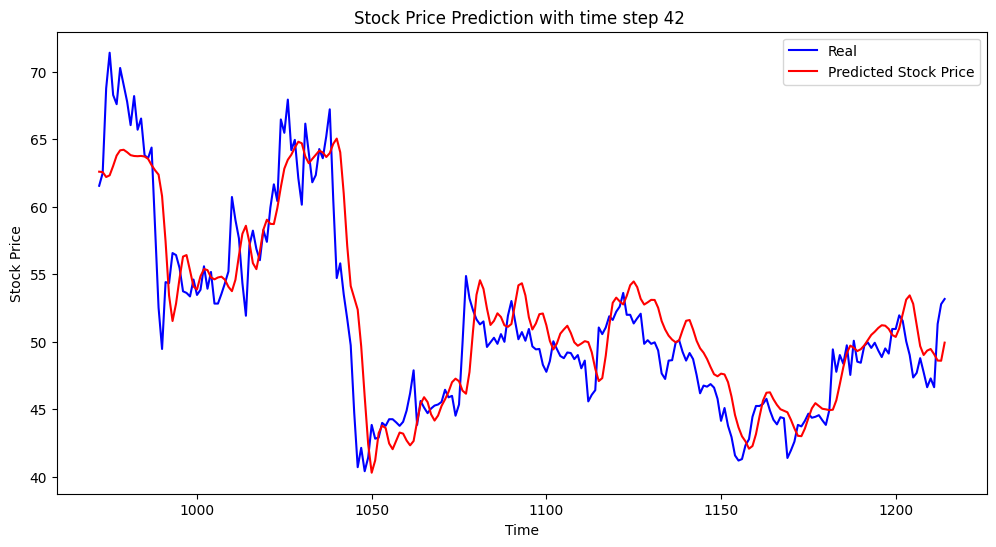

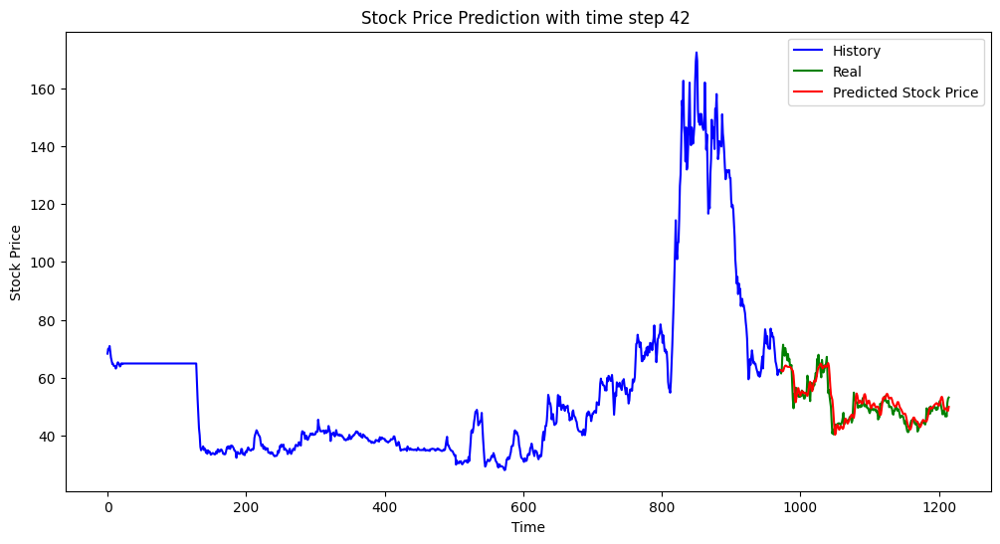

The MSE is 9.503250682573652
The MAE is 2.2838155217425813
mse is:  9.503250682573652
mae is:  2.2838155217425813
current column is:  593
Shape of X:  (930, 42, 1)
Shape of y:  (930,)
Epoch 1/300
22/22 [==============================] - 4s 62ms/step - loss: 3035.2249 - mean_absolute_error: 54.4744 - val_loss: 1860.5037 - val_mean_absolute_error: 42.7124
Epoch 2/300
22/22 [==============================] - 1s 40ms/step - loss: 326.2780 - mean_absolute_error: 14.8473 - val_loss: 135.9906 - val_mean_absolute_error: 10.0024
Epoch 3/300
22/22 [==============================] - 1s 40ms/step - loss: 308.7031 - mean_absolute_error: 15.4738 - val_loss: 86.5005 - val_mean_absolute_error: 7.5900
Epoch 4/300
22/22 [==============================] - 1s 40ms/step - loss: 342.6277 - mean_absolute_error: 16.1874 - val_loss: 145.5757 - val_mean_absolute_error: 10.4953
Epoch 5/300
22/22 [==============================] - 1s 33ms/step - loss: 298.6400 - mean_absolute_error: 14.8055 - val_loss: 136.8796 -

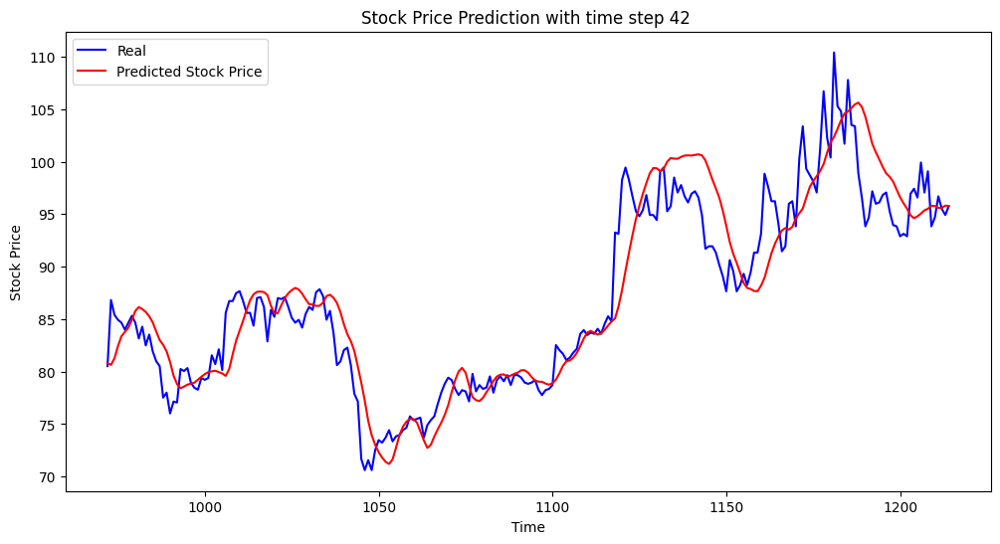

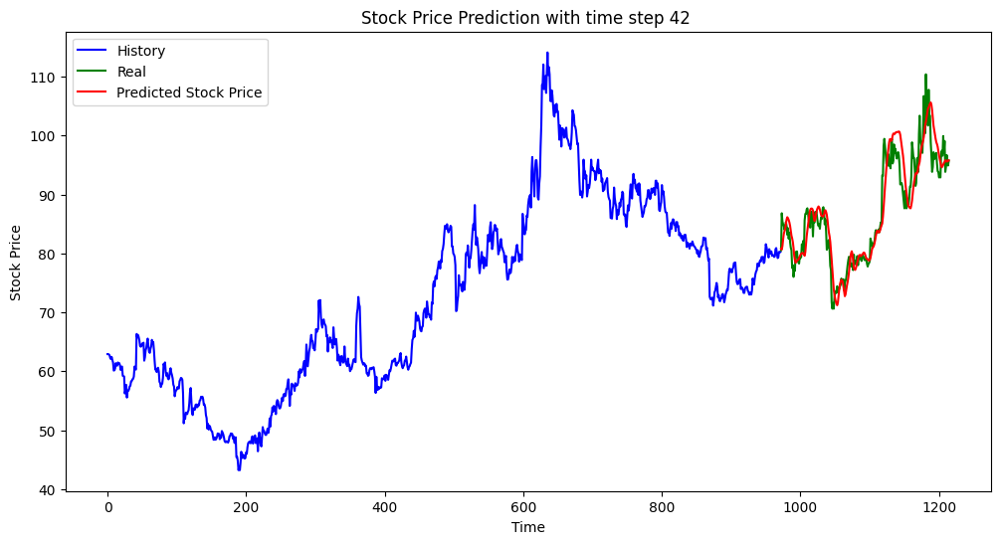

The MSE is 11.405974008224227
The MAE is 2.498426887920364
mse is:  11.405974008224227
mae is:  2.498426887920364
current column is:  115
Shape of X:  (930, 42, 1)
Shape of y:  (930,)
Epoch 1/300
22/22 [==============================] - 7s 65ms/step - loss: 517.3952 - mean_absolute_error: 18.2433 - val_loss: 12.6974 - val_mean_absolute_error: 2.6404
Epoch 2/300
22/22 [==============================] - 1s 38ms/step - loss: 85.2466 - mean_absolute_error: 8.1111 - val_loss: 11.8916 - val_mean_absolute_error: 2.7803
Epoch 3/300
22/22 [==============================] - 1s 39ms/step - loss: 141.7562 - mean_absolute_error: 6.7413 - val_loss: 14.8361 - val_mean_absolute_error: 2.7376
Epoch 4/300
22/22 [==============================] - 1s 42ms/step - loss: 50.1013 - mean_absolute_error: 5.5848 - val_loss: 10.8806 - val_mean_absolute_error: 2.4886
Epoch 5/300
22/22 [==============================] - 1s 42ms/step - loss: 40.1154 - mean_absolute_error: 5.1859 - val_loss: 10.6978 - val_mean_absolu

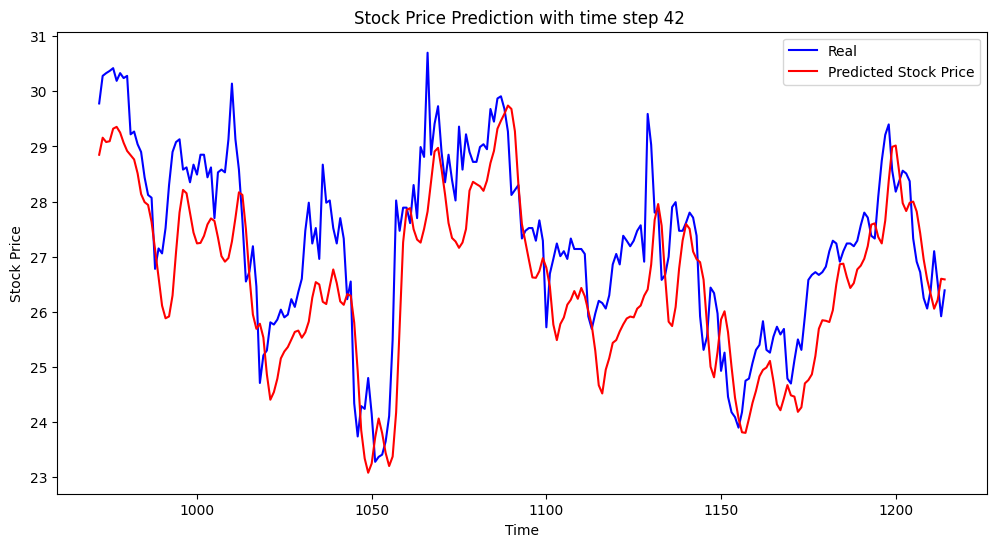

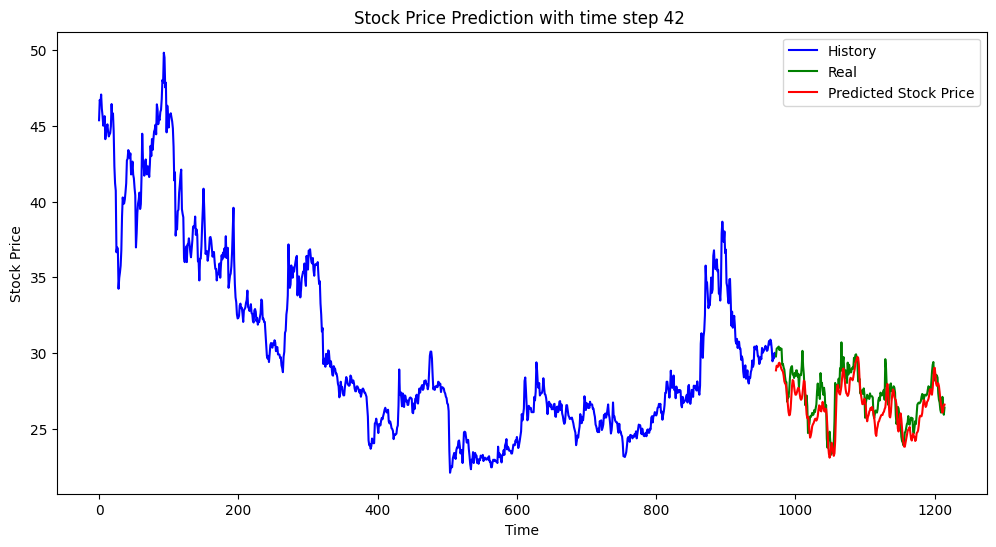

The MSE is 1.2415171850733215
The MAE is 0.9291901517012481
mse is:  1.2415171850733215
mae is:  0.9291901517012481
current column is:  4072
Shape of X:  (930, 42, 1)
Shape of y:  (930,)
Epoch 1/300
22/22 [==============================] - 4s 85ms/step - loss: 1195.9052 - mean_absolute_error: 33.6768 - val_loss: 980.9216 - val_mean_absolute_error: 30.1491
Epoch 2/300
22/22 [==============================] - 1s 62ms/step - loss: 98.2066 - mean_absolute_error: 6.8778 - val_loss: 132.9595 - val_mean_absolute_error: 8.8790
Epoch 3/300
22/22 [==============================] - 1s 66ms/step - loss: 260.3985 - mean_absolute_error: 13.5053 - val_loss: 253.7548 - val_mean_absolute_error: 13.5391
Epoch 4/300
22/22 [==============================] - 1s 39ms/step - loss: 182.7253 - mean_absolute_error: 10.6766 - val_loss: 230.6948 - val_mean_absolute_error: 12.7058
Epoch 5/300
22/22 [==============================] - 1s 41ms/step - loss: 173.7589 - mean_absolute_error: 10.4646 - val_loss: 164.7866 

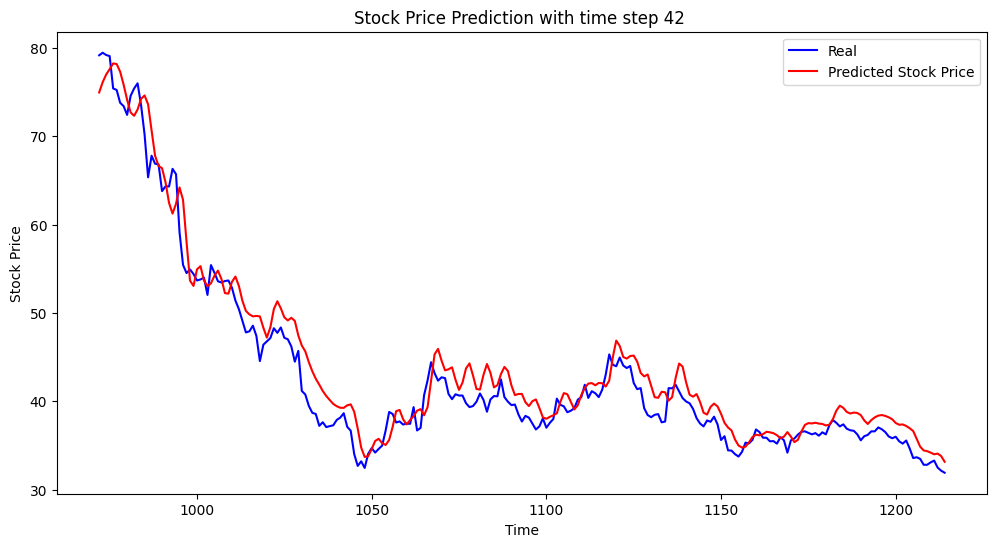

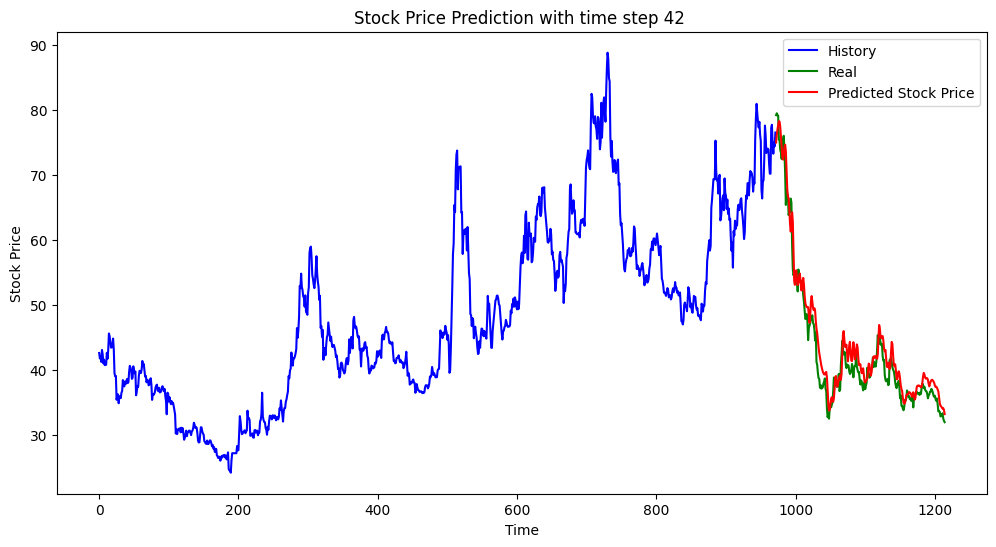

The MSE is 5.57042793783963
The MAE is 1.945909183957449
mse is:  5.57042793783963
mae is:  1.945909183957449
current column is:  1282
Shape of X:  (930, 42, 1)
Shape of y:  (930,)
Epoch 1/300
22/22 [==============================] - 4s 61ms/step - loss: 10676.8613 - mean_absolute_error: 84.8996 - val_loss: 40699.3125 - val_mean_absolute_error: 198.5236
Epoch 2/300
22/22 [==============================] - 1s 42ms/step - loss: 6482.1450 - mean_absolute_error: 54.5001 - val_loss: 29509.0918 - val_mean_absolute_error: 168.0111
Epoch 3/300
22/22 [==============================] - 1s 49ms/step - loss: 4623.6372 - mean_absolute_error: 42.7626 - val_loss: 23091.1797 - val_mean_absolute_error: 147.6852
Epoch 4/300
22/22 [==============================] - 1s 63ms/step - loss: 4466.5210 - mean_absolute_error: 50.4113 - val_loss: 20360.9766 - val_mean_absolute_error: 138.1347
Epoch 5/300
22/22 [==============================] - 1s 64ms/step - loss: 4555.0293 - mean_absolute_error: 53.8870 - val_l

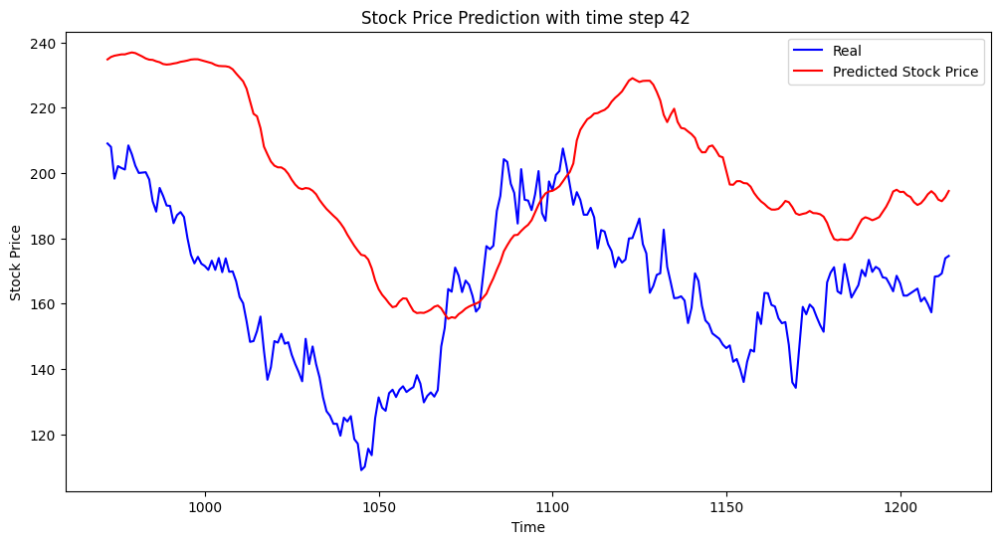

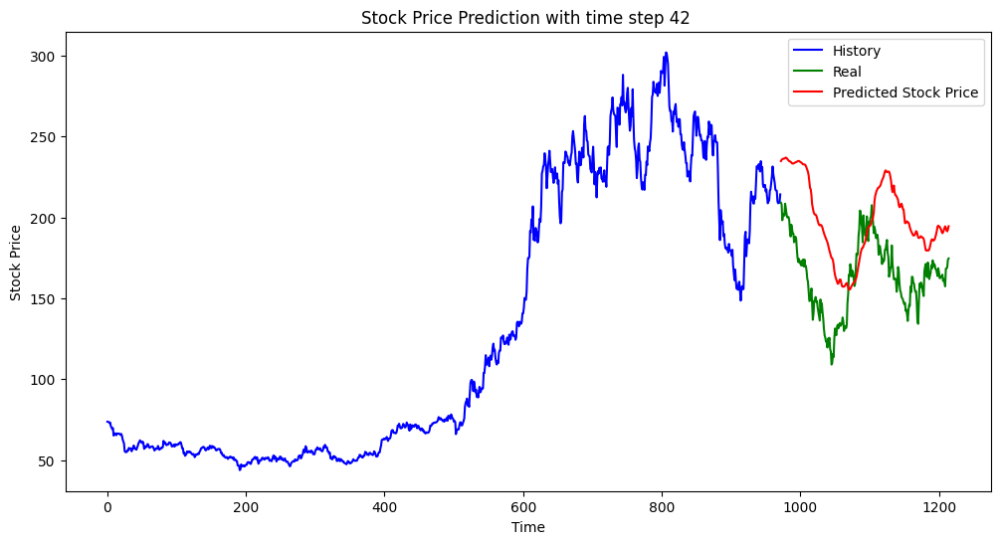

The MSE is 1727.8398244700277
The MAE is 36.94466796372653
mse is:  1727.8398244700277
mae is:  36.94466796372653
current column is:  1154
Shape of X:  (930, 42, 1)
Shape of y:  (930,)
Epoch 1/300
22/22 [==============================] - 5s 91ms/step - loss: 390.0331 - mean_absolute_error: 17.3323 - val_loss: 18.9602 - val_mean_absolute_error: 4.0677
Epoch 2/300
22/22 [==============================] - 1s 62ms/step - loss: 66.9635 - mean_absolute_error: 7.2770 - val_loss: 4.0215 - val_mean_absolute_error: 1.7393
Epoch 3/300
22/22 [==============================] - 1s 42ms/step - loss: 31.3995 - mean_absolute_error: 4.5385 - val_loss: 10.0055 - val_mean_absolute_error: 2.8353
Epoch 4/300
22/22 [==============================] - 1s 43ms/step - loss: 38.6808 - mean_absolute_error: 5.1714 - val_loss: 13.7971 - val_mean_absolute_error: 3.4008
Epoch 5/300
22/22 [==============================] - 1s 40ms/step - loss: 35.5581 - mean_absolute_error: 5.0474 - val_loss: 4.8719 - val_mean_absolute

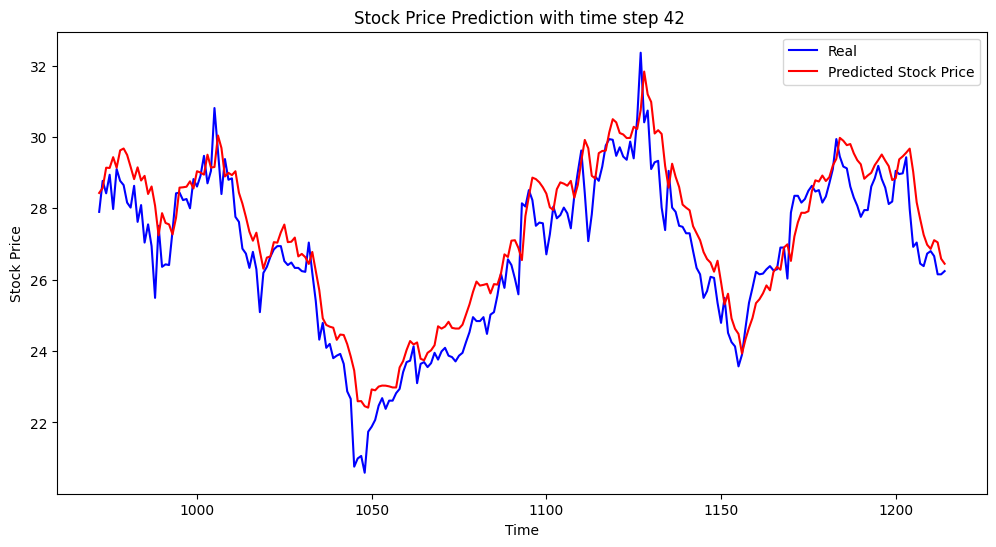

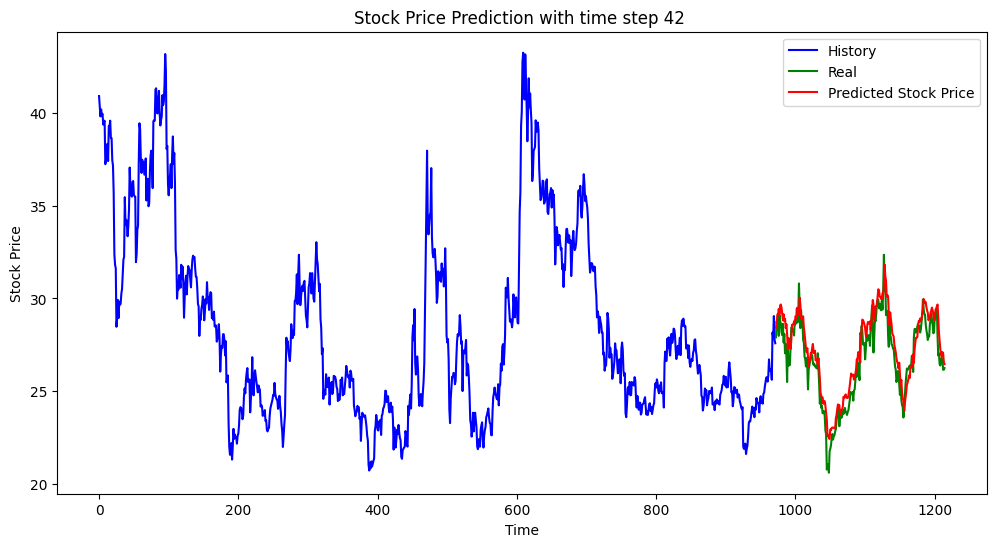

The MSE is 0.8041759020341533
The MAE is 0.7380745549457065
mse is:  0.8041759020341533
mae is:  0.7380745549457065
current column is:  1064
Shape of X:  (930, 42, 1)
Shape of y:  (930,)
Epoch 1/300
22/22 [==============================] - 5s 88ms/step - loss: 77.1509 - mean_absolute_error: 7.3061 - val_loss: 48.2831 - val_mean_absolute_error: 6.9186
Epoch 2/300
22/22 [==============================] - 1s 64ms/step - loss: 7.5778 - mean_absolute_error: 2.1405 - val_loss: 22.9384 - val_mean_absolute_error: 4.7430
Epoch 3/300
22/22 [==============================] - 2s 69ms/step - loss: 5.1762 - mean_absolute_error: 1.7490 - val_loss: 14.5018 - val_mean_absolute_error: 3.7541
Epoch 4/300
22/22 [==============================] - 2s 83ms/step - loss: 4.5882 - mean_absolute_error: 1.6655 - val_loss: 11.3799 - val_mean_absolute_error: 3.3258
Epoch 5/300
22/22 [==============================] - 2s 88ms/step - loss: 4.5729 - mean_absolute_error: 1.6410 - val_loss: 8.8480 - val_mean_absolute_er

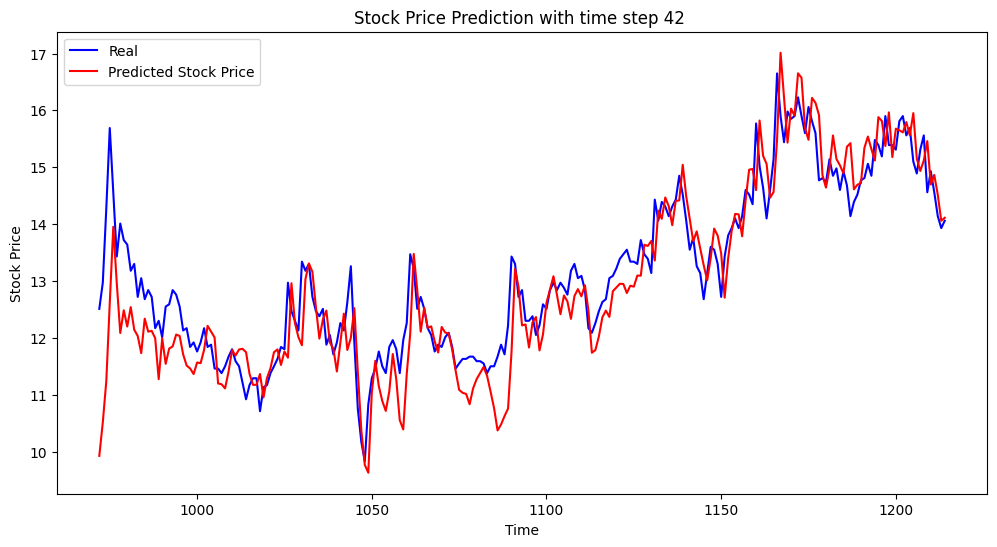

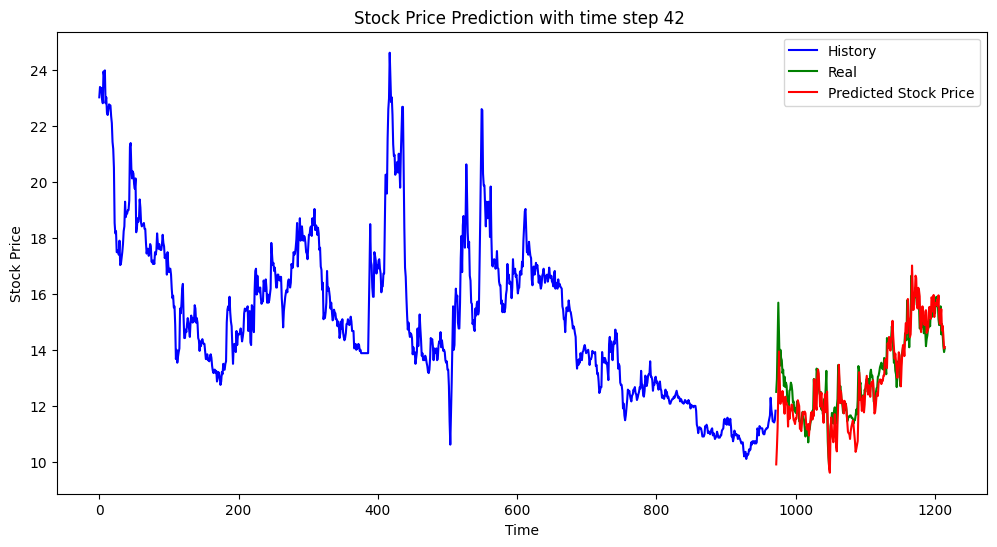

The MSE is 0.4691691881938816
The MAE is 0.4967996840614351
mse is:  0.4691691881938816
mae is:  0.4967996840614351
current column is:  711
Shape of X:  (930, 42, 1)
Shape of y:  (930,)
Epoch 1/300
22/22 [==============================] - 4s 61ms/step - loss: 93.6424 - mean_absolute_error: 7.8110 - val_loss: 59.9719 - val_mean_absolute_error: 5.9595
Epoch 2/300
22/22 [==============================] - 1s 44ms/step - loss: 11.2455 - mean_absolute_error: 2.6069 - val_loss: 115.2422 - val_mean_absolute_error: 8.0815
Epoch 3/300
22/22 [==============================] - 1s 46ms/step - loss: 7.6295 - mean_absolute_error: 2.0351 - val_loss: 120.1614 - val_mean_absolute_error: 8.4302
Epoch 4/300
22/22 [==============================] - 1s 45ms/step - loss: 5.1662 - mean_absolute_error: 1.5610 - val_loss: 92.8497 - val_mean_absolute_error: 6.9173
Epoch 5/300
22/22 [==============================] - 2s 71ms/step - loss: 6.5177 - mean_absolute_error: 1.7381 - val_loss: 112.6230 - val_mean_absolut

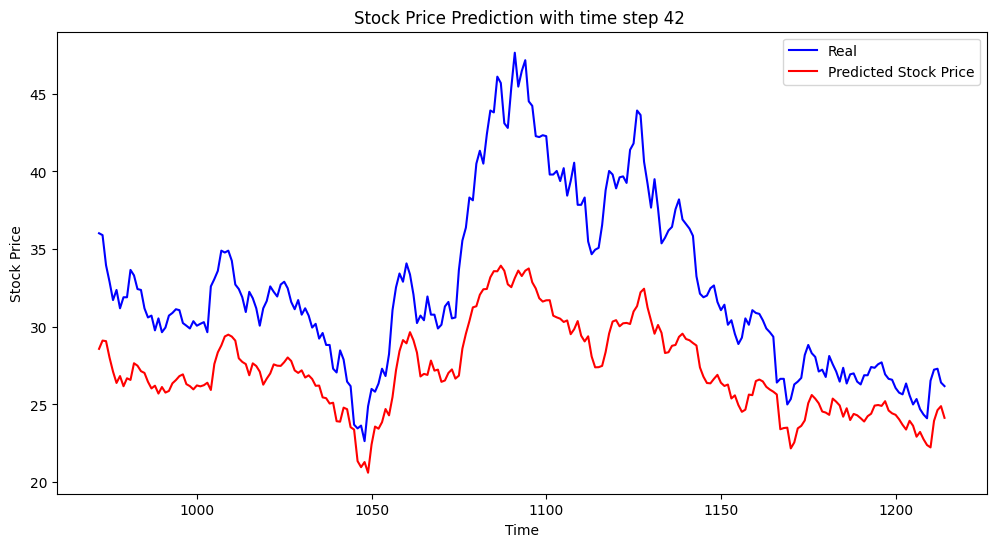

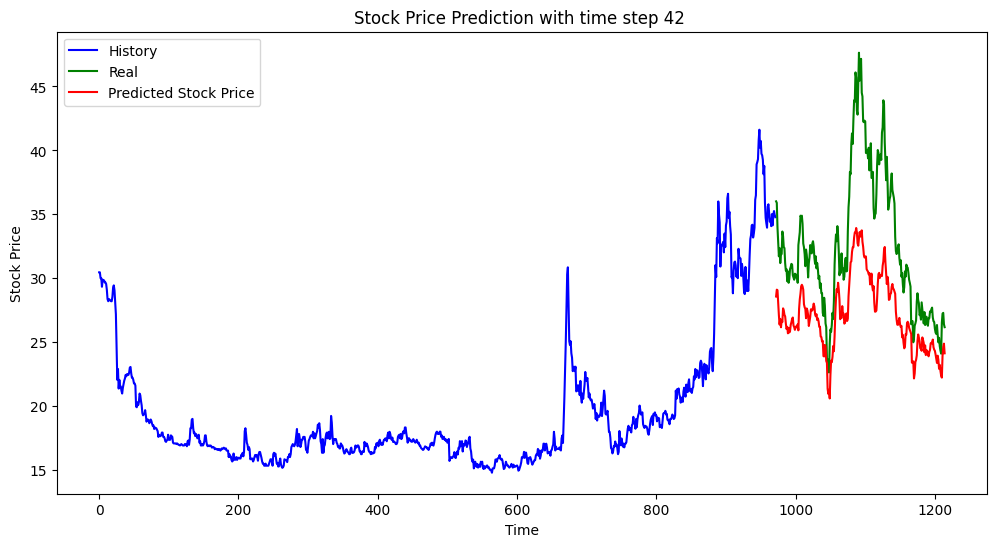

The MSE is 36.53705251284922
The MAE is 5.301385374343933
mse is:  36.53705251284922
mae is:  5.301385374343933
current column is:  4040
Shape of X:  (930, 42, 1)
Shape of y:  (930,)
Epoch 1/300
22/22 [==============================] - 5s 67ms/step - loss: 99.8555 - mean_absolute_error: 7.6732 - val_loss: 53.9292 - val_mean_absolute_error: 7.1179
Epoch 2/300
22/22 [==============================] - 1s 45ms/step - loss: 19.4008 - mean_absolute_error: 3.5448 - val_loss: 9.7916 - val_mean_absolute_error: 2.8163
Epoch 3/300
22/22 [==============================] - 1s 47ms/step - loss: 17.9016 - mean_absolute_error: 3.3646 - val_loss: 4.9912 - val_mean_absolute_error: 1.8960
Epoch 4/300
22/22 [==============================] - 1s 48ms/step - loss: 12.9521 - mean_absolute_error: 2.8348 - val_loss: 6.6761 - val_mean_absolute_error: 2.2622
Epoch 5/300
22/22 [==============================] - 1s 46ms/step - loss: 13.0475 - mean_absolute_error: 2.8230 - val_loss: 6.4212 - val_mean_absolute_error

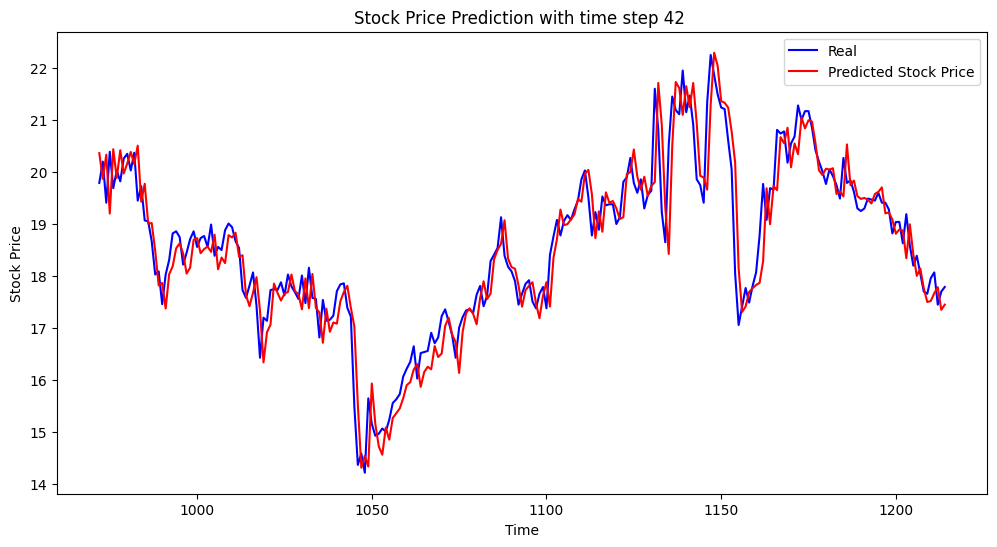

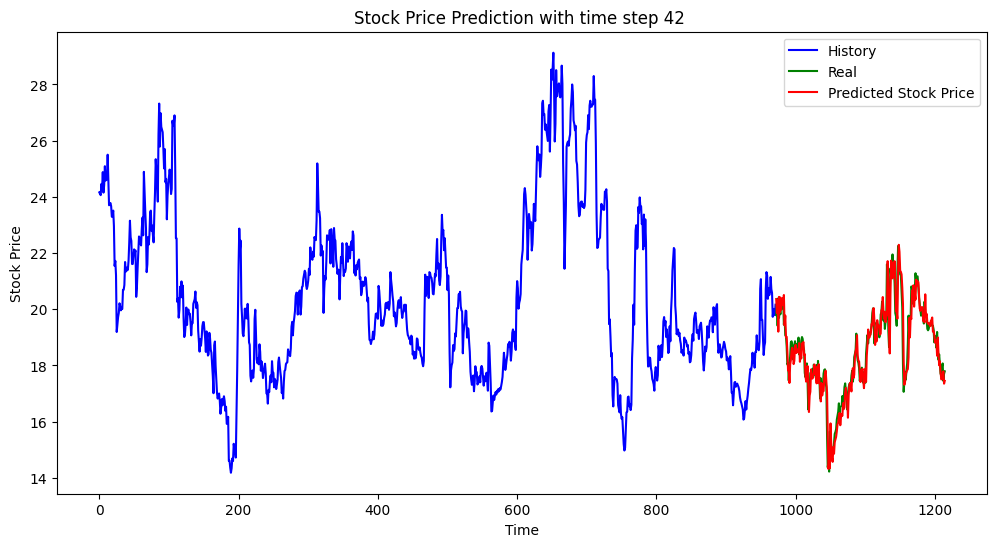

The MSE is 0.2973877796918054
The MAE is 0.40587226804882426
mse is:  0.2973877796918054
mae is:  0.40587226804882426
current column is:  484
Shape of X:  (930, 42, 1)
Shape of y:  (930,)
Epoch 1/300
22/22 [==============================] - 5s 72ms/step - loss: 76.5404 - mean_absolute_error: 6.9549 - val_loss: 31.1796 - val_mean_absolute_error: 5.3321
Epoch 2/300
22/22 [==============================] - 1s 48ms/step - loss: 18.8677 - mean_absolute_error: 3.7653 - val_loss: 5.1765 - val_mean_absolute_error: 1.9317
Epoch 3/300
22/22 [==============================] - 1s 50ms/step - loss: 13.2137 - mean_absolute_error: 2.9249 - val_loss: 2.8278 - val_mean_absolute_error: 1.4528
Epoch 4/300
22/22 [==============================] - 1s 49ms/step - loss: 9.5662 - mean_absolute_error: 2.5121 - val_loss: 3.0845 - val_mean_absolute_error: 1.5185
Epoch 5/300
22/22 [==============================] - 1s 53ms/step - loss: 9.4865 - mean_absolute_error: 2.4970 - val_loss: 3.1493 - val_mean_absolute_er

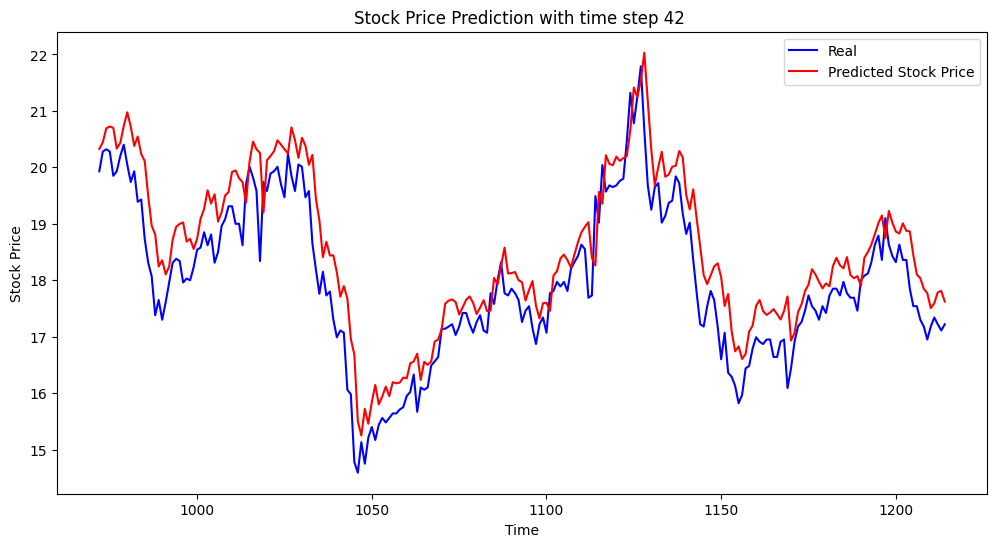

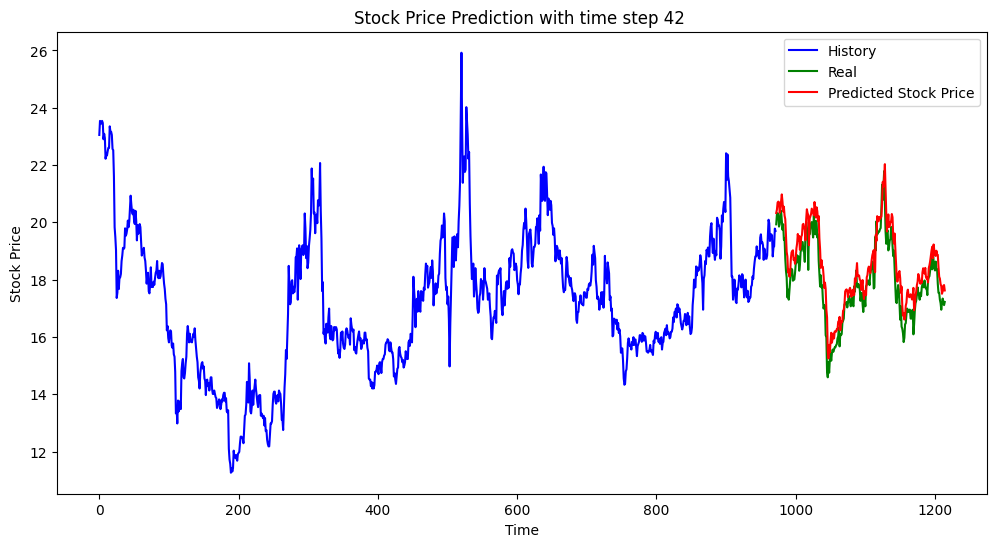

The MSE is 0.47368100444252675
The MAE is 0.5817740882276999
mse is:  0.47368100444252675
mae is:  0.5817740882276999


In [64]:
error_df4=pd.DataFrame(columns=['mse','mae'])
for col in random_col:
    print('current column is: ',col)
    mse,mae=RNN_mse(data[col])
    print('mse is: ',mse)
    print('mae is: ',mae)
    error_df4.loc[col]=[mse,mae]

In [66]:
error_df4

,mse,mae
3537,9.503251,2.283816
593,11.405974,2.498427
115,1.241517,0.929190
4072,5.570428,1.945909
1282,1727.839824,36.944668
1154,0.804176,0.738075
1064,0.469169,0.496800
711,36.537053,5.301385
4040,0.297388,0.405872
484,0.473681,0.581774


(5) GRU

current column is:  3537
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 9s 121ms/step - loss: 1672.7446 - mean_absolute_error: 39.5410 - val_loss: 6710.0625 - val_mean_absolute_error: 74.7543
Epoch 2/100
22/22 [==============================] - 2s 73ms/step - loss: 352.6836 - mean_absolute_error: 13.8095 - val_loss: 3668.6970 - val_mean_absolute_error: 49.8355
Epoch 3/100
22/22 [==============================] - 2s 75ms/step - loss: 110.2344 - mean_absolute_error: 8.3786 - val_loss: 3895.3699 - val_mean_absolute_error: 52.1323
Epoch 4/100
22/22 [==============================] - 2s 74ms/step - loss: 134.5558 - mean_absolute_error: 9.9263 - val_loss: 3862.3098 - val_mean_absolute_error: 51.8936
Epoch 5/100
22/22 [==============================] - 2s 73ms/step - loss: 126.0406 - mean_absolute_error: 9.2898 - val_loss: 3755.6614 - val_mean_absolute_error: 50.9458
Epoch 6/100
22/22 [==============================] - 2s 111ms/step - loss: 

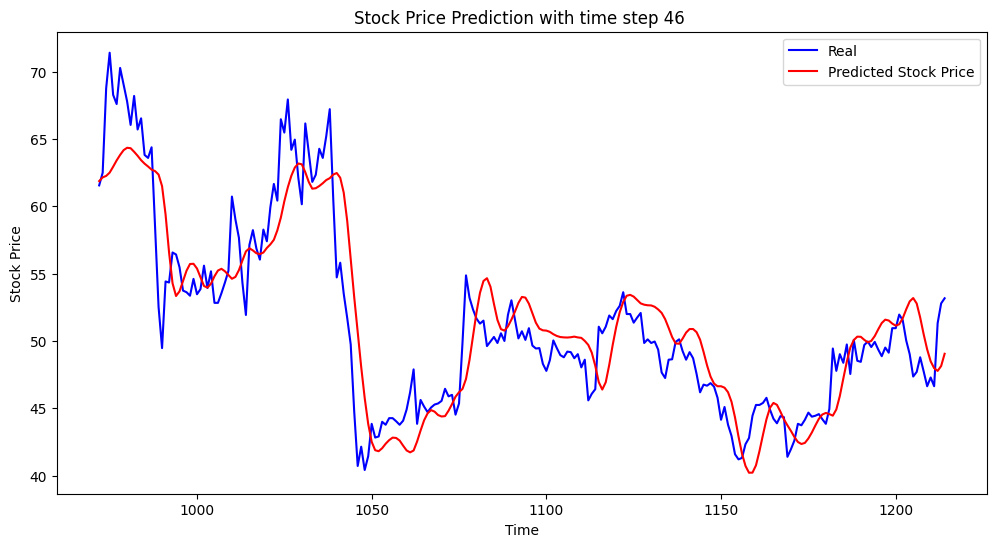

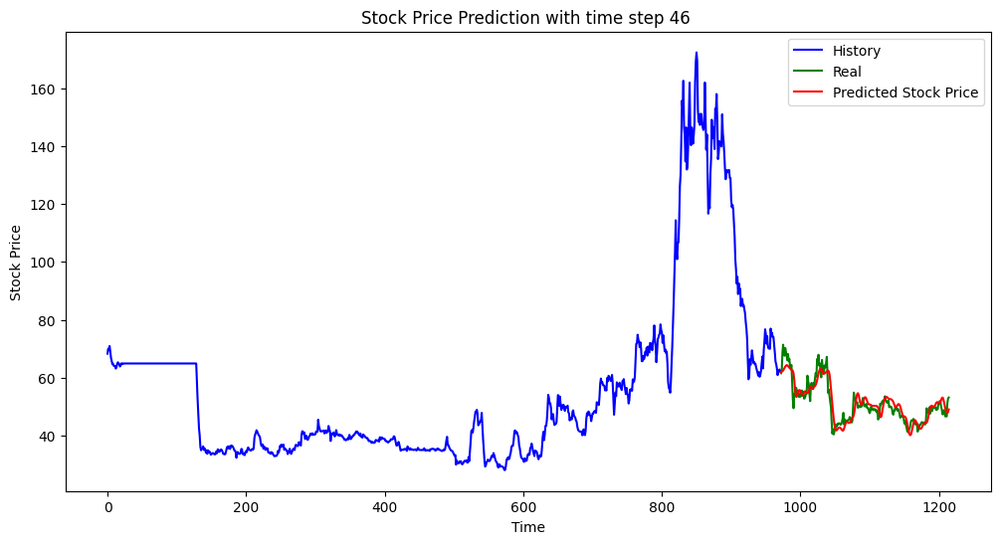

The MSE is 9.806517813230819
The MAE is 2.404016287218887
mse is:  9.806517813230819
mae is:  2.404016287218887
current column is:  593
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 8s 123ms/step - loss: 3935.8948 - mean_absolute_error: 62.0240 - val_loss: 2230.3794 - val_mean_absolute_error: 46.9736
Epoch 2/100
22/22 [==============================] - 2s 75ms/step - loss: 199.4462 - mean_absolute_error: 10.7083 - val_loss: 40.2125 - val_mean_absolute_error: 5.4408
Epoch 3/100
22/22 [==============================] - 2s 74ms/step - loss: 516.0612 - mean_absolute_error: 20.3337 - val_loss: 147.7895 - val_mean_absolute_error: 10.6316
Epoch 4/100
22/22 [==============================] - 3s 121ms/step - loss: 311.5338 - mean_absolute_error: 14.9996 - val_loss: 132.5721 - val_mean_absolute_error: 9.9210
Epoch 5/100
22/22 [==============================] - 2s 97ms/step - loss: 304.9938 - mean_absolute_error: 15.1010 - val_loss: 106.5344 - 

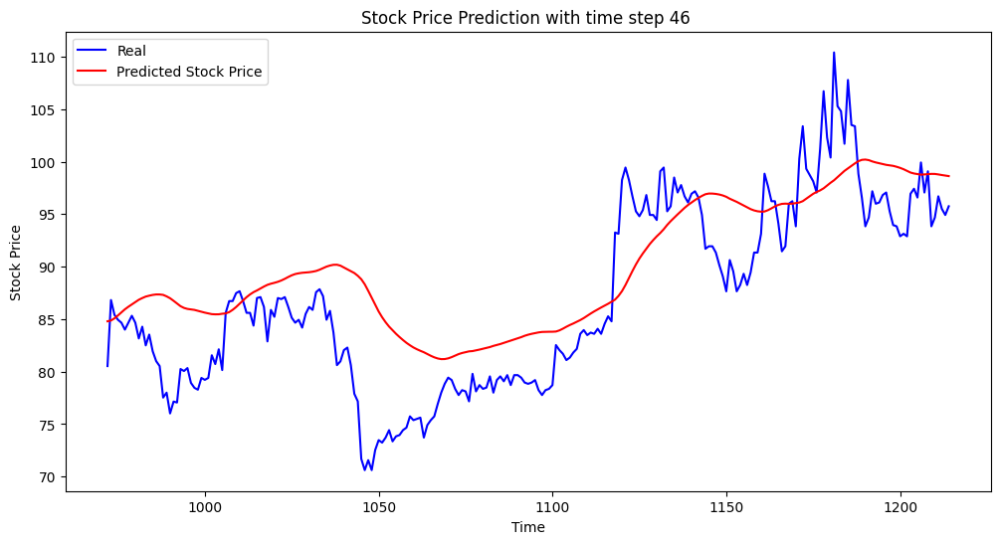

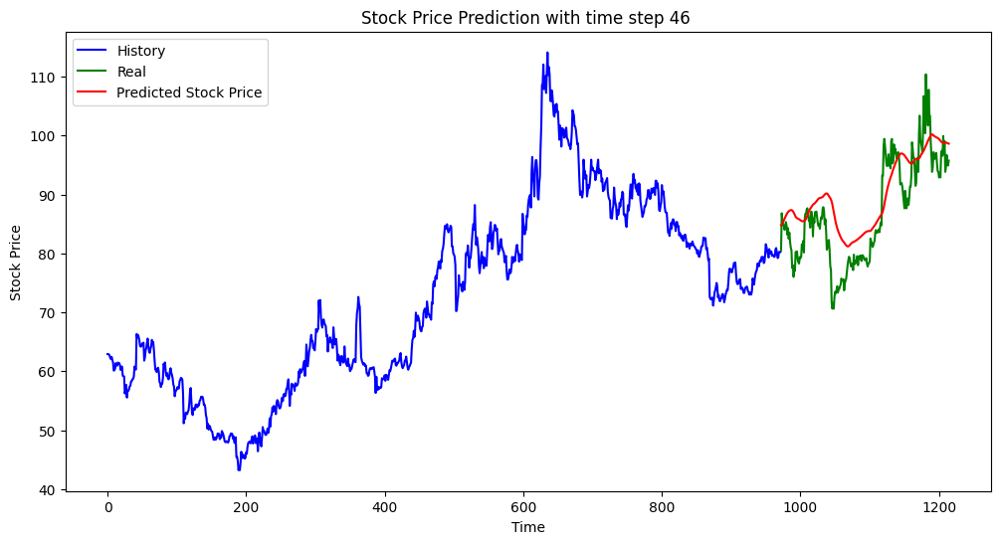

The MSE is 31.807645748838894
The MAE is 4.609350962697724
mse is:  31.807645748838894
mae is:  4.609350962697724
current column is:  115
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 8s 126ms/step - loss: 805.5187 - mean_absolute_error: 27.0494 - val_loss: 122.8408 - val_mean_absolute_error: 10.7565
Epoch 2/100
22/22 [==============================] - 2s 75ms/step - loss: 64.9000 - mean_absolute_error: 6.6770 - val_loss: 45.9723 - val_mean_absolute_error: 6.2392
Epoch 3/100
22/22 [==============================] - 3s 115ms/step - loss: 33.3270 - mean_absolute_error: 4.3775 - val_loss: 10.3747 - val_mean_absolute_error: 2.3238
Epoch 4/100
22/22 [==============================] - 2s 104ms/step - loss: 13.8896 - mean_absolute_error: 2.6796 - val_loss: 9.3928 - val_mean_absolute_error: 2.2426
Epoch 5/100
22/22 [==============================] - 2s 76ms/step - loss: 12.2312 - mean_absolute_error: 2.6496 - val_loss: 9.2988 - val_mean_abso

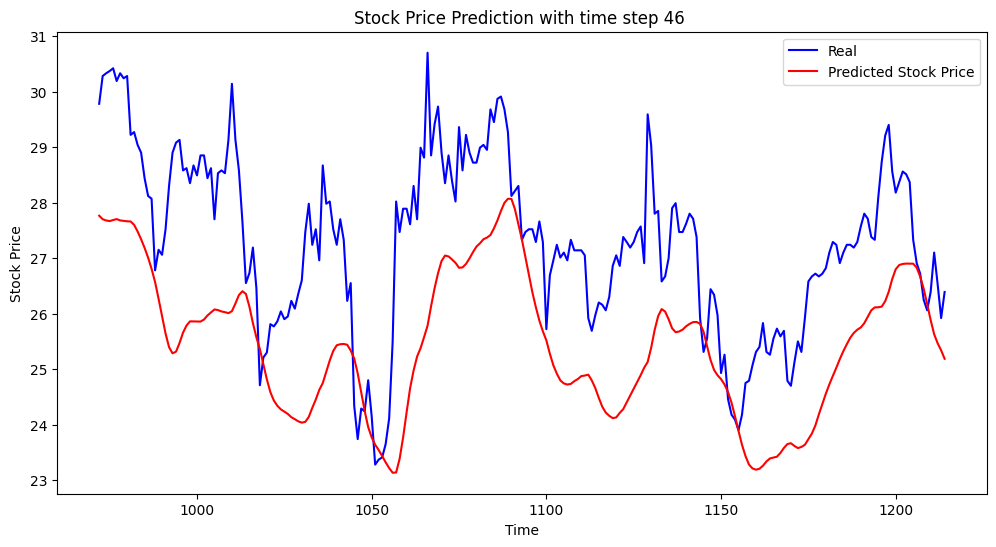

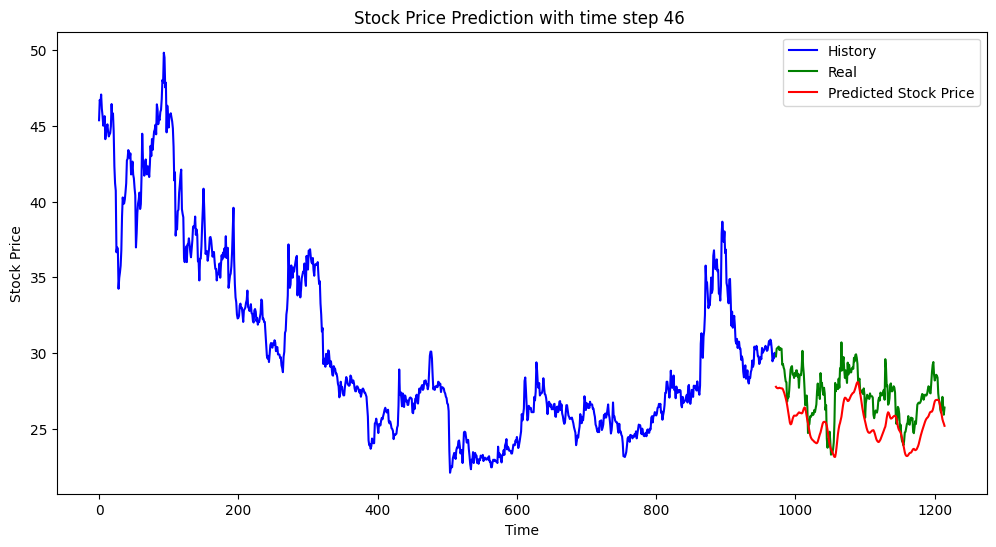

The MSE is 4.447455230563299
The MAE is 1.8579528726962367
mse is:  4.447455230563299
mae is:  1.8579528726962367
current column is:  4072
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 8s 130ms/step - loss: 1691.3912 - mean_absolute_error: 40.2126 - val_loss: 1202.1794 - val_mean_absolute_error: 33.7925
Epoch 2/100
22/22 [==============================] - 3s 121ms/step - loss: 116.9537 - mean_absolute_error: 8.9262 - val_loss: 88.8859 - val_mean_absolute_error: 7.3940
Epoch 3/100
22/22 [==============================] - 2s 107ms/step - loss: 223.3865 - mean_absolute_error: 12.1326 - val_loss: 176.8193 - val_mean_absolute_error: 10.6983
Epoch 4/100
22/22 [==============================] - 2s 80ms/step - loss: 150.3907 - mean_absolute_error: 10.0010 - val_loss: 119.2378 - val_mean_absolute_error: 8.0861
Epoch 5/100
22/22 [==============================] - 2s 83ms/step - loss: 127.9390 - mean_absolute_error: 9.0349 - val_loss: 80.0750 -

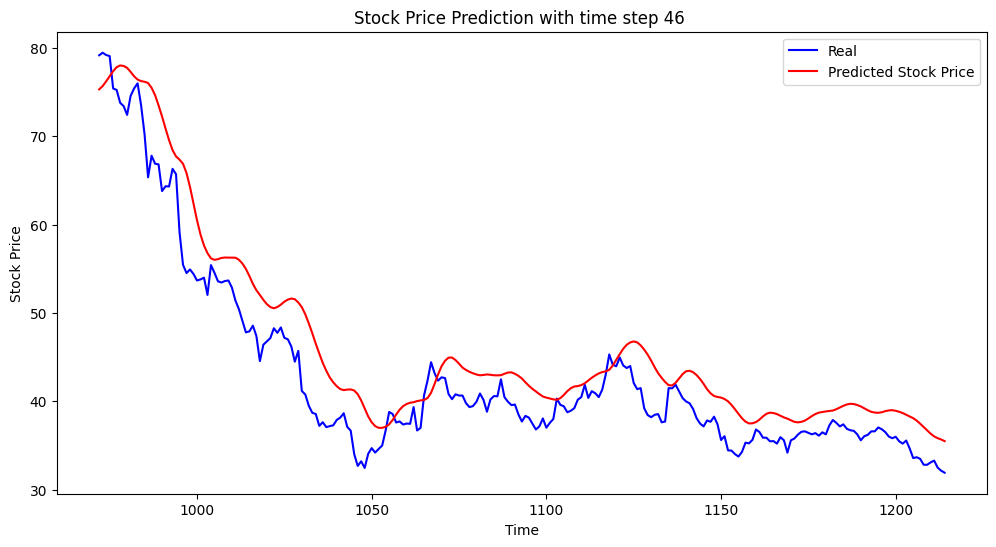

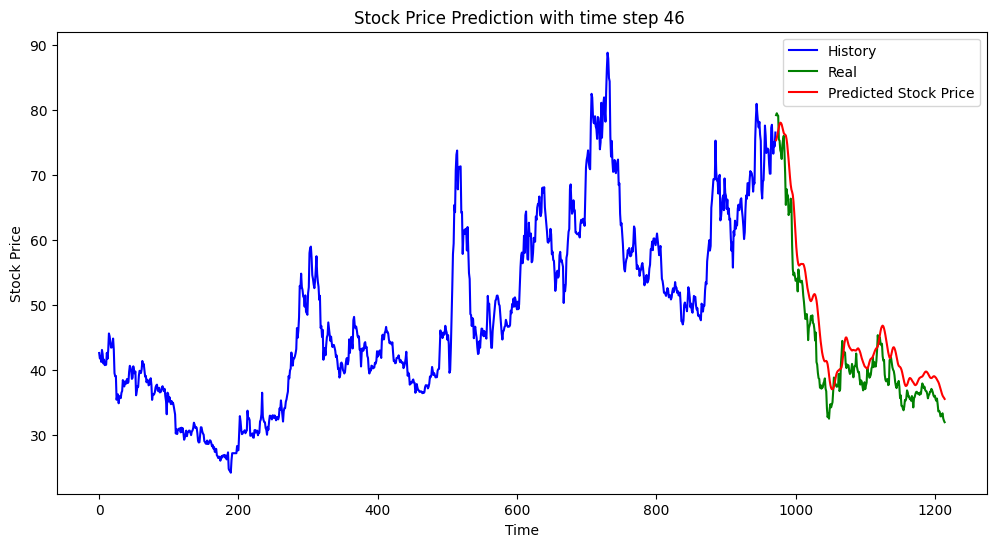

The MSE is 17.51618453315315
The MAE is 3.5834250976813666
mse is:  17.51618453315315
mae is:  3.5834250976813666
current column is:  1282
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 8s 126ms/step - loss: 12718.2061 - mean_absolute_error: 94.0618 - val_loss: 44743.3398 - val_mean_absolute_error: 208.5980
Epoch 2/100
22/22 [==============================] - 2s 87ms/step - loss: 5359.8345 - mean_absolute_error: 51.4426 - val_loss: 23045.0332 - val_mean_absolute_error: 147.5258
Epoch 3/100
22/22 [==============================] - 2s 103ms/step - loss: 4415.8706 - mean_absolute_error: 51.8510 - val_loss: 18811.1738 - val_mean_absolute_error: 132.3974
Epoch 4/100
22/22 [==============================] - 3s 116ms/step - loss: 4769.6777 - mean_absolute_error: 57.4050 - val_loss: 18329.2637 - val_mean_absolute_error: 130.5669
Epoch 5/100
22/22 [==============================] - 2s 87ms/step - loss: 4777.4360 - mean_absolute_error: 57.4162 

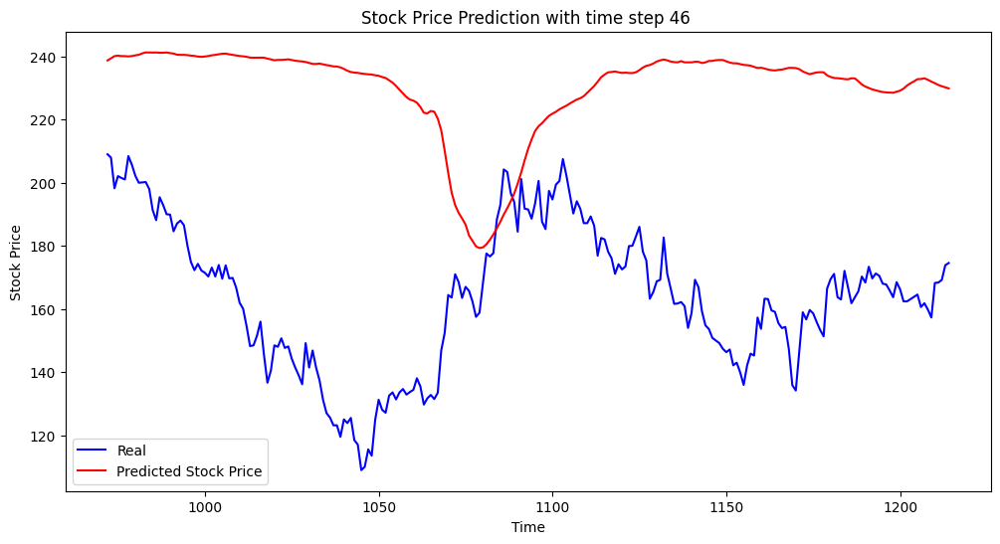

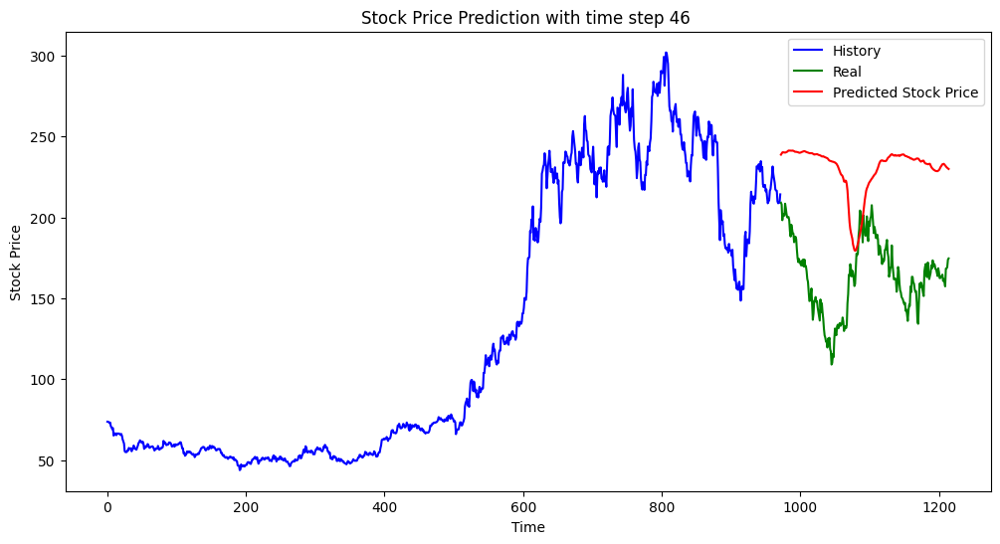

The MSE is 5246.739751309366
The MAE is 66.62503173576953
mse is:  5246.739751309366
mae is:  66.62503173576953
current column is:  1154
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 13s 144ms/step - loss: 572.0688 - mean_absolute_error: 22.4367 - val_loss: 4.8473 - val_mean_absolute_error: 1.7940
Epoch 2/100
22/22 [==============================] - 2s 82ms/step - loss: 54.5849 - mean_absolute_error: 6.1105 - val_loss: 5.7351 - val_mean_absolute_error: 1.8399
Epoch 3/100
22/22 [==============================] - 3s 125ms/step - loss: 19.3985 - mean_absolute_error: 3.4497 - val_loss: 7.0169 - val_mean_absolute_error: 2.2953
Epoch 4/100
22/22 [==============================] - 2s 109ms/step - loss: 18.7345 - mean_absolute_error: 3.3891 - val_loss: 9.1611 - val_mean_absolute_error: 2.6333
Epoch 5/100
22/22 [==============================] - 2s 81ms/step - loss: 20.2481 - mean_absolute_error: 3.5344 - val_loss: 7.5052 - val_mean_absolute_

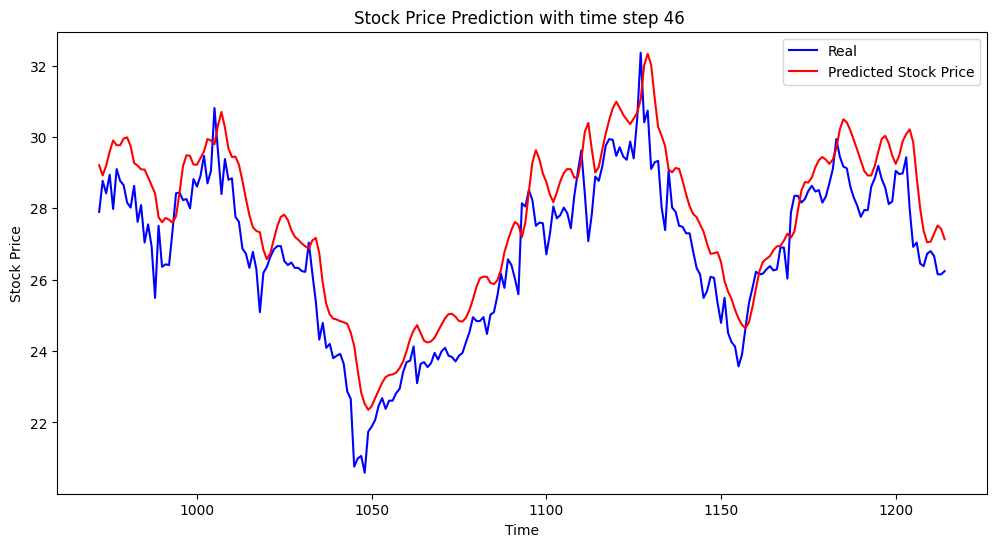

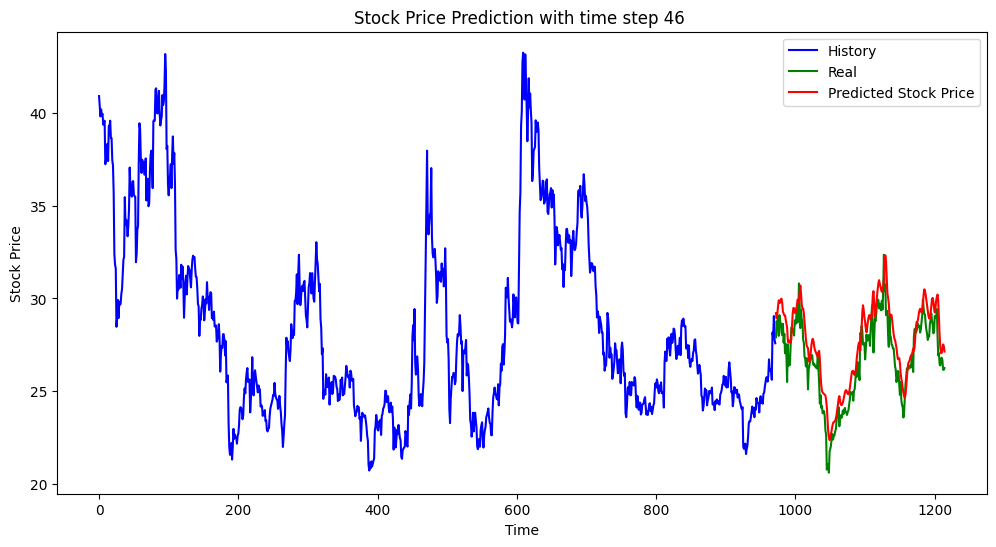

The MSE is 1.412648626798523
The MAE is 1.0099356342833719
mse is:  1.412648626798523
mae is:  1.0099356342833719
current column is:  1064
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 9s 130ms/step - loss: 156.8312 - mean_absolute_error: 11.4050 - val_loss: 6.3427 - val_mean_absolute_error: 2.2618
Epoch 2/100
22/22 [==============================] - 2s 82ms/step - loss: 12.8754 - mean_absolute_error: 2.6473 - val_loss: 1.0100 - val_mean_absolute_error: 0.8056
Epoch 3/100
22/22 [==============================] - 2s 83ms/step - loss: 4.2964 - mean_absolute_error: 1.5670 - val_loss: 1.0939 - val_mean_absolute_error: 0.8622
Epoch 4/100
22/22 [==============================] - 2s 83ms/step - loss: 4.4648 - mean_absolute_error: 1.6258 - val_loss: 0.7551 - val_mean_absolute_error: 0.6903
Epoch 5/100
22/22 [==============================] - 2s 94ms/step - loss: 4.8916 - mean_absolute_error: 1.7217 - val_loss: 0.6160 - val_mean_absolute_erro

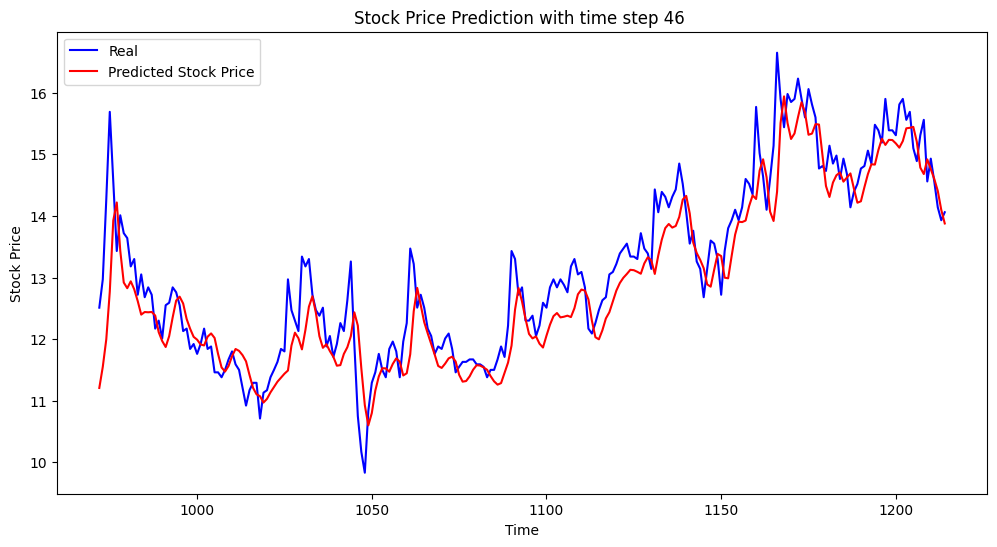

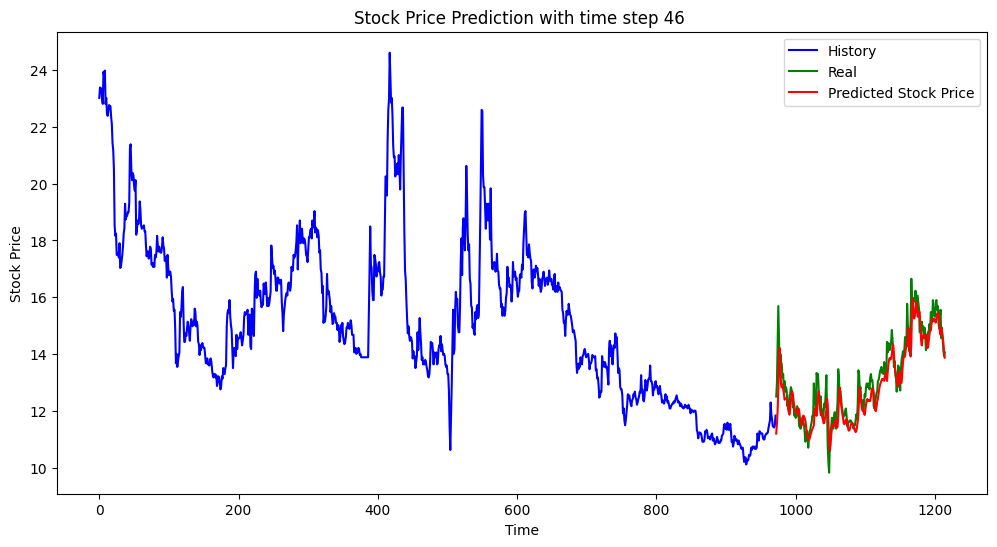

The MSE is 0.3504360639754939
The MAE is 0.43586402688987963
mse is:  0.3504360639754939
mae is:  0.43586402688987963
current column is:  711
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 11s 288ms/step - loss: 247.9395 - mean_absolute_error: 15.5664 - val_loss: 178.3870 - val_mean_absolute_error: 12.5063
Epoch 2/100
22/22 [==============================] - 3s 116ms/step - loss: 18.3490 - mean_absolute_error: 3.5925 - val_loss: 43.5994 - val_mean_absolute_error: 5.2436
Epoch 3/100
22/22 [==============================] - 2s 86ms/step - loss: 3.3392 - mean_absolute_error: 1.1772 - val_loss: 29.9427 - val_mean_absolute_error: 3.9604
Epoch 4/100
22/22 [==============================] - 2s 87ms/step - loss: 2.7744 - mean_absolute_error: 1.0148 - val_loss: 25.6457 - val_mean_absolute_error: 3.5038
Epoch 5/100
22/22 [==============================] - 2s 86ms/step - loss: 3.2181 - mean_absolute_error: 1.1891 - val_loss: 27.4099 - val_mean_a

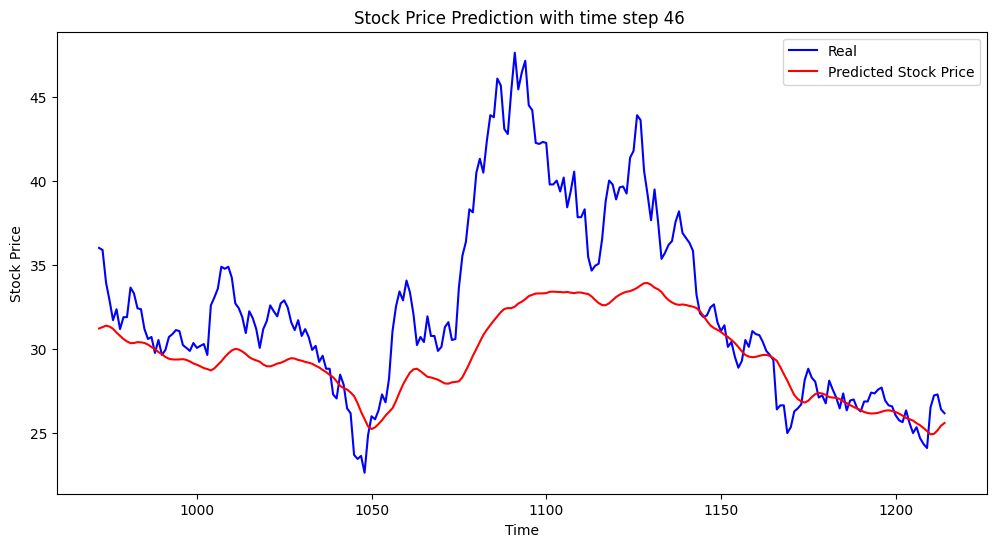

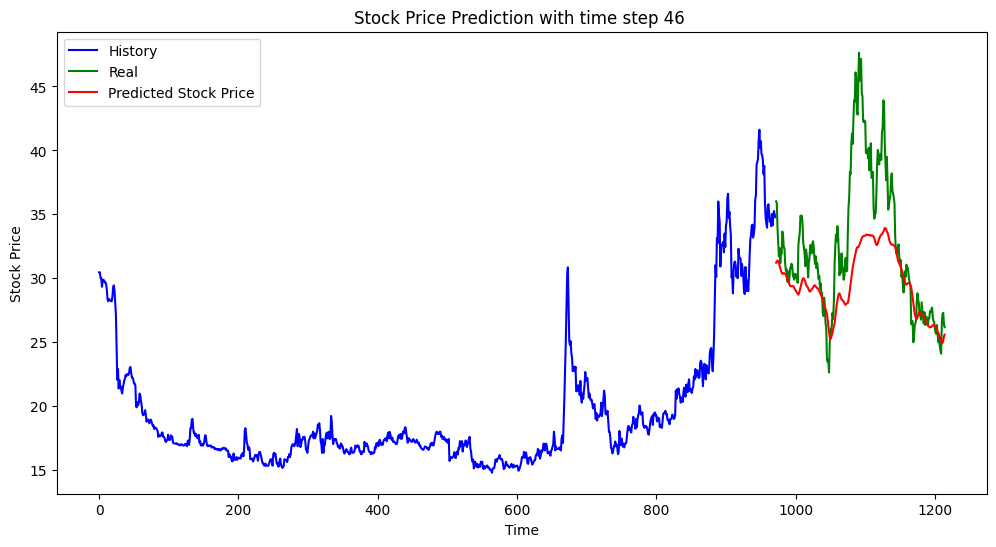

The MSE is 21.827887047757226
The MAE is 3.2333917726116415
mse is:  21.827887047757226
mae is:  3.2333917726116415
current column is:  4040
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 9s 169ms/step - loss: 275.4242 - mean_absolute_error: 15.6755 - val_loss: 12.9285 - val_mean_absolute_error: 2.8671
Epoch 2/100
22/22 [==============================] - 2s 87ms/step - loss: 17.7829 - mean_absolute_error: 3.2461 - val_loss: 7.6913 - val_mean_absolute_error: 2.0006
Epoch 3/100
22/22 [==============================] - 2s 85ms/step - loss: 6.6794 - mean_absolute_error: 2.0605 - val_loss: 7.4732 - val_mean_absolute_error: 2.0451
Epoch 4/100
22/22 [==============================] - 2s 86ms/step - loss: 6.1924 - mean_absolute_error: 1.9604 - val_loss: 8.1937 - val_mean_absolute_error: 2.2524
Epoch 5/100
22/22 [==============================] - 2s 86ms/step - loss: 6.1428 - mean_absolute_error: 1.9600 - val_loss: 9.3144 - val_mean_absolute_e

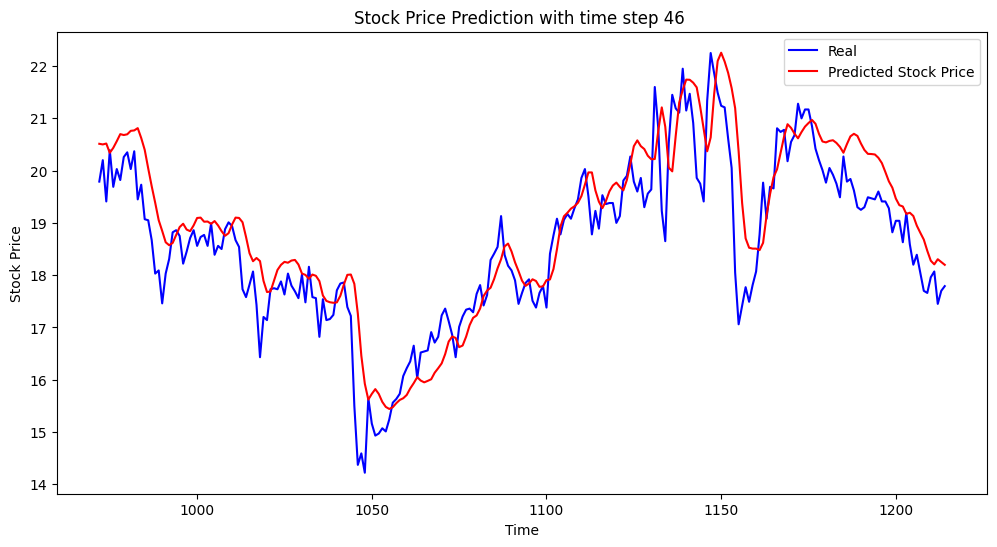

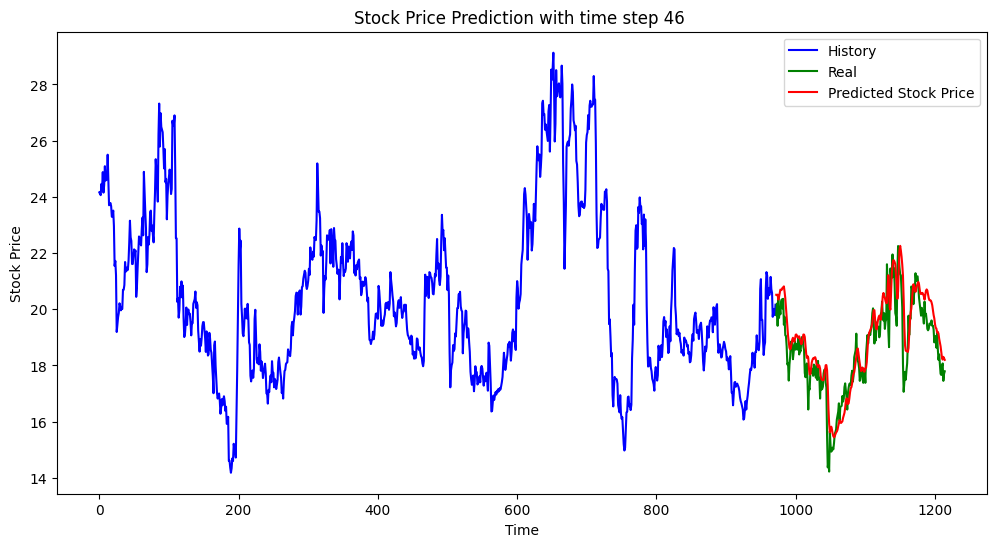

The MSE is 0.6412889638141517
The MAE is 0.6093561509999719
mse is:  0.6412889638141517
mae is:  0.6093561509999719
current column is:  484
Shape of X:  (926, 46, 1)
Shape of y:  (926,)
Epoch 1/100
22/22 [==============================] - 9s 158ms/step - loss: 182.5922 - mean_absolute_error: 12.7699 - val_loss: 5.8541 - val_mean_absolute_error: 1.9974
Epoch 2/100
22/22 [==============================] - 2s 85ms/step - loss: 11.0010 - mean_absolute_error: 2.6151 - val_loss: 1.8776 - val_mean_absolute_error: 1.1751
Epoch 3/100
22/22 [==============================] - 2s 87ms/step - loss: 4.2808 - mean_absolute_error: 1.5876 - val_loss: 2.1268 - val_mean_absolute_error: 1.2747
Epoch 4/100
22/22 [==============================] - 2s 82ms/step - loss: 5.0243 - mean_absolute_error: 1.6777 - val_loss: 1.7015 - val_mean_absolute_error: 1.0838
Epoch 5/100
22/22 [==============================] - 2s 86ms/step - loss: 5.0547 - mean_absolute_error: 1.6810 - val_loss: 1.5339 - val_mean_absolute_err

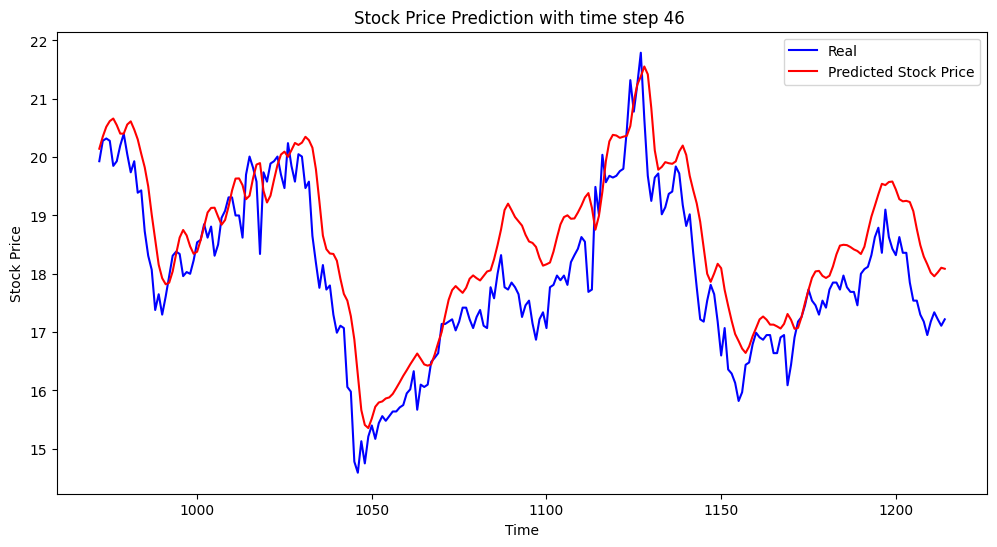

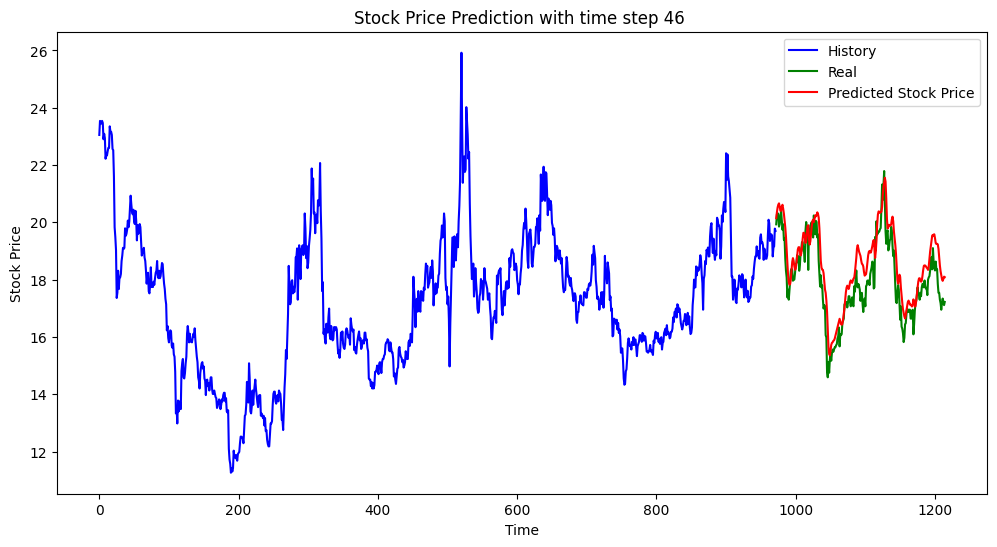

The MSE is 0.6040557430180056
The MAE is 0.6460603588402517
mse is:  0.6040557430180056
mae is:  0.6460603588402517


In [69]:
error_df5=pd.DataFrame(columns=['mse','mae'])
for col in random_col:
    print('current column is: ',col)
    mse,mae=GRU_mse(data[col])
    print('mse is: ',mse)
    print('mae is: ',mae)
    error_df5.loc[col]=[mse,mae]

In [70]:
error_df5

,mse,mae
3537,9.806518,2.404016
593,31.807646,4.609351
115,4.447455,1.857953
4072,17.516185,3.583425
1282,5246.739751,66.625032
1154,1.412649,1.009936
1064,0.350436,0.435864
711,21.827887,3.233392
4040,0.641289,0.609356
484,0.604056,0.646060


In [58]:
def set_total_error(df,input_df,idx_name):
  mse_avg=input_df['mse'].mean()
  mae_avg=input_df['mae'].mean()
  mse_std=input_df['mse'].std()
  mae_std=input_df['mae'].std()
  df.loc[idx_name]=[mse_avg,mae_avg,mse_std,mae_std]
  return df

error_total_df=pd.DataFrame(columns=['mse_avg','mae_avg','mse_std','mae_std'])
error_total_df=set_total_error(error_total_df,error_df.drop(index='1282'),'ARMA-Decompose')
error_total_df=set_total_error(error_total_df,error_df3.drop(index='1282'),'LSTM')
error_total_df=set_total_error(error_total_df,error_df4.drop(index='1282'),'RNN')
error_total_df=set_total_error(error_total_df,error_df5.drop(index='1282'),'GRU')
error_total_df


,mse_avg,mae_avg,mse_std,mae_std
ARMA-Decompose,0.544807,0.407694,0.900444,0.229645
LSTM,5.651962,1.575546,5.601933,0.980265


In [59]:
error_total_df.to_excel('./Single_feature_result.xlsx')

### 4.2.2 Multi Feature

In [34]:
#find data column which has no nan
data = pd.read_csv('./Chinese Stock Market/CL.csv',index_col=0)
data_col=[]
for col in data.columns:
    if data[col].isna().sum()==0:
        data_col.append(col)

#random choose 10 data column to predict
import random
random.seed(21)
random_col=random.sample(data_col,20)
instruments=pd.read_csv('./Chinese Stock Market/instruments.csv')
instru_list=[]
for i in random_col:
  instru_list.append(instruments.loc[int(i),'instrument'])
instru_list

['002239.SZ',
 '300406.SZ',
 '601117.SH',
 '600732.SH',
 '002735.SZ',
 '300670.SZ',
 '002453.SZ',
 '603718.SH',
 '300651.SZ',
 '603881.SH',
 '600108.SH',
 '002317.SZ',
 '600067.SH',
 '600182.SH',
 '002540.SZ',
 '603679.SH',
 '000017.SZ',
 '000099.SZ',
 '300206.SZ',
 '600491.SH']

(1) LSTM

In [22]:
Error_multi_lstm=pd.DataFrame(columns=['mse','mae'])

Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 2s 27ms/step - loss: 898.5840 - mean_absolute_error: 28.1504 - val_loss: 1079.3716 - val_mean_absolute_error: 32.7225
Epoch 2/800
23/23 [==============================] - 0s 7ms/step - loss: 427.0587 - mean_absolute_error: 18.0009 - val_loss: 223.9092 - val_mean_absolute_error: 14.6743
Epoch 3/800
23/23 [==============================] - 0s 7ms/step - loss: 128.8799 - mean_absolute_error: 9.9380 - val_loss: 57.5274 - val_mean_absolute_error: 6.9966
Epoch 4/800
23/23 [==============================] - 0s 6ms/step - loss: 124.1170 - mean_absolute_error: 9.8277 - val_loss: 45.4480 - val_mean_absolute_error: 6.0744
Epoch 5/800
23/23 [==============================] - 0s 6ms/step - loss: 123.2926 - mean_absolute_error: 9.7081 - val_loss: 50.2457 - val_mean_absolute_error: 6.4560
Epoch 6/800
23/23 [==============================] - 0s 6ms/step - loss: 124.0487 - mean_absolute_error: 9.7675 - va

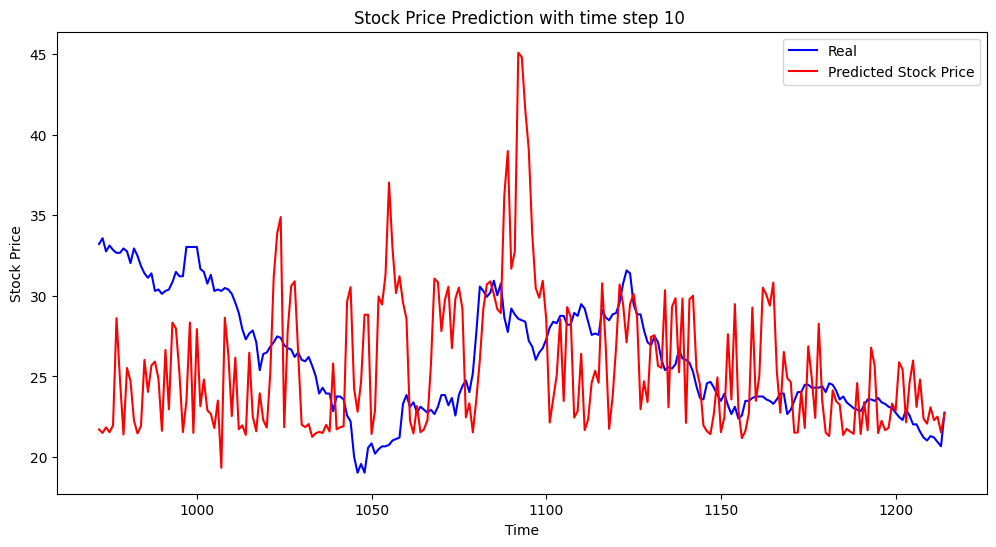

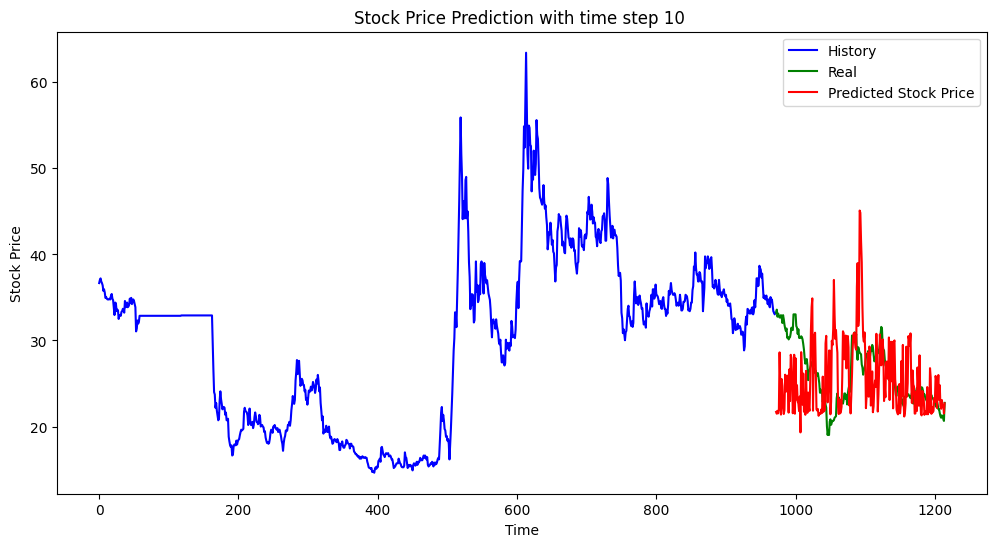

The MSE is 29.36809096554394
The MAE is 4.220673705116244
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 2s 22ms/step - loss: 4819.2007 - mean_absolute_error: 67.5411 - val_loss: 6133.7134 - val_mean_absolute_error: 77.7481
Epoch 2/800
23/23 [==============================] - 0s 6ms/step - loss: 3508.1433 - mean_absolute_error: 57.8725 - val_loss: 3553.6440 - val_mean_absolute_error: 58.8630
Epoch 3/800
23/23 [==============================] - 0s 6ms/step - loss: 1744.5292 - mean_absolute_error: 39.4427 - val_loss: 1972.0803 - val_mean_absolute_error: 43.3969
Epoch 4/800
23/23 [==============================] - 0s 6ms/step - loss: 877.4072 - mean_absolute_error: 25.8708 - val_loss: 1116.7975 - val_mean_absolute_error: 32.0632
Epoch 5/800
23/23 [==============================] - 0s 6ms/step - loss: 490.4810 - mean_absolute_error: 18.6267 - val_loss: 663.8131 - val_mean_absolute_error: 23.9812
Epoch 6/800
23/23 [========================

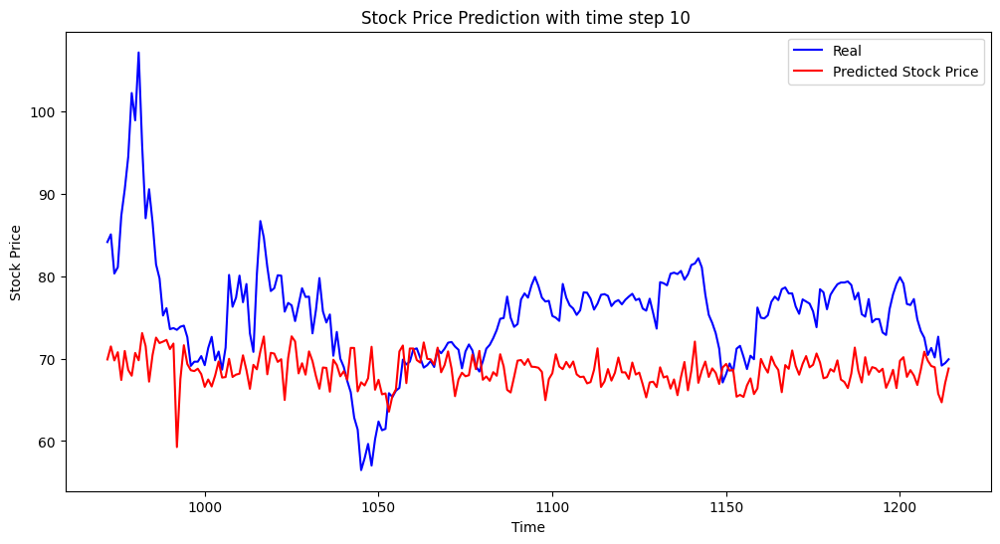

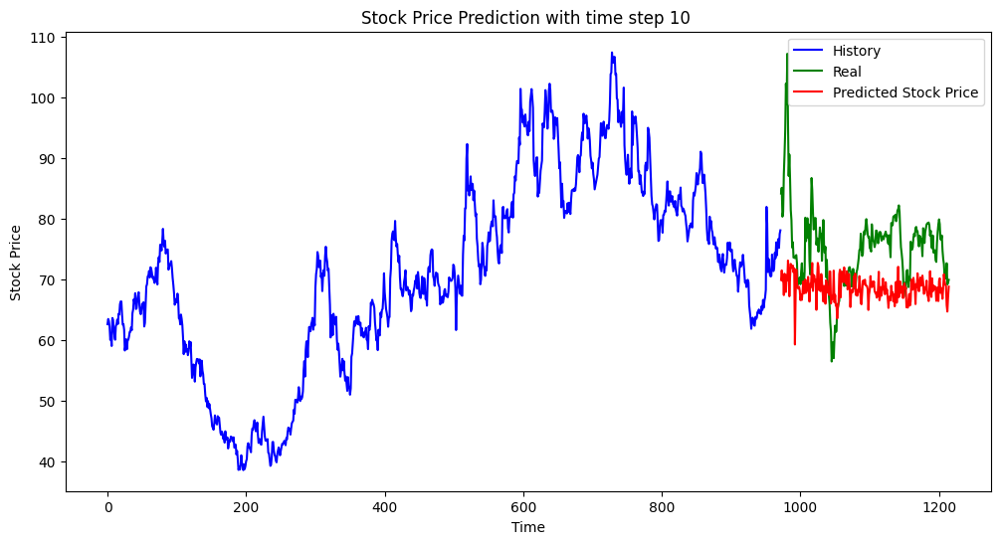

The MSE is 83.60064961990254
The MAE is 7.435033782316704
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 2s 23ms/step - loss: 42.8747 - mean_absolute_error: 6.4805 - val_loss: 70.9482 - val_mean_absolute_error: 7.8726
Epoch 2/800
23/23 [==============================] - 0s 7ms/step - loss: 5.5449 - mean_absolute_error: 1.8383 - val_loss: 24.8010 - val_mean_absolute_error: 3.9878
Epoch 3/800
23/23 [==============================] - 0s 7ms/step - loss: 0.8426 - mean_absolute_error: 0.7072 - val_loss: 19.9372 - val_mean_absolute_error: 3.3964
Epoch 4/800
23/23 [==============================] - 0s 7ms/step - loss: 0.5349 - mean_absolute_error: 0.5798 - val_loss: 21.9450 - val_mean_absolute_error: 3.6415
Epoch 5/800
23/23 [==============================] - 0s 7ms/step - loss: 0.6827 - mean_absolute_error: 0.6529 - val_loss: 22.4489 - val_mean_absolute_error: 3.7024
Epoch 6/800
23/23 [==============================] - 0s 7ms/step - loss: 0

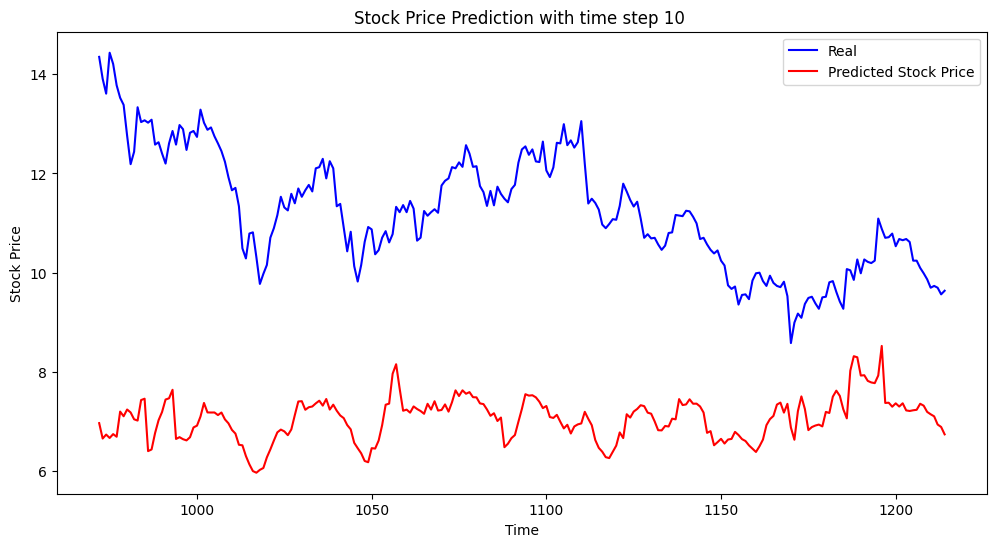

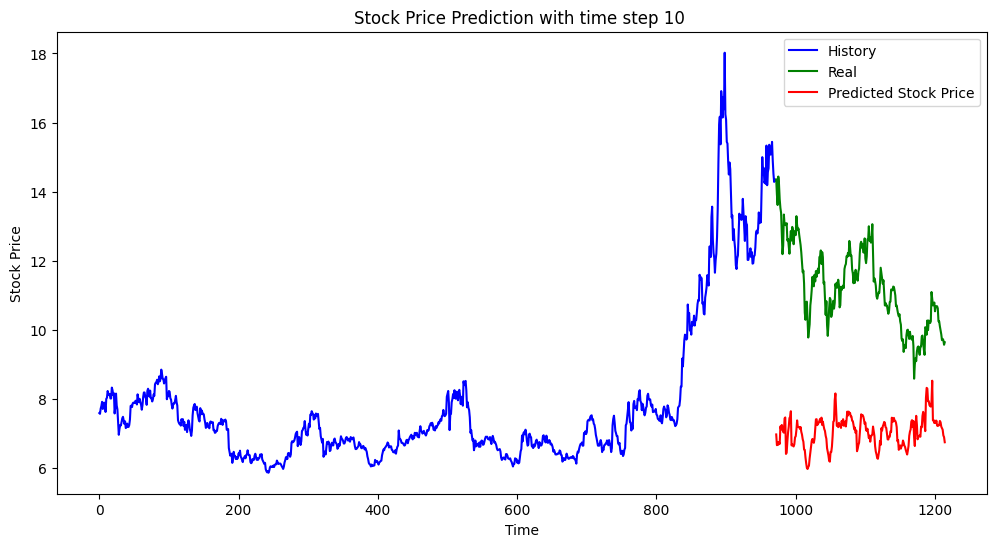

The MSE is 18.882447415566908
The MAE is 4.170320778441399
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 2s 33ms/step - loss: 1075.0830 - mean_absolute_error: 30.1590 - val_loss: 3540.4348 - val_mean_absolute_error: 57.2146
Epoch 2/800
23/23 [==============================] - 0s 6ms/step - loss: 513.8959 - mean_absolute_error: 20.7948 - val_loss: 1713.8695 - val_mean_absolute_error: 38.0492
Epoch 3/800
23/23 [==============================] - 0s 6ms/step - loss: 164.2375 - mean_absolute_error: 8.2696 - val_loss: 1138.0317 - val_mean_absolute_error: 29.5237
Epoch 4/800
23/23 [==============================] - 0s 6ms/step - loss: 178.3879 - mean_absolute_error: 10.1658 - val_loss: 1038.4598 - val_mean_absolute_error: 27.7863
Epoch 5/800
23/23 [==============================] - 0s 6ms/step - loss: 189.4661 - mean_absolute_error: 10.7990 - val_loss: 1040.1722 - val_mean_absolute_error: 27.8175
Epoch 6/800
23/23 [=========================

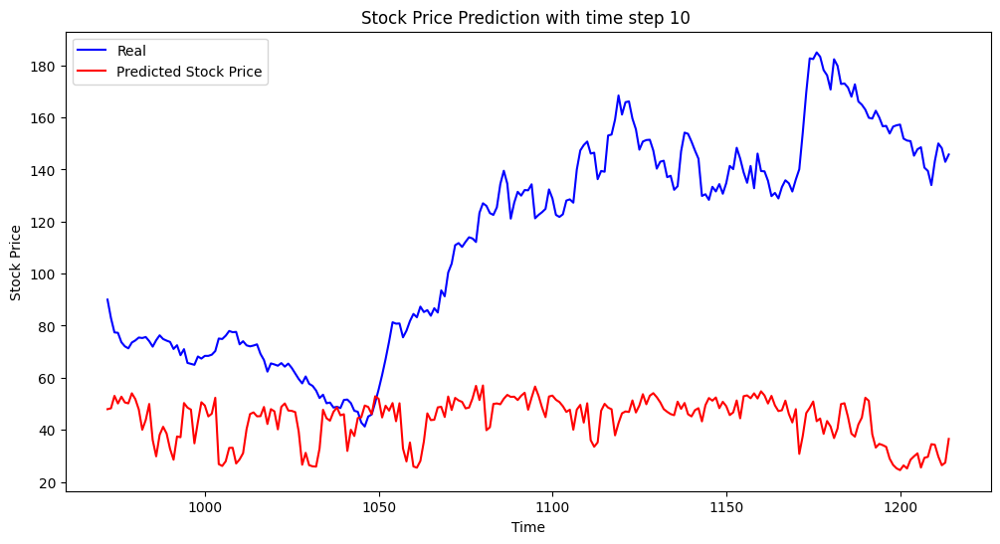

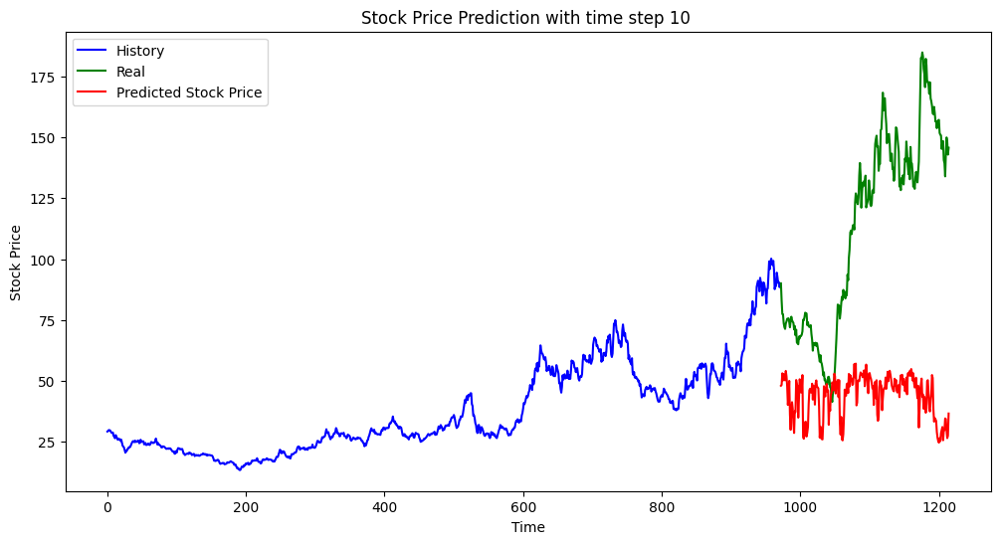

The MSE is 6393.9388247038105
The MAE is 69.32439426255895
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 2s 22ms/step - loss: 1388.3176 - mean_absolute_error: 34.7604 - val_loss: 2229.7236 - val_mean_absolute_error: 46.6593
Epoch 2/800
23/23 [==============================] - 0s 6ms/step - loss: 758.3077 - mean_absolute_error: 25.3456 - val_loss: 833.7939 - val_mean_absolute_error: 27.9505
Epoch 3/800
23/23 [==============================] - 0s 6ms/step - loss: 235.0208 - mean_absolute_error: 9.6798 - val_loss: 363.4825 - val_mean_absolute_error: 17.6322
Epoch 4/800
23/23 [==============================] - 0s 6ms/step - loss: 191.2355 - mean_absolute_error: 9.0171 - val_loss: 250.7236 - val_mean_absolute_error: 14.0762
Epoch 5/800
23/23 [==============================] - 0s 6ms/step - loss: 200.7436 - mean_absolute_error: 10.1542 - val_loss: 228.6899 - val_mean_absolute_error: 13.2705
Epoch 6/800
23/23 [==============================

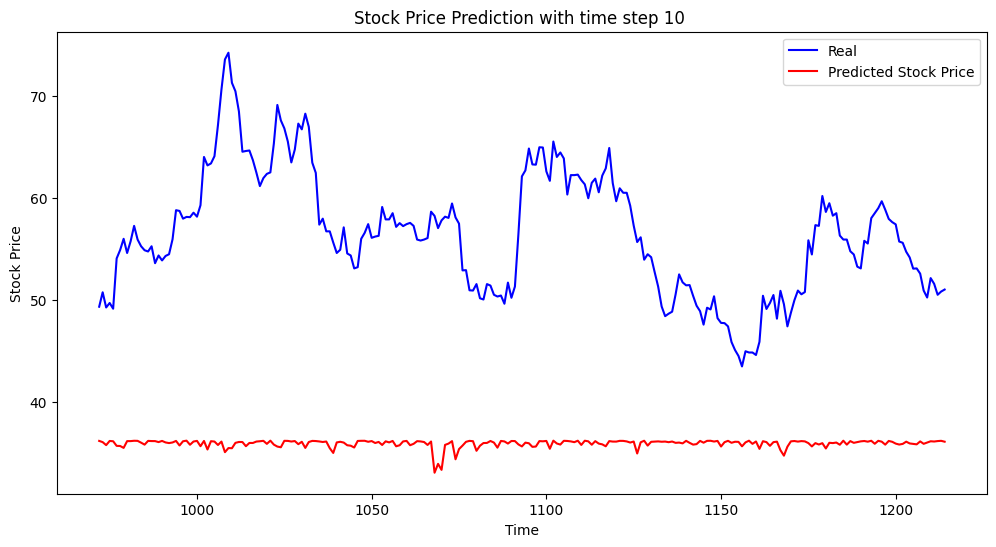

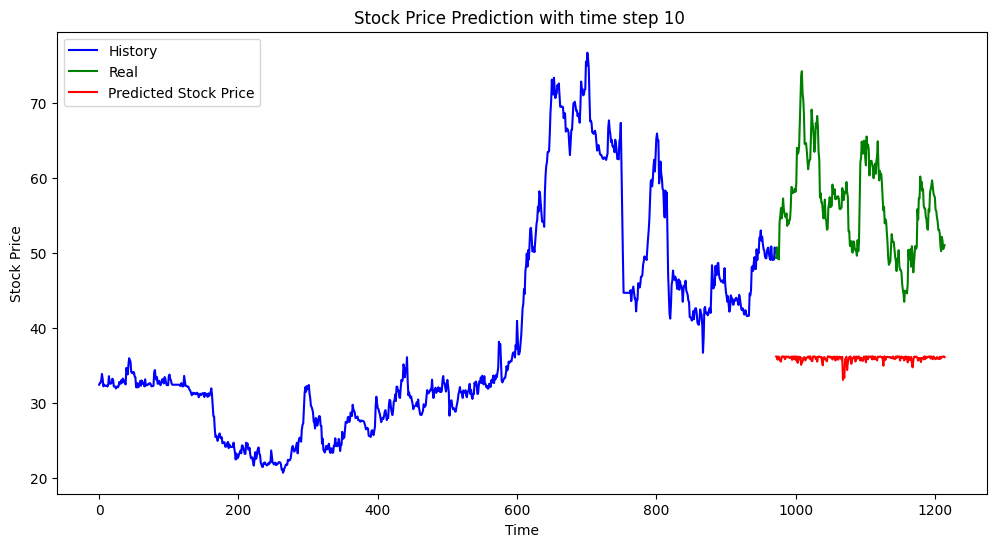

The MSE is 457.3003146036992
The MAE is 20.519875429907408


In [25]:
for instru in instru_list:
    data = pd.read_csv('./Chinese Stock Market/Selected Stock/price'+instru[:6]+'.csv', index_col=0)
    df = data.copy()
    lstm_mul_model = LSTMMODEL_MUL(df, time_step= 10, units = 50, batch_size = 32)
    train, test = lstm_mul_model.split_data(0.8, 0.2)
    frac_train = fraction_calculater(train.copy())
    frac_train_scaled = frac_train.copy()
    train_label = train['adj_cl'].copy()
    min_length = min(len(frac_train_scaled), len(train_label))
    train_scaled = frac_train_scaled[:min_length]
    train_label = train_label.iloc[:min_length]
    X_train, y_train = lstm_mul_model.transform_data(train_scaled, train_label)
    lstm_mul_model.build_model(X_train, y_train)

    predictions = []
    frac_test = fraction_calculater(test.copy())
    X_test = prepare_test_data_mul(frac_train, frac_test, lstm_mul_model.time_step, lstm_mul_model.scaler)
    print(X_test.shape)
    for i in range(len(X_test)):
        testX = X_test[i].reshape(1, lstm_mul_model.time_step, X_test.shape[2])
        prediction = lstm_mul_model.predictions(testX)
        predictions.append(prediction[0,0])
    # Convert predictions
    predictions = pd.Series(predictions, index = test.index)

    # Plot predictions
    lstm_mul_model.plot_predictions(test['adj_cl'], predictions)

    # Plot the whole data
    lstm_mul_model.plot_full_data(train['adj_cl'], test['adj_cl'], predictions)

    # Evaluate the model
    # Calculate MSE and MAE
    mse = mean_squared_error(predictions, test['adj_cl'])
    mae = mean_absolute_error(predictions, test['adj_cl'])
    print(f'The MSE is {mse}')
    print(f'The MAE is {mae}')
    Error_multi_lstm.loc[instru]=[mse,mae]

(2) RNN

In [26]:
Error_multi_rnn=pd.DataFrame(columns=['mse','mae'])

(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 1s 11ms/step - loss: 722.1337 - mean_absolute_error: 25.0691 - val_loss: 656.6501 - val_mean_absolute_error: 25.4576
Epoch 2/800
23/23 [==============================] - 0s 4ms/step - loss: 295.9968 - mean_absolute_error: 13.9309 - val_loss: 230.3089 - val_mean_absolute_error: 14.8911
Epoch 3/800
23/23 [==============================] - 0s 4ms/step - loss: 145.3189 - mean_absolute_error: 10.0992 - val_loss: 81.8696 - val_mean_absolute_error: 8.5616
Epoch 4/800
23/23 [==============================] - 0s 5ms/step - loss: 177.7251 - mean_absolute_error: 10.1914 - val_loss: 33.1555 - val_mean_absolute_error: 4.9848
Epoch 5/800
23/23 [==============================] - 0s 4ms/step - loss: 183.5590 - mean_absolute_error: 11.0921 - val_loss: 131.8159 - val_mean_absolute_error: 11.0993
Epoch 6/800
23/23 [=====================

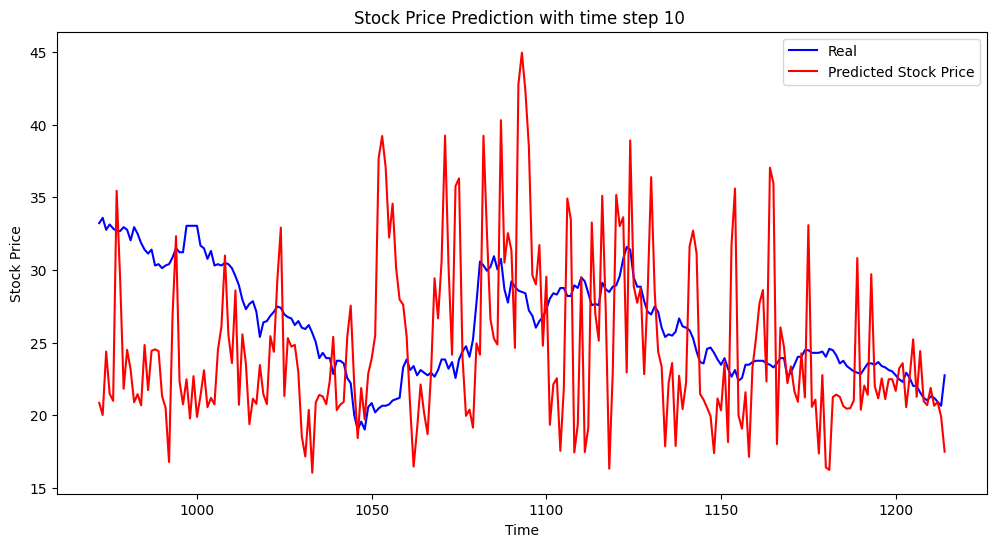

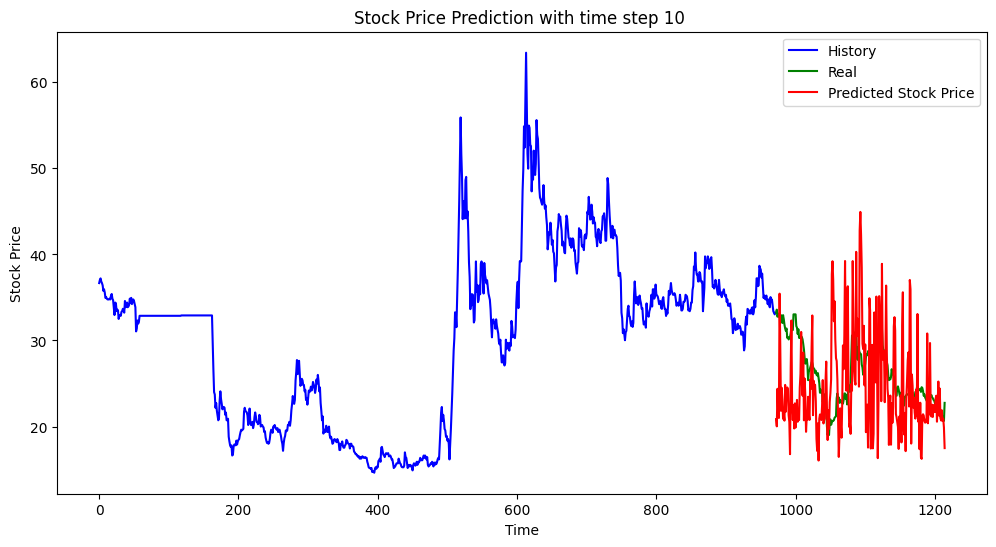

The MSE is 44.26381912954689
The MAE is 5.287009134428772
(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 1s 11ms/step - loss: 4321.8174 - mean_absolute_error: 64.2123 - val_loss: 4926.2949 - val_mean_absolute_error: 69.5519
Epoch 2/800
23/23 [==============================] - 0s 4ms/step - loss: 2888.7061 - mean_absolute_error: 51.8628 - val_loss: 3317.6255 - val_mean_absolute_error: 56.8220
Epoch 3/800
23/23 [==============================] - 0s 4ms/step - loss: 1771.5706 - mean_absolute_error: 39.5642 - val_loss: 2138.6614 - val_mean_absolute_error: 45.2748
Epoch 4/800
23/23 [==============================] - 0s 4ms/step - loss: 1041.8192 - mean_absolute_error: 28.7091 - val_loss: 1347.8923 - val_mean_absolute_error: 35.4832
Epoch 5/800
23/23 [==============================] - 0s 4ms/step - loss: 620.2728 - mean_absolute_error: 20.9991 - val_loss: 857.6662 - val

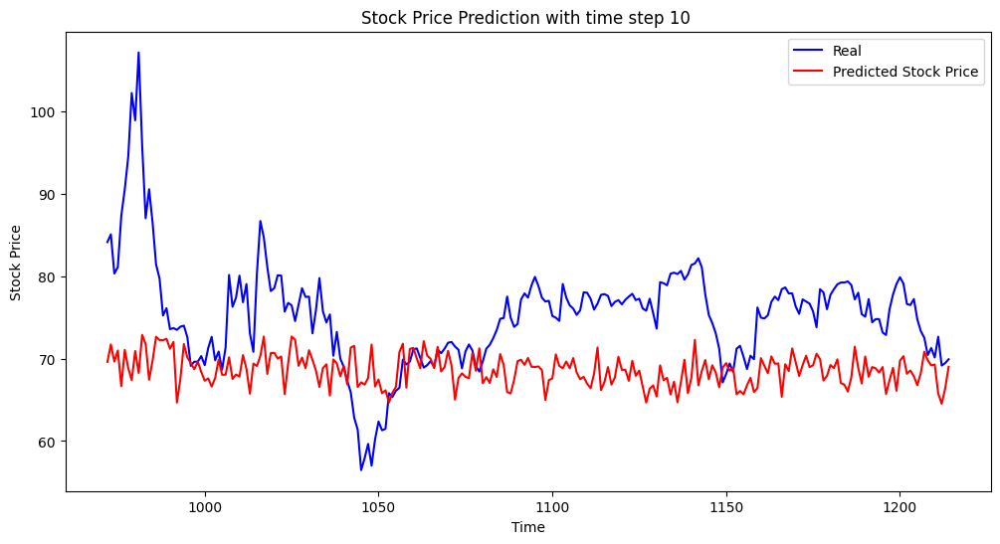

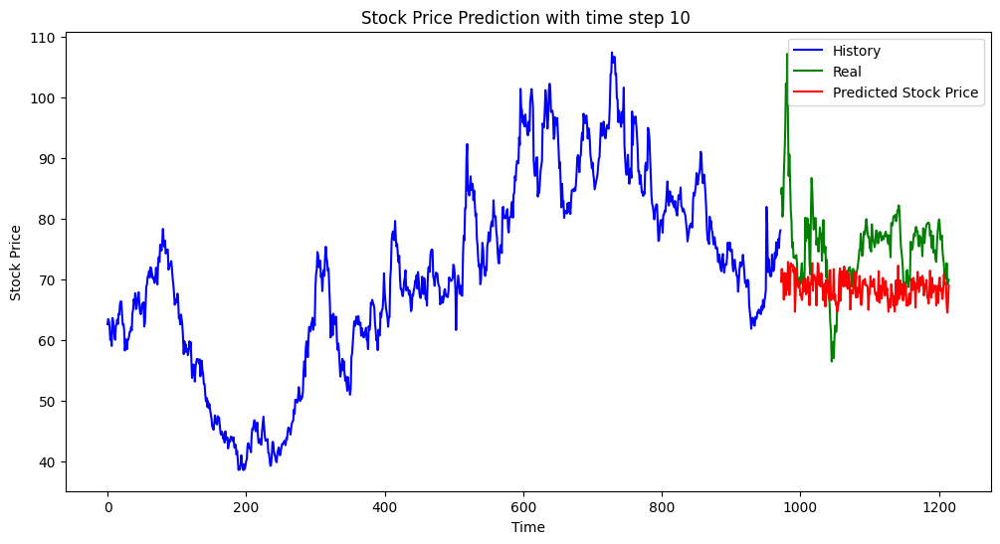

The MSE is 84.56916789715427
The MAE is 7.441074356027279
(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 1s 11ms/step - loss: 21.1447 - mean_absolute_error: 3.8457 - val_loss: 13.1729 - val_mean_absolute_error: 2.8308
Epoch 2/800
23/23 [==============================] - 0s 4ms/step - loss: 1.2161 - mean_absolute_error: 0.8717 - val_loss: 24.4516 - val_mean_absolute_error: 3.9296
Epoch 3/800
23/23 [==============================] - 0s 4ms/step - loss: 1.0766 - mean_absolute_error: 0.8404 - val_loss: 22.3688 - val_mean_absolute_error: 3.6808
Epoch 4/800
23/23 [==============================] - 0s 4ms/step - loss: 0.8354 - mean_absolute_error: 0.7375 - val_loss: 22.2536 - val_mean_absolute_error: 3.6685
Epoch 5/800
23/23 [==============================] - 0s 4ms/step - loss: 0.8738 - mean_absolute_error: 0.7506 - val_loss: 22.1628 - val_mean_absolute_error: 3.6594
Ep

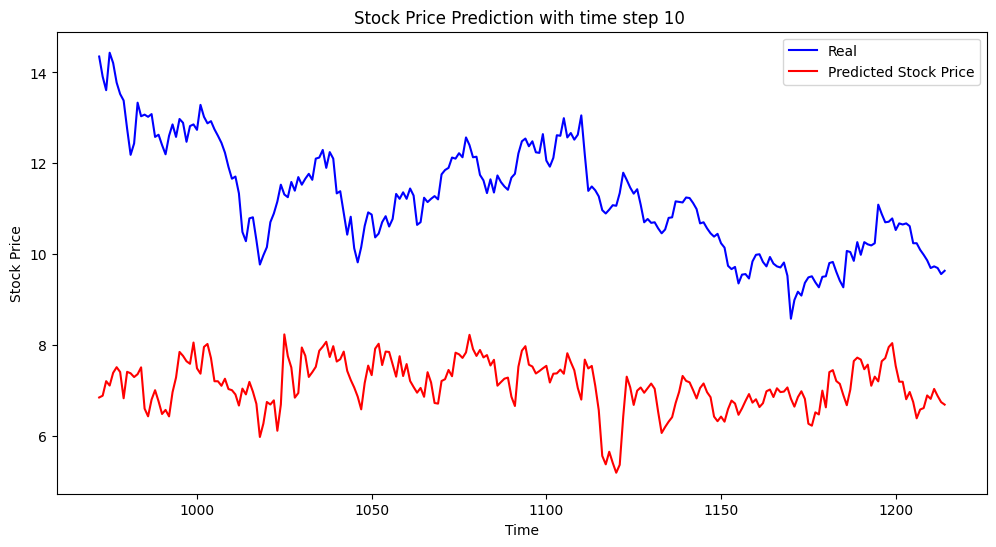

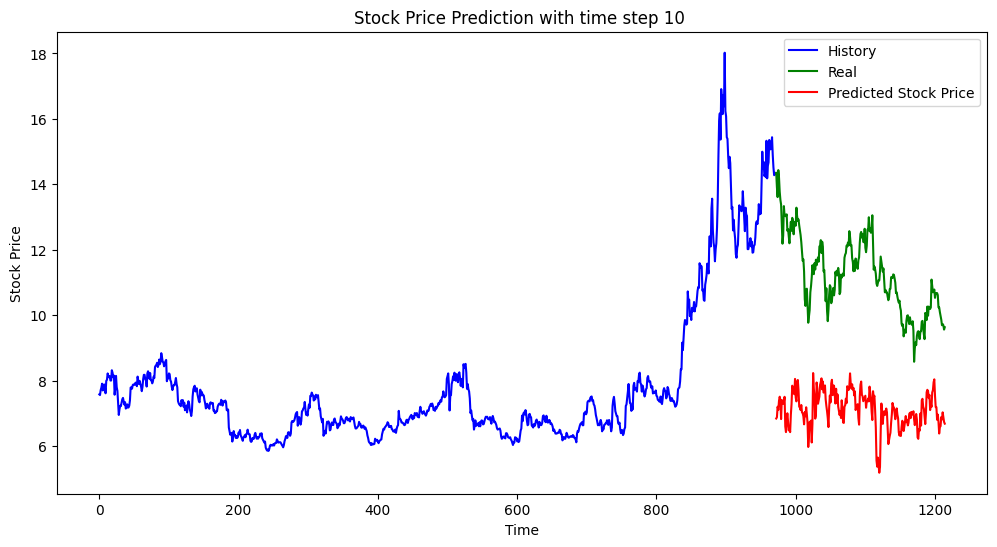

The MSE is 18.07840440875615
The MAE is 4.1062562423663564
(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 1s 11ms/step - loss: 860.8902 - mean_absolute_error: 27.2377 - val_loss: 2722.2175 - val_mean_absolute_error: 49.5547
Epoch 2/800
23/23 [==============================] - 0s 4ms/step - loss: 388.2321 - mean_absolute_error: 16.1896 - val_loss: 1811.4465 - val_mean_absolute_error: 39.3021
Epoch 3/800
23/23 [==============================] - 0s 4ms/step - loss: 200.1527 - mean_absolute_error: 9.3246 - val_loss: 1328.7285 - val_mean_absolute_error: 32.5878
Epoch 4/800
23/23 [==============================] - 0s 4ms/step - loss: 173.5389 - mean_absolute_error: 9.0660 - val_loss: 1130.2274 - val_mean_absolute_error: 29.3853
Epoch 5/800
23/23 [==============================] - 0s 5ms/step - loss: 181.9867 - mean_absolute_error: 10.1336 - val_loss: 1070.1787 - val_mea

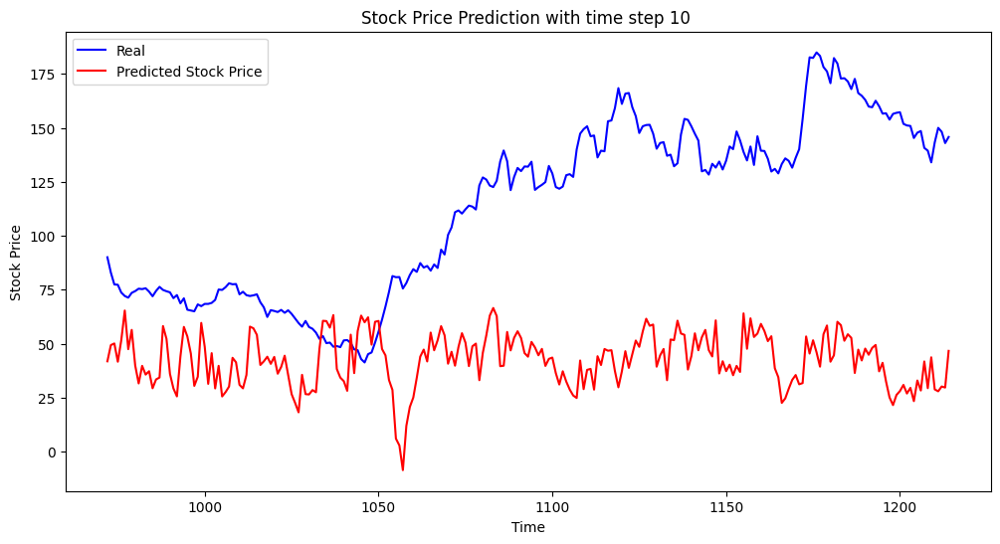

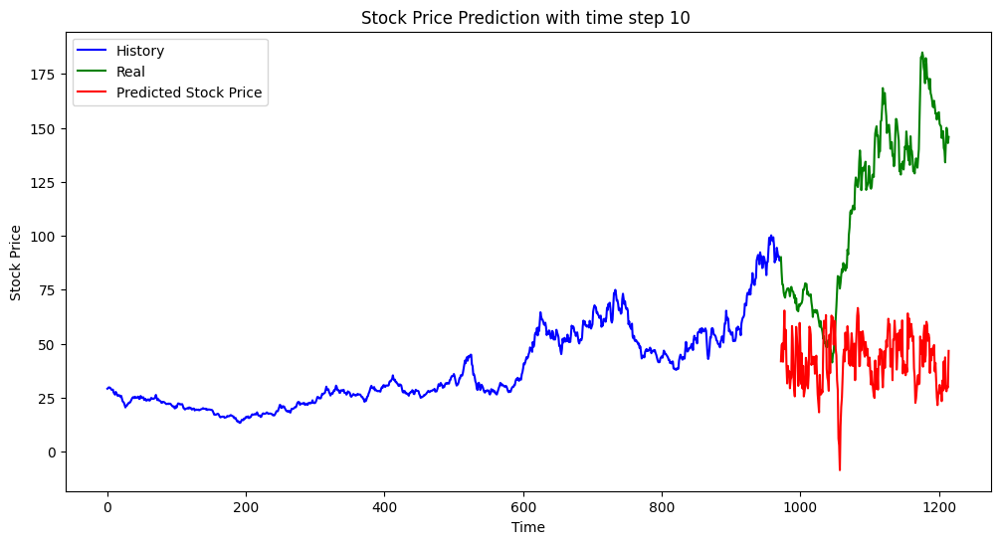

The MSE is 6671.852644088958
The MAE is 71.78775495662542
(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 1s 11ms/step - loss: 1205.2565 - mean_absolute_error: 32.5256 - val_loss: 1699.1725 - val_mean_absolute_error: 40.5790
Epoch 2/800
23/23 [==============================] - 0s 4ms/step - loss: 620.3986 - mean_absolute_error: 21.7836 - val_loss: 895.6093 - val_mean_absolute_error: 29.0356
Epoch 3/800
23/23 [==============================] - 0s 4ms/step - loss: 291.5923 - mean_absolute_error: 11.5397 - val_loss: 469.8785 - val_mean_absolute_error: 20.4288
Epoch 4/800
23/23 [==============================] - 0s 4ms/step - loss: 207.9653 - mean_absolute_error: 9.0083 - val_loss: 301.2407 - val_mean_absolute_error: 15.7713
Epoch 5/800
23/23 [==============================] - 0s 4ms/step - loss: 181.8506 - mean_absolute_error: 8.5635 - val_loss: 187.7370 - val_mean_ab

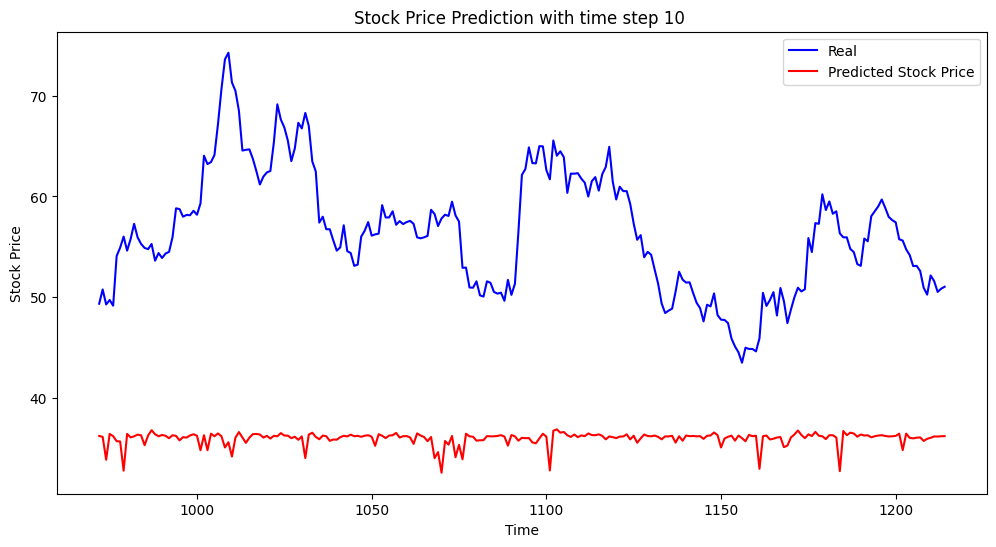

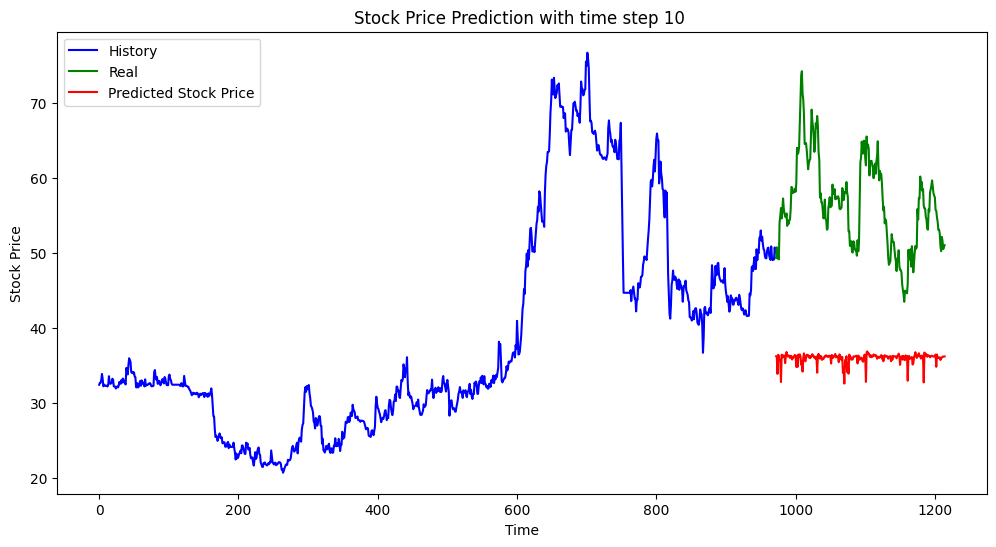

The MSE is 455.08324271695994
The MAE is 20.468421741399702


,mse,mae
002239.SZ,44.263819,5.287009
300406.SZ,84.569168,7.441074
601117.SH,18.078404,4.106256
600732.SH,6671.852644,71.787755
002735.SZ,455.083243,20.468422


In [27]:
for instru in instru_list:
    data = pd.read_csv('.\Chinese Stock Market\Selected Stock\price'+instru[:6]+'.csv', index_col=0)
    df = data.copy()

    rnn_mul_model = RNNMODEL_MUL(df, time_step= 10, units = 50, batch_size = 32)
    train, test = rnn_mul_model.split_data(0.8, 0.2)
    frac_train = fraction_calculater(train.copy())
    print(frac_train.shape)
    frac_train_scaled = frac_train.copy()
    print(frac_train_scaled.shape)
    print(type(frac_train))
    train_label = train['adj_cl'].copy()
    min_length = min(len(frac_train_scaled), len(train_label))
    train_scaled = frac_train_scaled[:min_length]
    train_label = train_label.iloc[:min_length]
    print(train_scaled.shape)
    print(train_label.shape)
    X_train, y_train = rnn_mul_model.transform_data(train_scaled, train_label)
    rnn_mul_model.build_model(X_train, y_train)

    # Predict
    predictions = []
    frac_test = fraction_calculater(test.copy())
    X_test = prepare_test_data_mul(frac_train, frac_test, rnn_mul_model.time_step, rnn_mul_model.scaler)
    print(X_test.shape)
    for i in range(len(X_test)):
        testX = X_test[i].reshape(1, rnn_mul_model.time_step, X_test.shape[2])
        prediction = rnn_mul_model.predictions(testX)
        predictions.append(prediction[0,0])

    # Convert predictions
    predictions = pd.Series(predictions, index = test.index)

    # Plot predictions
    rnn_mul_model.plot_predictions(test['adj_cl'], predictions)

    # Plot the whole data
    rnn_mul_model.plot_full_data(train['adj_cl'], test['adj_cl'], predictions)

    # Evaluate the model
    # Calculate MSE and MAE
    mse = mean_squared_error(predictions, test['adj_cl'])
    mae = mean_absolute_error(predictions, test['adj_cl'])
    print(f'The MSE is {mse}')
    print(f'The MAE is {mae}')
    Error_multi_rnn.loc[instru]=[mse,mae]
Error_multi_rnn

(3) GRU

In [28]:
Error_multi_gru=pd.DataFrame(columns=['mse','mae'])

(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 2s 20ms/step - loss: 879.6370 - mean_absolute_error: 27.8664 - val_loss: 1003.7014 - val_mean_absolute_error: 31.5450
Epoch 2/800
23/23 [==============================] - 0s 6ms/step - loss: 351.0355 - mean_absolute_error: 15.5282 - val_loss: 160.4315 - val_mean_absolute_error: 12.3216
Epoch 3/800
23/23 [==============================] - 0s 6ms/step - loss: 123.0934 - mean_absolute_error: 9.9304 - val_loss: 47.8364 - val_mean_absolute_error: 6.2631
Epoch 4/800
23/23 [==============================] - 0s 6ms/step - loss: 126.1182 - mean_absolute_error: 9.8382 - val_loss: 46.5014 - val_mean_absolute_error: 6.1566
Epoch 5/800
23/23 [==============================] - 0s 6ms/step - loss: 125.2682 - mean_absolute_error: 9.7610 - val_loss: 52.6001 - val_mean_absolute_error: 6.6327
Epoch 6/800
23/23 [=========================

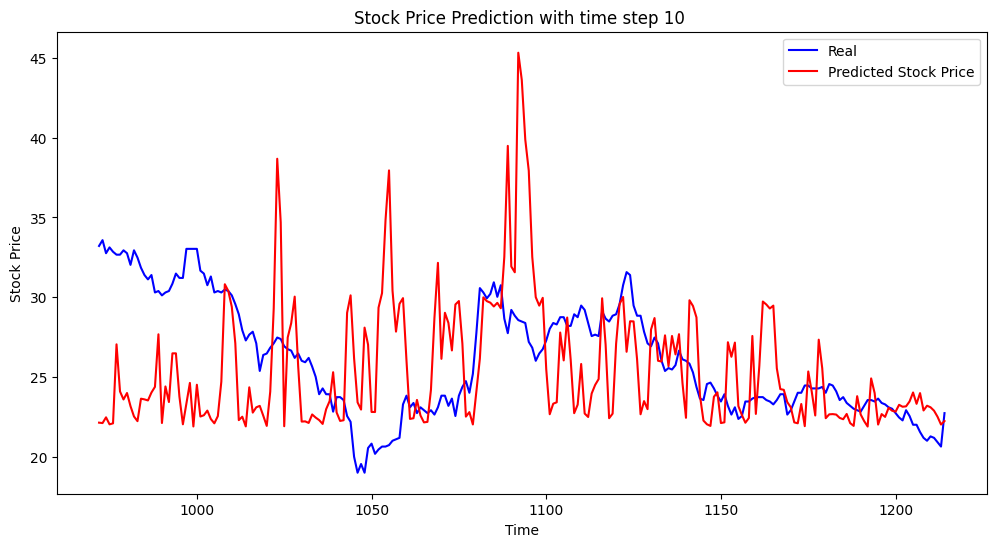

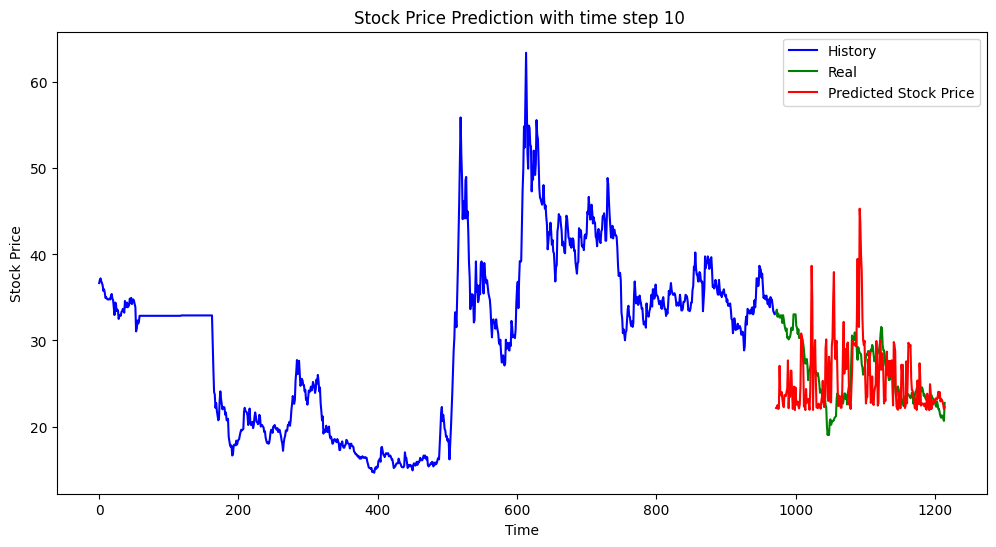

The MSE is 26.963578992137073
The MAE is 3.882142733307814
(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 2s 36ms/step - loss: 4754.7197 - mean_absolute_error: 67.1392 - val_loss: 5865.2759 - val_mean_absolute_error: 76.0030
Epoch 2/800
23/23 [==============================] - 0s 6ms/step - loss: 2886.7871 - mean_absolute_error: 52.3105 - val_loss: 2810.8569 - val_mean_absolute_error: 52.1720
Epoch 3/800
23/23 [==============================] - 0s 6ms/step - loss: 1319.8497 - mean_absolute_error: 33.5136 - val_loss: 1561.3242 - val_mean_absolute_error: 38.3716
Epoch 4/800
23/23 [==============================] - 0s 6ms/step - loss: 682.3521 - mean_absolute_error: 22.1467 - val_loss: 890.9604 - val_mean_absolute_error: 28.3203
Epoch 5/800
23/23 [==============================] - 0s 6ms/step - loss: 405.5790 - mean_absolute_error: 16.8626 - val_loss: 543.5498 - val_

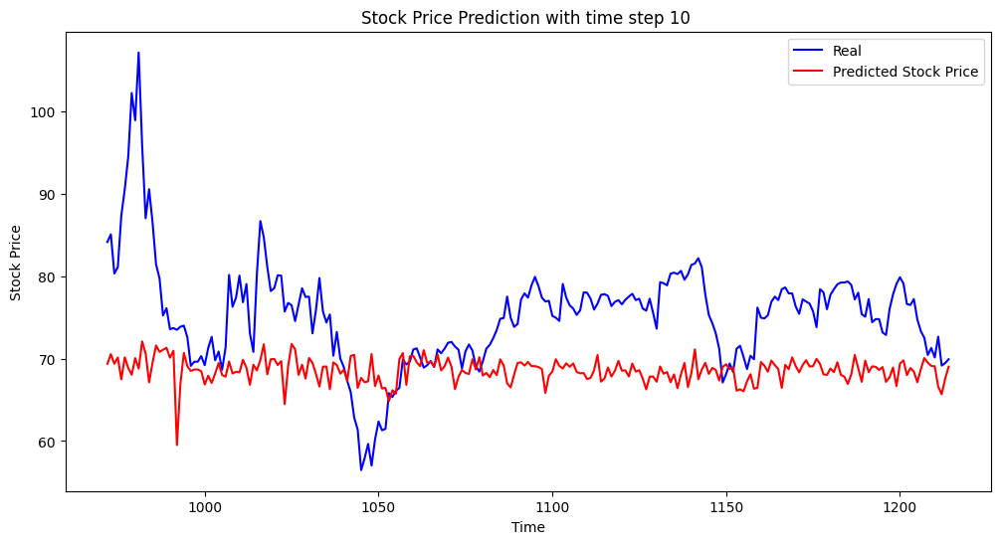

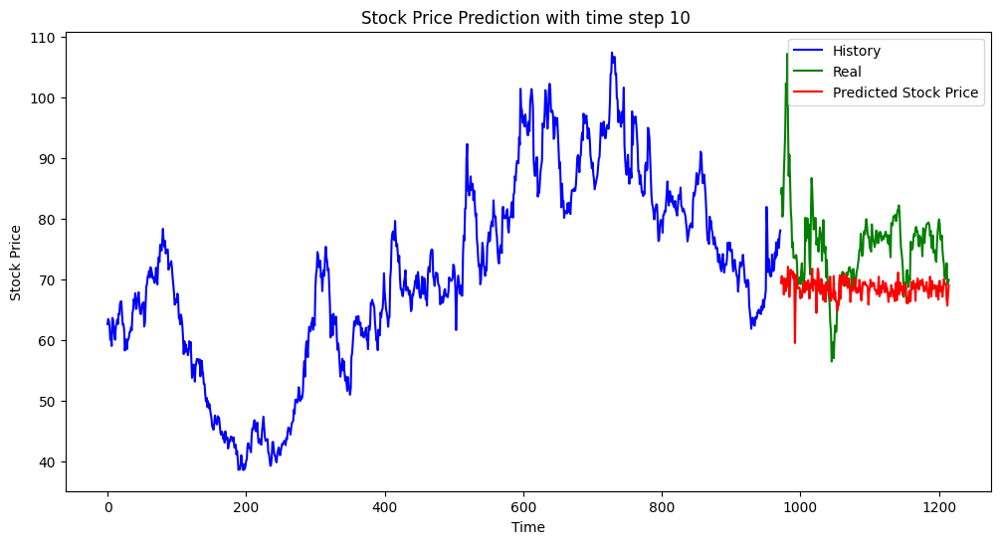

The MSE is 83.66225978314915
The MAE is 7.40671194931492
(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 2s 20ms/step - loss: 38.6447 - mean_absolute_error: 6.0874 - val_loss: 47.4893 - val_mean_absolute_error: 6.2035
Epoch 2/800
23/23 [==============================] - 0s 6ms/step - loss: 3.9521 - mean_absolute_error: 1.6543 - val_loss: 30.7068 - val_mean_absolute_error: 4.6633
Epoch 3/800
23/23 [==============================] - 0s 6ms/step - loss: 1.2692 - mean_absolute_error: 0.9049 - val_loss: 23.2274 - val_mean_absolute_error: 3.7916
Epoch 4/800
23/23 [==============================] - 0s 6ms/step - loss: 0.7334 - mean_absolute_error: 0.6857 - val_loss: 22.5955 - val_mean_absolute_error: 3.7172
Epoch 5/800
23/23 [==============================] - 0s 6ms/step - loss: 0.7346 - mean_absolute_error: 0.6811 - val_loss: 22.3850 - val_mean_absolute_error: 3.6936
Epo

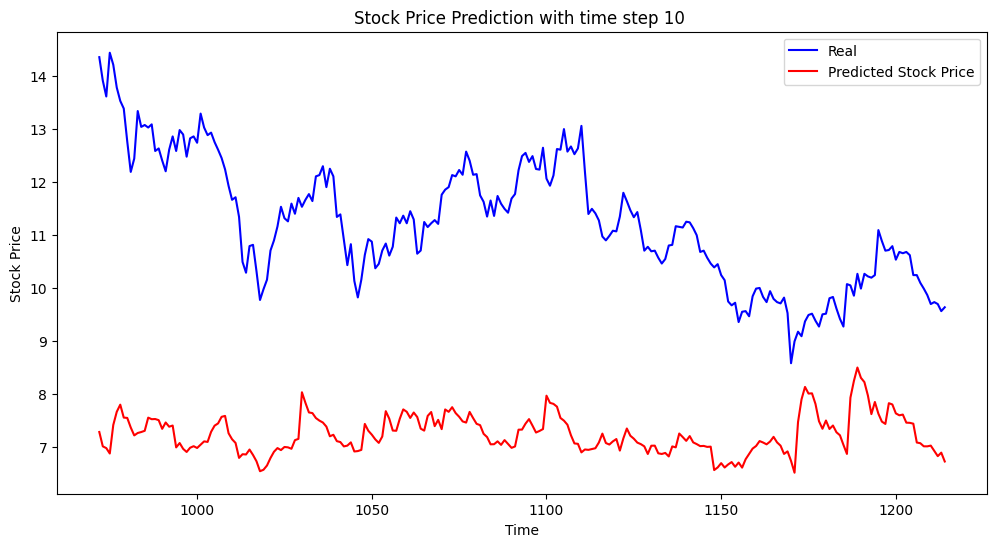

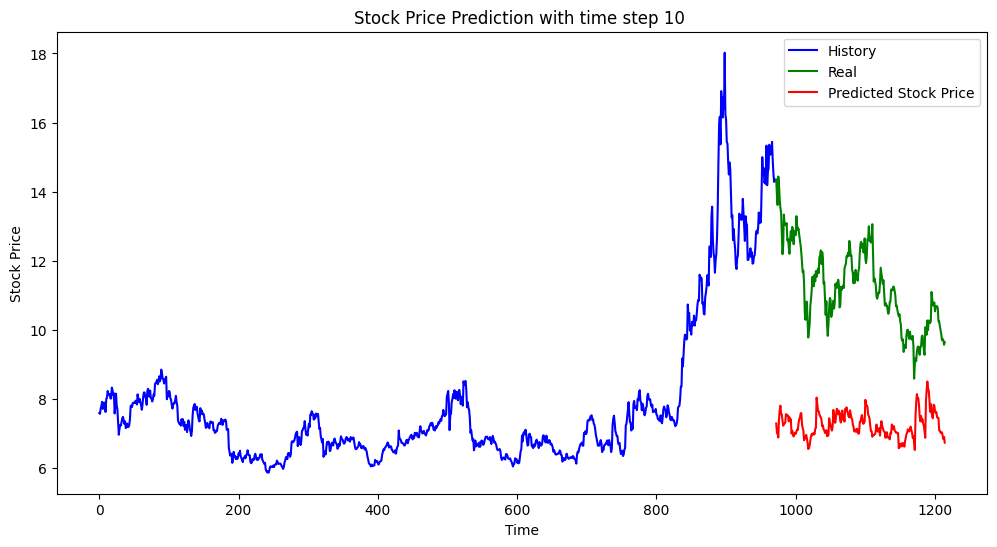

The MSE is 17.195852467744952
The MAE is 3.979723858459368
(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 2s 20ms/step - loss: 1045.4297 - mean_absolute_error: 29.7966 - val_loss: 3384.8994 - val_mean_absolute_error: 55.8412
Epoch 2/800
23/23 [==============================] - 0s 6ms/step - loss: 373.4592 - mean_absolute_error: 17.2150 - val_loss: 1409.4459 - val_mean_absolute_error: 33.8029
Epoch 3/800
23/23 [==============================] - 0s 6ms/step - loss: 162.4888 - mean_absolute_error: 8.8641 - val_loss: 1056.8737 - val_mean_absolute_error: 28.1041
Epoch 4/800
23/23 [==============================] - 0s 6ms/step - loss: 189.7266 - mean_absolute_error: 10.8127 - val_loss: 1029.6530 - val_mean_absolute_error: 27.6154
Epoch 5/800
23/23 [==============================] - 0s 6ms/step - loss: 192.4805 - mean_absolute_error: 10.8586 - val_loss: 1045.3627 - val_m

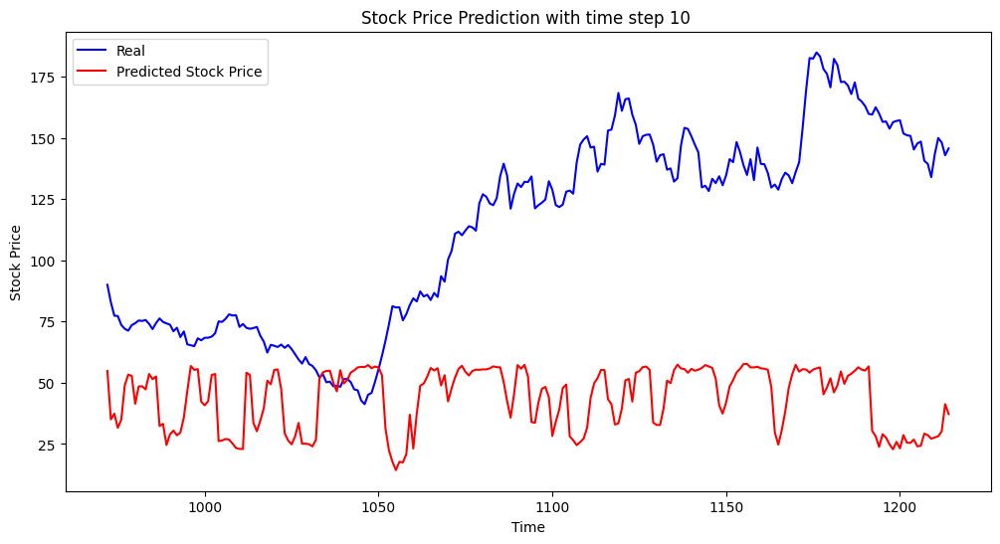

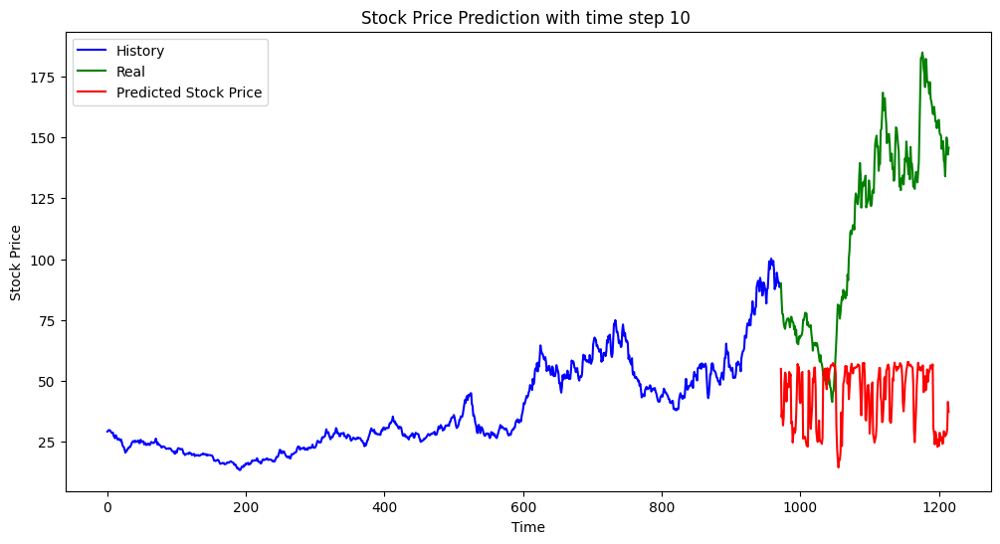

The MSE is 6456.694442930744
The MAE is 70.18198515868693
(972, 3)
(972, 3)
<class 'pandas.core.frame.DataFrame'>
(972, 3)
(972,)
Shape of X:  (962, 10, 3)
Shape of y:  (962,)
Epoch 1/800
23/23 [==============================] - 2s 21ms/step - loss: 1345.3556 - mean_absolute_error: 34.2877 - val_loss: 2052.3547 - val_mean_absolute_error: 44.7178
Epoch 2/800
23/23 [==============================] - 0s 6ms/step - loss: 544.3450 - mean_absolute_error: 20.4679 - val_loss: 572.3189 - val_mean_absolute_error: 22.7953
Epoch 3/800
23/23 [==============================] - 0s 6ms/step - loss: 195.3412 - mean_absolute_error: 8.7286 - val_loss: 283.4504 - val_mean_absolute_error: 15.1907
Epoch 4/800
23/23 [==============================] - 0s 6ms/step - loss: 195.0935 - mean_absolute_error: 9.7773 - val_loss: 230.4440 - val_mean_absolute_error: 13.3323
Epoch 5/800
23/23 [==============================] - 0s 5ms/step - loss: 205.1213 - mean_absolute_error: 10.5084 - val_loss: 226.4908 - val_mean_ab

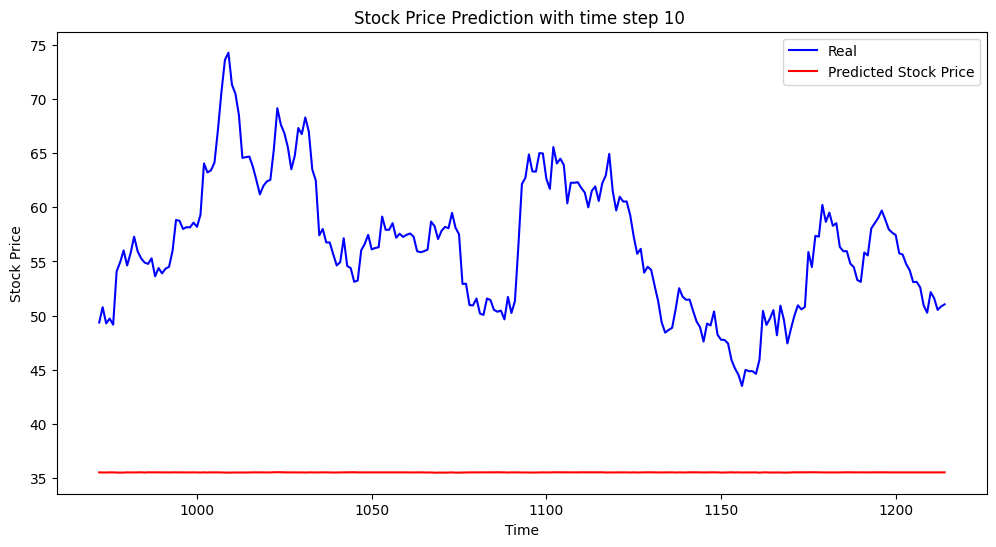

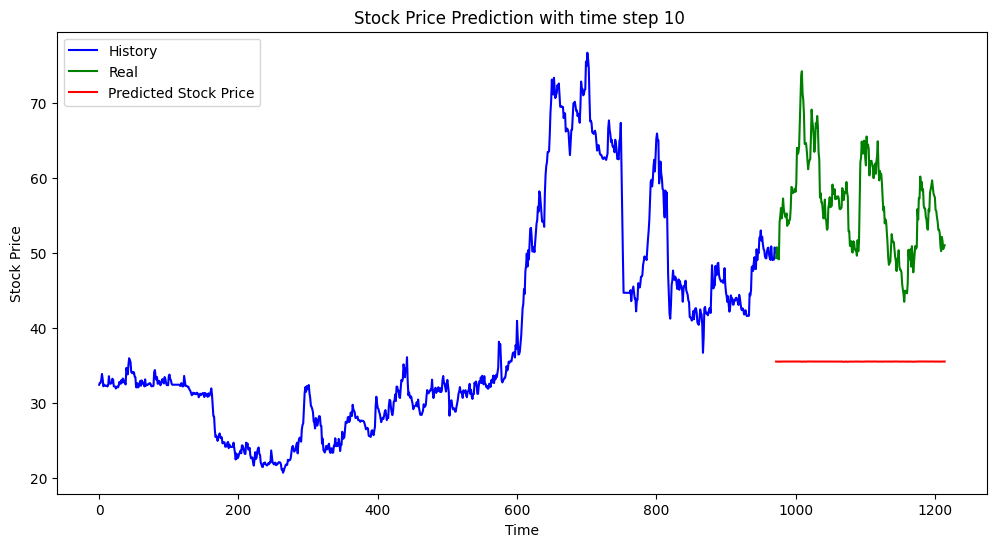

The MSE is 474.44826542431565
The MAE is 20.94689239064799


,mse,mae
002239.SZ,26.963579,3.882143
300406.SZ,83.662260,7.406712
601117.SH,17.195852,3.979724
600732.SH,6456.694443,70.181985
002735.SZ,474.448265,20.946892


In [29]:
for instru in instru_list:
    data = pd.read_csv('.\Chinese Stock Market\Selected Stock\price'+instru[:6]+'.csv', index_col=0)
    df = data.copy()

    gru_mul_model = GRU_MUL(df, time_step= 10, units = 50, batch_size = 32)
    train, test = gru_mul_model.split_data(0.8, 0.2)
    frac_train = fraction_calculater(train.copy())
    print(frac_train.shape)
    frac_train_scaled = frac_train.copy()
    print(frac_train_scaled.shape)
    print(type(frac_train))
    train_label = train['adj_cl'].copy()
    min_length = min(len(frac_train_scaled), len(train_label))
    train_scaled = frac_train_scaled[:min_length]
    train_label = train_label.iloc[:min_length]
    print(train_scaled.shape)
    print(train_label.shape)
    X_train, y_train = gru_mul_model.transform_data(train_scaled, train_label)
    gru_mul_model.build_model(X_train, y_train)

    # Predict
    predictions = []
    frac_test = fraction_calculater(test.copy())
    X_test = prepare_test_data_mul(frac_train, frac_test, gru_mul_model.time_step, gru_mul_model.scaler)
    print(X_test.shape)
    for i in range(len(X_test)):
        testX = X_test[i].reshape(1, gru_mul_model.time_step, X_test.shape[2])
        prediction = gru_mul_model.predictions(testX)
        predictions.append(prediction[0,0])

    # Convert predictions
    predictions = pd.Series(predictions, index = test.index)

    # Plot predictions
    gru_mul_model.plot_predictions(test['adj_cl'], predictions)

    # Plot the whole data
    gru_mul_model.plot_full_data(train['adj_cl'], test['adj_cl'], predictions)

    # Evaluate the model
    # Calculate MSE and MAE
    mse = mean_squared_error(predictions, test['adj_cl'])
    mae = mean_absolute_error(predictions, test['adj_cl'])
    print(f'The MSE is {mse}')
    print(f'The MAE is {mae}')
    Error_multi_gru.loc[instru]=[mse,mae]
Error_multi_gru

(4) HMM

In [35]:
Error_multi_hmm=pd.DataFrame(columns=['mse','mae'])

In [36]:
for instru in instru_list:
    data = pd.read_csv('.\Chinese Stock Market\Selected Stock\price'+instru[:6]+'.csv', index_col=0)
    df = data.copy()
    hmm_train, hmm_test = model_split_data(df, 0.8, 0.2)
    frac_vec = fraction_calculater(hmm_train)

    # Build the HMM model
    hmm_model = GaussianHMM(n_components=4)
    hmm_model.fit(frac_vec)

    possible_outcomes = discrete_range(20, 10, 10)

    prediction = predicted_close_price(hmm_test, hmm_model, possible_outcomes, latency_date = 10)
    # print(prediction)

    # Evaluate the model and plot the result


    #plot_predictions(hmm_test, prediction)

    mse = mean_squared_error(prediction, hmm_test['adj_cl'])
    mae = mean_absolute_error(prediction, hmm_test['adj_cl'])

    print(f'The MSE is {mse}')
    print(f'The MAE is {mae}')
    Error_multi_hmm.loc[instru]=[mse,mae]
Error_multi_hmm

The MSE is 0.6808020815061895
The MAE is 0.6437471757223314
The MSE is 7.062199507350187
The MAE is 2.0126334813452473
The MSE is 0.26463266136783853
The MAE is 0.44249896150554374
The MSE is 19.925018293115368
The MAE is 3.27584122248538
The MSE is 2.83958943561541
The MAE is 1.2243911973762183
The MSE is 0.26463266136783853
The MAE is 0.44249896150554374
The MSE is 3.7932840556933796
The MAE is 1.4494338148256447
The MSE is 0.5226089926295386
The MAE is 0.5073656816157679
The MSE is 3.096905240901051
The MAE is 1.1616847563352828
The MSE is 1.2763017023565086
The MAE is 0.8108471659194283
The MSE is 0.35130111391644675
The MAE is 0.42771139554256027
The MSE is 156.89378490573904
The MAE is 7.768810393458957
The MSE is 2.8904464643831034
The MAE is 1.2724600052090103
The MSE is 0.1102642010276405
The MAE is 0.2562346577084688
The MSE is 2.324749828342403
The MAE is 1.0629220133788175
The MSE is 0.275564879680968
The MAE is 0.3799472327875243
The MSE is 0.13469689354095088
The MAE is 0

,mse,mae
002239.SZ,0.680802,0.643747
300406.SZ,7.062200,2.012633
601117.SH,0.264633,0.442499
600732.SH,19.925018,3.275841
002735.SZ,2.839589,1.224391
300670.SZ,0.264633,0.442499
002453.SZ,3.793284,1.449434
603718.SH,0.522609,0.507366
300651.SZ,3.096905,1.161685
603881.SH,1.276302,0.810847


In [37]:
Error_multi_hmm.to_excel('./Multi_feature_result.xlsx')